<a href="https://colab.research.google.com/github/karunsri176/House-price-prediction/blob/main/Kishore_kumar_House_price_prediction_Kaggle_competition_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PART-1 DATA SET COLLECTION & INSPECTION

In [7]:
#importing python librarory
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter("ignore")

In [8]:
#connecting with google drive
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [15]:
#Path of file for both training and testing data set
train_path = "/content/drive/MyDrive/House price prediction/Copy of train (2).csv"
test_path = "/content/drive/MyDrive/House price prediction/Copy of test (1).csv"

In [16]:
#Uploading the training data set
df_train = pd.read_csv(train_path)
df_train.head()     #checking top 5 rows

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [17]:
df_train.tail(3) #checking bottom 3 rows

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [18]:
#Uploading the test data set
df_test = pd.read_csv(test_path)
df_test.head() #checking top 5 rows

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [19]:
df_test.tail()  #checking bottom 5 rows

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal
1458,2919,60,RL,74.0,9627,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal


In [20]:
df_train.shape     # Train shape

(1460, 81)

In [21]:
df_test.shape    #Test shape

(1459, 80)

In [22]:
df_train.columns    #checking column names

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [23]:
df_test.columns   #checking column names

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [24]:
df_train.info()   #information about data set.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [25]:
df_test.info() #information about data set.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

# PART-2 DATA CLEANING & MANIPULATION

In [26]:
#Checking the all features having null value in percentage format
print("Null percentage existance in features")
print("*************************************")
for i in df_train.columns:
  if round((df_train[i].isna().sum()/len(df_train[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_train[i].isna().sum()/len(df_train[i]))*100,3), "%")

Null percentage existance in features
*************************************
LotFrontage : 	 17.74 %
Alley : 	 93.767 %
MasVnrType : 	 0.548 %
MasVnrArea : 	 0.548 %
BsmtQual : 	 2.534 %
BsmtCond : 	 2.534 %
BsmtExposure : 	 2.603 %
BsmtFinType1 : 	 2.534 %
BsmtFinType2 : 	 2.603 %
Electrical : 	 0.068 %
FireplaceQu : 	 47.26 %
GarageType : 	 5.548 %
GarageYrBlt : 	 5.548 %
GarageFinish : 	 5.548 %
GarageQual : 	 5.548 %
GarageCond : 	 5.548 %
PoolQC : 	 99.521 %
Fence : 	 80.753 %
MiscFeature : 	 96.301 %


In [27]:
#Checking the all features having null value in percentage format
print("Null percentage existance in features")
print("*************************************")
for i in df_test.columns:
  if round((df_test[i].isna().sum()/len(df_test[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_test[i].isna().sum()/len(df_test[i]))*100,3), "%")

Null percentage existance in features
*************************************
MSZoning : 	 0.274 %
LotFrontage : 	 15.559 %
Alley : 	 92.666 %
Utilities : 	 0.137 %
Exterior1st : 	 0.069 %
Exterior2nd : 	 0.069 %
MasVnrType : 	 1.097 %
MasVnrArea : 	 1.028 %
BsmtQual : 	 3.016 %
BsmtCond : 	 3.084 %
BsmtExposure : 	 3.016 %
BsmtFinType1 : 	 2.879 %
BsmtFinSF1 : 	 0.069 %
BsmtFinType2 : 	 2.879 %
BsmtFinSF2 : 	 0.069 %
BsmtUnfSF : 	 0.069 %
TotalBsmtSF : 	 0.069 %
BsmtFullBath : 	 0.137 %
BsmtHalfBath : 	 0.137 %
KitchenQual : 	 0.069 %
Functional : 	 0.137 %
FireplaceQu : 	 50.034 %
GarageType : 	 5.209 %
GarageYrBlt : 	 5.346 %
GarageFinish : 	 5.346 %
GarageCars : 	 0.069 %
GarageArea : 	 0.069 %
GarageQual : 	 5.346 %
GarageCond : 	 5.346 %
PoolQC : 	 99.794 %
Fence : 	 80.123 %
MiscFeature : 	 96.504 %
SaleType : 	 0.069 %


In [28]:
#High null value dropping
null_high = []
for i in df_train.columns:
  if round((df_train[i].isna().sum()/len(df_train[i]))*100,3)>45.00:
    null_high.append(i)
null_high

['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']

In [29]:
#High null value dropping
null_high1 = []
for i in df_test.columns:
  if round((df_test[i].isna().sum()/len(df_test[i]))*100,3)>45.00:
    null_high1.append(i)
null_high1

['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']

Based on percentages of null values on train & test features are not importance beacuase the null values is more the then 45 percent, it will be no use of following features "

Alley : 93.767 %

FireplaceQu : 47.26 %

PoolQC : 99.521 %

Fence : 80.753 %

MiscFeature : 96.301 %

In [30]:
df_train = df_train[list(set(df_train.columns)-set(null_high))]

In [31]:
df_test = df_test[list(set(df_test.columns)-set(null_high1))]

In [32]:
df_train.shape

(1460, 76)

In [33]:
df_test.shape

(1459, 75)

In [34]:
df_train[df_train.duplicated()].shape

(0, 76)

In [35]:
df_test[df_test.duplicated()].shape

(0, 75)

In [36]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Foundation     1460 non-null   object 
 1   MSSubClass     1460 non-null   int64  
 2   BsmtFullBath   1460 non-null   int64  
 3   PavedDrive     1460 non-null   object 
 4   Exterior1st    1460 non-null   object 
 5   GarageCond     1379 non-null   object 
 6   MoSold         1460 non-null   int64  
 7   GarageFinish   1379 non-null   object 
 8   OverallQual    1460 non-null   int64  
 9   HeatingQC      1460 non-null   object 
 10  KitchenQual    1460 non-null   object 
 11  CentralAir     1460 non-null   object 
 12  MasVnrArea     1452 non-null   float64
 13  Condition1     1460 non-null   object 
 14  Heating        1460 non-null   object 
 15  GarageArea     1460 non-null   int64  
 16  BsmtExposure   1422 non-null   object 
 17  BsmtFinSF1     1460 non-null   int64  
 18  Id      

In [37]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Foundation     1459 non-null   object 
 1   MSSubClass     1459 non-null   int64  
 2   BsmtFullBath   1457 non-null   float64
 3   PavedDrive     1459 non-null   object 
 4   Exterior1st    1458 non-null   object 
 5   GarageCond     1381 non-null   object 
 6   MoSold         1459 non-null   int64  
 7   GarageFinish   1381 non-null   object 
 8   OverallQual    1459 non-null   int64  
 9   HeatingQC      1459 non-null   object 
 10  KitchenQual    1458 non-null   object 
 11  CentralAir     1459 non-null   object 
 12  MasVnrArea     1444 non-null   float64
 13  Condition1     1459 non-null   object 
 14  Heating        1459 non-null   object 
 15  GarageArea     1458 non-null   float64
 16  BsmtExposure   1415 non-null   object 
 17  BsmtFinSF1     1458 non-null   float64
 18  Id      

# Seprating the continous and discrete variables

In [38]:
print("Seprating the continous & discrete features from train data set:")
cont_variable = []
dis_variable = []
for i in df_train.columns:
  if len(df_train[i].unique())>=30:
    cont_variable.append(i)
  elif len(df_train[i].unique())<30:
    dis_variable.append(i)
print("Continues variable lengh:",len(cont_variable))
print("*******************************")
print("Continues variable:", cont_variable)
print("Discrete variable lengh:",len(dis_variable))
print("*******************************")
print("Discrete variable:", dis_variable)

Seprating the continous & discrete features from train data set:
Continues variable lengh: 20
*******************************
Continues variable: ['MasVnrArea', 'GarageArea', 'BsmtFinSF1', 'Id', 'GarageYrBlt', 'WoodDeckSF', 'BsmtFinSF2', 'LotArea', 'TotalBsmtSF', 'BsmtUnfSF', 'YearRemodAdd', '2ndFlrSF', 'SalePrice', 'EnclosedPorch', 'ScreenPorch', 'GrLivArea', 'OpenPorchSF', 'LotFrontage', 'YearBuilt', '1stFlrSF']
Discrete variable lengh: 56
*******************************
Discrete variable: ['Foundation', 'MSSubClass', 'BsmtFullBath', 'PavedDrive', 'Exterior1st', 'GarageCond', 'MoSold', 'GarageFinish', 'OverallQual', 'HeatingQC', 'KitchenQual', 'CentralAir', 'Condition1', 'Heating', 'BsmtExposure', 'ExterCond', 'BsmtCond', 'BsmtQual', 'TotRmsAbvGrd', 'SaleCondition', '3SsnPorch', 'YrSold', 'LandContour', 'SaleType', 'HouseStyle', 'LowQualFinSF', 'HalfBath', 'GarageCars', 'BsmtFinType1', 'BsmtFinType2', 'RoofMatl', 'FullBath', 'Functional', 'MSZoning', 'Electrical', 'GarageQual', 'Util

In [39]:
print("Seprating the continous & discrete features from test data set:")
cont_variable = []
dis_variable = []
for i in df_test.columns:
  if len(df_test[i].unique())>=30:
    cont_variable.append(i)
  elif len(df_test[i].unique())<30:
    dis_variable.append(i)
print("Continues variable lengh:",len(cont_variable))
print("*******************************")
print("Continues variable:", cont_variable)
print("Discrete variable lengh:",len(dis_variable))
print("*******************************")
print("Discrete variable:", dis_variable)

Seprating the continous & discrete features from test data set:
Continues variable lengh: 19
*******************************
Continues variable: ['MasVnrArea', 'GarageArea', 'BsmtFinSF1', 'Id', 'GarageYrBlt', 'WoodDeckSF', 'BsmtFinSF2', 'LotArea', 'TotalBsmtSF', 'BsmtUnfSF', 'YearRemodAdd', '2ndFlrSF', 'EnclosedPorch', 'ScreenPorch', 'GrLivArea', 'OpenPorchSF', 'LotFrontage', 'YearBuilt', '1stFlrSF']
Discrete variable lengh: 56
*******************************
Discrete variable: ['Foundation', 'MSSubClass', 'BsmtFullBath', 'PavedDrive', 'Exterior1st', 'GarageCond', 'MoSold', 'GarageFinish', 'OverallQual', 'HeatingQC', 'KitchenQual', 'CentralAir', 'Condition1', 'Heating', 'BsmtExposure', 'ExterCond', 'BsmtCond', 'BsmtQual', 'TotRmsAbvGrd', 'SaleCondition', '3SsnPorch', 'YrSold', 'LandContour', 'SaleType', 'HouseStyle', 'LowQualFinSF', 'HalfBath', 'GarageCars', 'BsmtFinType1', 'BsmtFinType2', 'RoofMatl', 'FullBath', 'Functional', 'MSZoning', 'Electrical', 'GarageQual', 'Utilities', 'Garag

In [40]:
dis_variable3 = ['MSSubClass', 'ExterCond', 'BsmtFinType1', 'Electrical', 'MSZoning', 'BsmtHalfBath', '3SsnPorch', 'LotShape', 
                'GarageCond', 'SaleCondition', 'MoSold', 'OverallQual', 'GarageType', 'GarageFinish', 'GarageQual', 'KitchenAbvGr',
                'LandContour', 'BsmtFullBath', 'BsmtExposure', 'Functional', 'RoofMatl', 'TotRmsAbvGrd', 'Condition1', 'BsmtCond', 
                'FullBath', 'CentralAir', 'Foundation', 'BsmtFinType2', 'Fireplaces', 'HouseStyle', 'Street', 'KitchenQual', 'BsmtQual', 
                'HeatingQC', 'BldgType', 'YrSold', 'Condition2', 'BedroomAbvGr', 'OverallCond', 'MasVnrType', 'MiscVal', 
                'RoofStyle', 'SaleType', 'Utilities', 'LandSlope', 'LotConfig', 'LowQualFinSF', 'PavedDrive', 'Neighborhood', 
                'PoolArea', 'Heating', 'ExterQual', 'HalfBath', 'GarageCars', 'Exterior2nd', 'Exterior1st']

cont_variable3 =  ['GarageArea', 'LotFrontage', 'EnclosedPorch', 'YearBuilt', 'Id', 'YearRemodAdd', '2ndFlrSF', 'BsmtFinSF2',
                  'BsmtFinSF1', 'MasVnrArea', 'OpenPorchSF', 'GarageYrBlt', 'GrLivArea', '1stFlrSF', 'ScreenPorch', 'WoodDeckSF', 'LotArea', 'BsmtUnfSF', 'TotalBsmtSF']

target_variable3 = "SalePrice"

In [41]:
dis_variable2 = ['LowQualFinSF', 'SaleCondition', 'RoofMatl', 'KitchenAbvGr', 'MasVnrType', 'BldgType', 'PoolArea',
                 'Condition2', 'KitchenQual', 'ExterQual', 'BsmtFullBath', 'TotRmsAbvGrd', 'MoSold', 'Neighborhood', 
                 'Foundation', 'GarageType', 'YrSold', 'MiscVal', 'OverallCond', 'Functional', 'CentralAir', 'LandContour',
                 'SaleType', 'GarageCars', 'OverallQual', 'HeatingQC', 'BsmtExposure', 'LandSlope', 'BsmtQual', 'Heating', 
                 'Exterior2nd', 'GarageFinish', 'Utilities', 'HouseStyle', 'BedroomAbvGr', 'BsmtHalfBath', 'LotConfig', 
                 '3SsnPorch', 'FullBath', 'Exterior1st', 'GarageCond', 'Street', 'Fireplaces', 'Condition1', 'BsmtCond',
                 'GarageQual', 'HalfBath', 'LotShape', 'RoofStyle', 'BsmtFinType1', 'PavedDrive', 'ExterCond', 'BsmtFinType2',
                 'MSSubClass', 'Electrical', 'MSZoning']

cont_variable2 = ['EnclosedPorch', 'MasVnrArea', 'Id', 'LotFrontage', 'GarageArea', 'BsmtUnfSF', 'TotalBsmtSF', 'GarageYrBlt', 
                  'ScreenPorch', 'LotArea', 'GrLivArea', '2ndFlrSF', 'OpenPorchSF', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF2', 'WoodDeckSF', 'BsmtFinSF1', '1stFlrSF']

# PART-3. EXPLORATARY DATA ANALYSIS

#3.1 UNIVARIATE ANALYSIS:

#3.1.1 Numeric feature

In [ ]:
df_train.describe() #Here displaying the summery of statistics for each numeric features

,PoolArea,TotalBsmtSF,BsmtUnfSF,GarageYrBlt,LotFrontage,YearRemodAdd,MiscVal,BsmtFinSF1,1stFlrSF,MoSold,...,SalePrice,MSSubClass,Fireplaces,OverallCond,OpenPorchSF,KitchenAbvGr,GarageArea,BedroomAbvGr,EnclosedPorch,LotArea
count,1460.000000,1460.000000,1460.000000,1379.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,2.758904,1057.429452,567.240411,1978.506164,70.049958,1984.865753,43.489041,443.639726,1162.626712,6.321918,...,180921.195890,56.897260,0.613014,5.575342,46.660274,1.046575,472.980137,2.866438,21.954110,10516.828082
std,40.177307,438.705324,441.866955,24.689725,24.284752,20.645407,496.123024,456.098091,386.587738,2.703626,...,79442.502883,42.300571,0.644666,1.112799,66.256028,0.220338,213.804841,0.815778,61.119149,9981.264932
min,0.000000,0.000000,0.000000,1900.000000,21.000000,1950.000000,0.000000,0.000000,334.000000,1.000000,...,34900.000000,20.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1300.000000
25%,0.000000,795.750000,223.000000,1961.000000,59.000000,1967.000000,0.000000,0.000000,882.000000,5.000000,...,129975.000000,20.000000,0.000000,5.000000,0.000000,1.000000,334.500000,2.000000,0.000000,7553.500000
50%,0.000000,991.500000,477.500000,1980.000000,69.000000,1994.000000,0.000000,383.500000,1087.000000,6.000000,...,163000.000000,50.000000,1.000000,5.000000,25.000000,1.000000,480.000000,3.000000,0.000000,9478.500000
75%,0.000000,1298.250000,808.000000,2002.000000,80.000000,2004.000000,0.000000,712.250000,1391.250000,8.000000,...,214000.000000,70.000000,1.000000,6.000000,68.000000,1.000000,576.000000,3.000000,0.000000,11601.500000
max,738.000000,6110.000000,2336.000000,2010.000000,313.000000,2010.000000,15500.000000,5644.000000,4692.000000,12.000000,...,755000.000000,190.000000,3.000000,9.000000,547.000000,3.000000,1418.000000,8.000000,552.000000,215245.000000


#3.1.1.a. Histograms plots

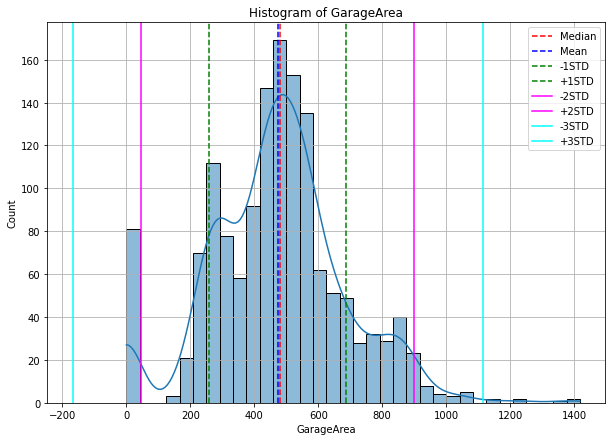

MeanofGarageArea 	 : 472.98
MedianofGarageArea 	 : 480.0
VarianceofGarageArea 	 : 45712.51
Standard Deviation of GarageArea 	 : 213.805
SkewofGarageArea 	 : 0.18
KurtofGarageArea 	 : 0.917
**************************************************


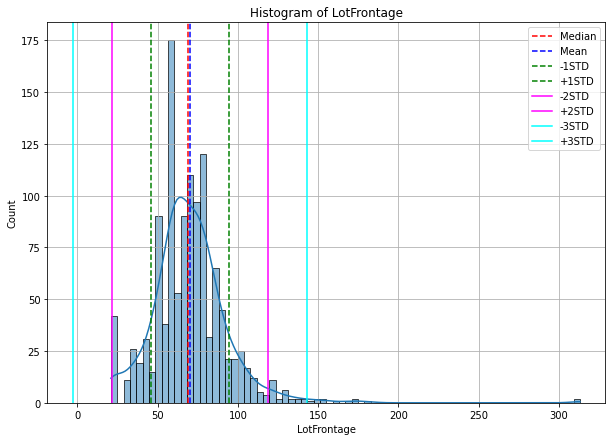

MeanofLotFrontage 	 : 70.05
MedianofLotFrontage 	 : 69.0
VarianceofLotFrontage 	 : 589.749
Standard Deviation of LotFrontage 	 : 24.285
SkewofLotFrontage 	 : 2.164
KurtofLotFrontage 	 : 17.453
**************************************************


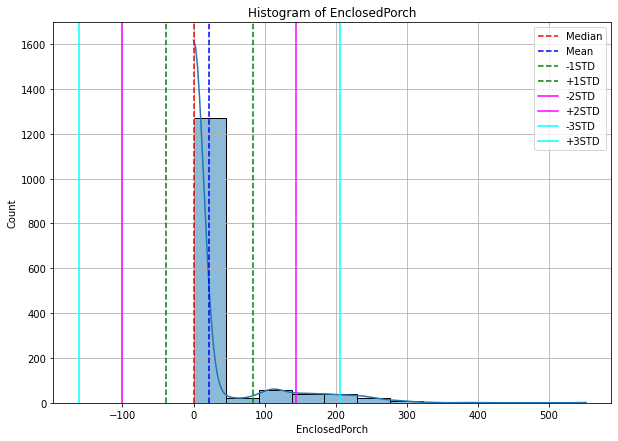

MeanofEnclosedPorch 	 : 21.954
MedianofEnclosedPorch 	 : 0.0
VarianceofEnclosedPorch 	 : 3735.55
Standard Deviation of EnclosedPorch 	 : 61.119
SkewofEnclosedPorch 	 : 3.09
KurtofEnclosedPorch 	 : 10.431
**************************************************


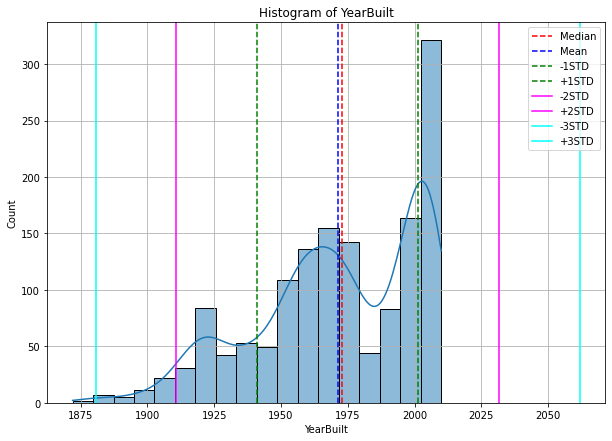

MeanofYearBuilt 	 : 1971.268
MedianofYearBuilt 	 : 1973.0
VarianceofYearBuilt 	 : 912.215
Standard Deviation of YearBuilt 	 : 30.203
SkewofYearBuilt 	 : -0.613
KurtofYearBuilt 	 : -0.44
**************************************************


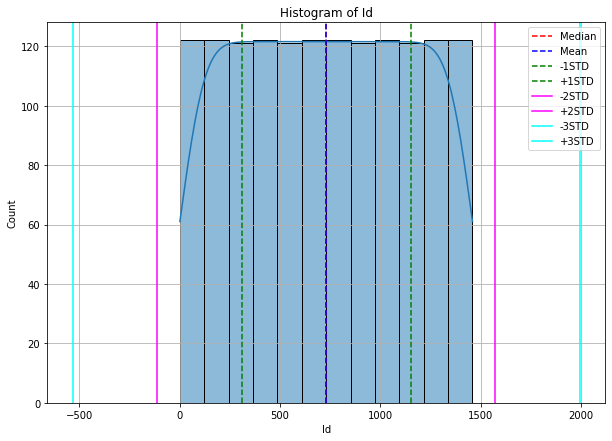

MeanofId 	 : 730.5
MedianofId 	 : 730.5
VarianceofId 	 : 177755.0
Standard Deviation of Id 	 : 421.61
SkewofId 	 : 0.0
KurtofId 	 : -1.2
**************************************************


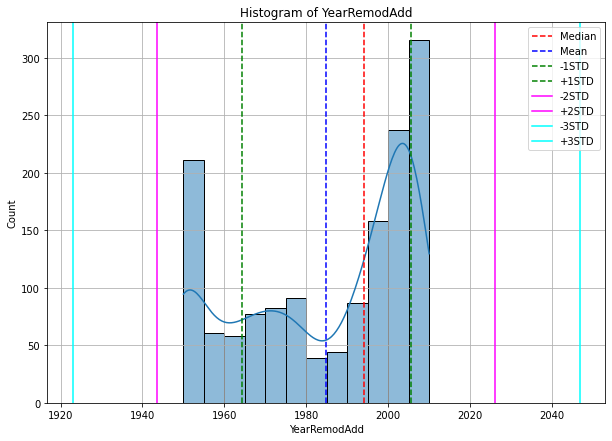

MeanofYearRemodAdd 	 : 1984.866
MedianofYearRemodAdd 	 : 1994.0
VarianceofYearRemodAdd 	 : 426.233
Standard Deviation of YearRemodAdd 	 : 20.645
SkewofYearRemodAdd 	 : -0.504
KurtofYearRemodAdd 	 : -1.272
**************************************************


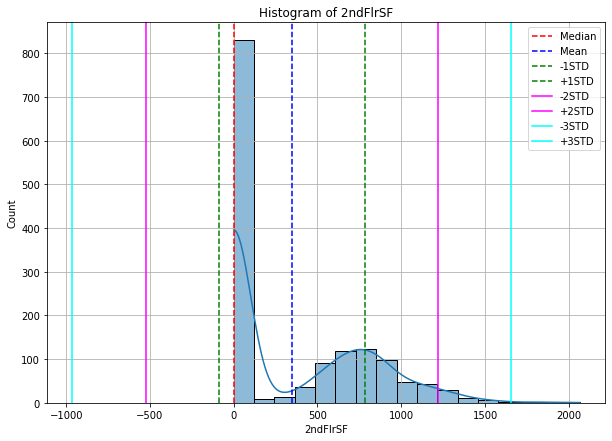

Meanof2ndFlrSF 	 : 346.992
Medianof2ndFlrSF 	 : 0.0
Varianceof2ndFlrSF 	 : 190557.075
Standard Deviation of 2ndFlrSF 	 : 436.528
Skewof2ndFlrSF 	 : 0.813
Kurtof2ndFlrSF 	 : -0.553
**************************************************


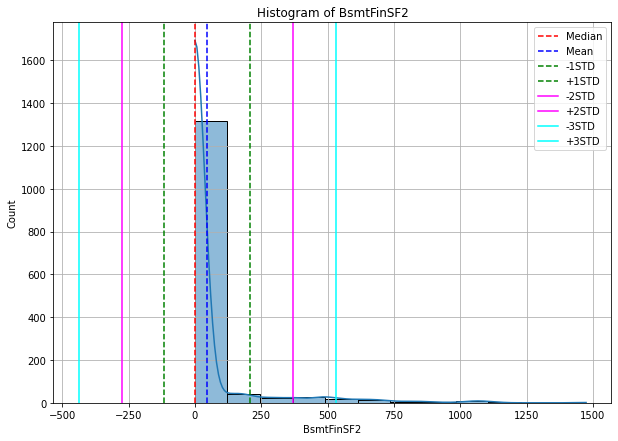

MeanofBsmtFinSF2 	 : 46.549
MedianofBsmtFinSF2 	 : 0.0
VarianceofBsmtFinSF2 	 : 26023.908
Standard Deviation of BsmtFinSF2 	 : 161.319
SkewofBsmtFinSF2 	 : 4.255
KurtofBsmtFinSF2 	 : 20.113
**************************************************


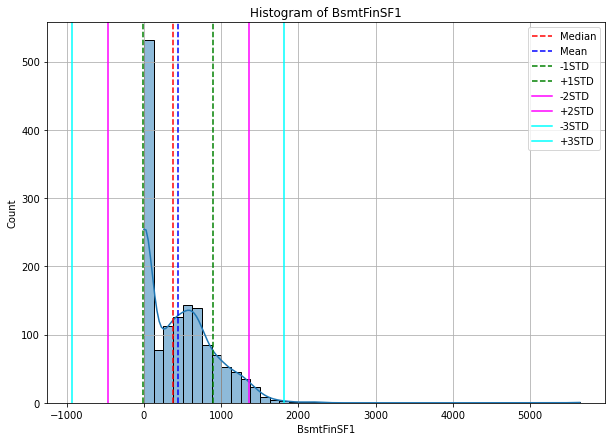

MeanofBsmtFinSF1 	 : 443.64
MedianofBsmtFinSF1 	 : 383.5
VarianceofBsmtFinSF1 	 : 208025.468
Standard Deviation of BsmtFinSF1 	 : 456.098
SkewofBsmtFinSF1 	 : 1.686
KurtofBsmtFinSF1 	 : 11.118
**************************************************


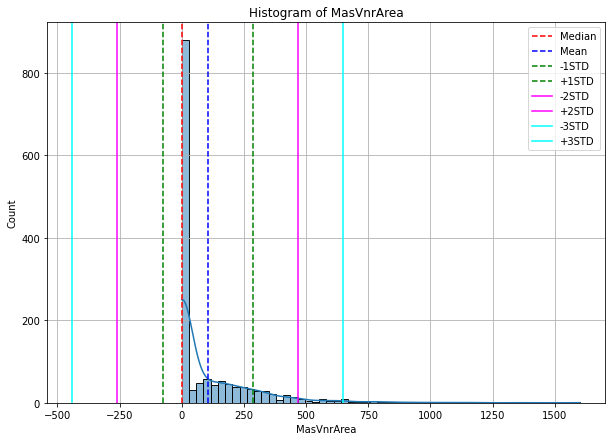

MeanofMasVnrArea 	 : 103.685
MedianofMasVnrArea 	 : 0.0
VarianceofMasVnrArea 	 : 32784.971
Standard Deviation of MasVnrArea 	 : 181.066
SkewofMasVnrArea 	 : 2.669
KurtofMasVnrArea 	 : 10.082
**************************************************


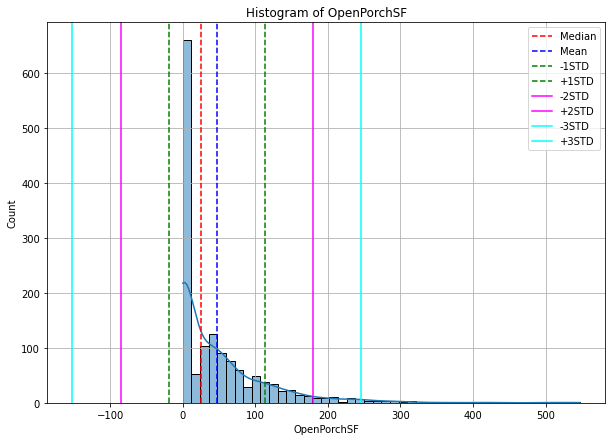

MeanofOpenPorchSF 	 : 46.66
MedianofOpenPorchSF 	 : 25.0
VarianceofOpenPorchSF 	 : 4389.861
Standard Deviation of OpenPorchSF 	 : 66.256
SkewofOpenPorchSF 	 : 2.364
KurtofOpenPorchSF 	 : 8.49
**************************************************


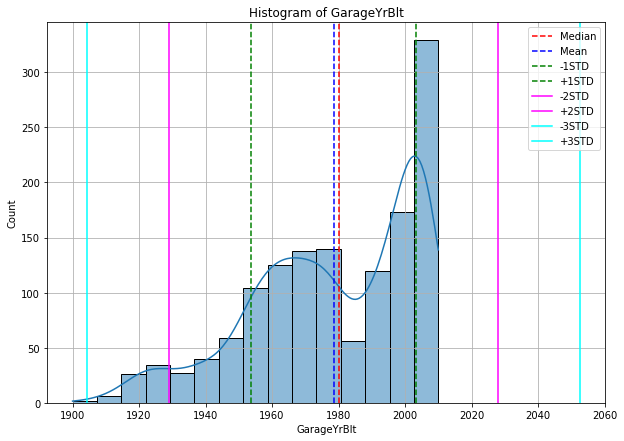

MeanofGarageYrBlt 	 : 1978.506
MedianofGarageYrBlt 	 : 1980.0
VarianceofGarageYrBlt 	 : 609.583
Standard Deviation of GarageYrBlt 	 : 24.69
SkewofGarageYrBlt 	 : -0.649
KurtofGarageYrBlt 	 : -0.418
**************************************************


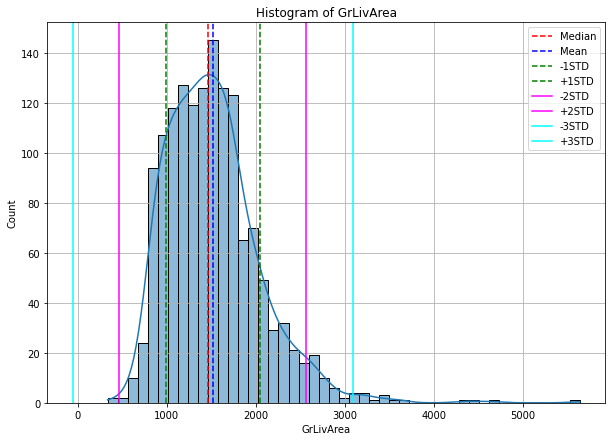

MeanofGrLivArea 	 : 1515.464
MedianofGrLivArea 	 : 1464.0
VarianceofGrLivArea 	 : 276129.633
Standard Deviation of GrLivArea 	 : 525.48
SkewofGrLivArea 	 : 1.367
KurtofGrLivArea 	 : 4.895
**************************************************


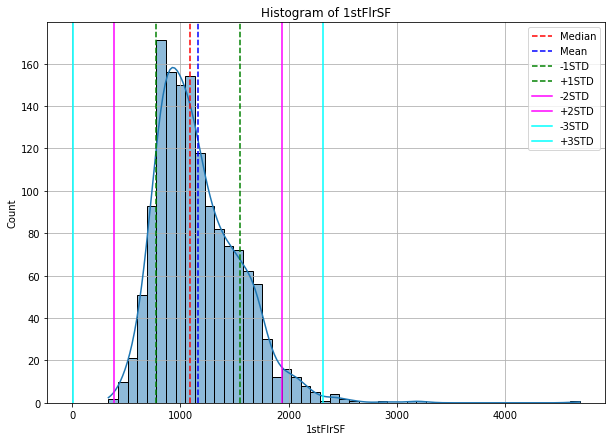

Meanof1stFlrSF 	 : 1162.627
Medianof1stFlrSF 	 : 1087.0
Varianceof1stFlrSF 	 : 149450.079
Standard Deviation of 1stFlrSF 	 : 386.588
Skewof1stFlrSF 	 : 1.377
Kurtof1stFlrSF 	 : 5.746
**************************************************


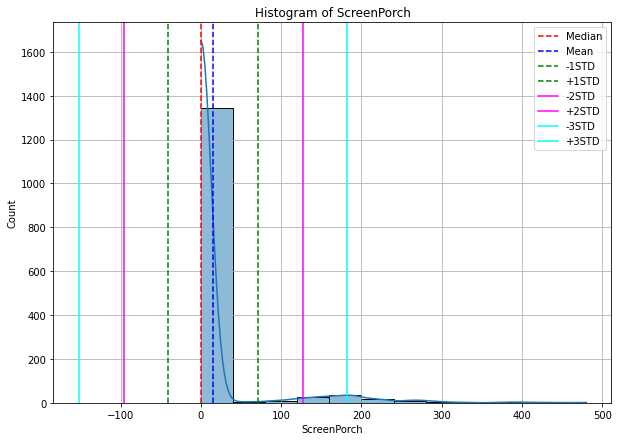

MeanofScreenPorch 	 : 15.061
MedianofScreenPorch 	 : 0.0
VarianceofScreenPorch 	 : 3108.889
Standard Deviation of ScreenPorch 	 : 55.757
SkewofScreenPorch 	 : 4.122
KurtofScreenPorch 	 : 18.439
**************************************************


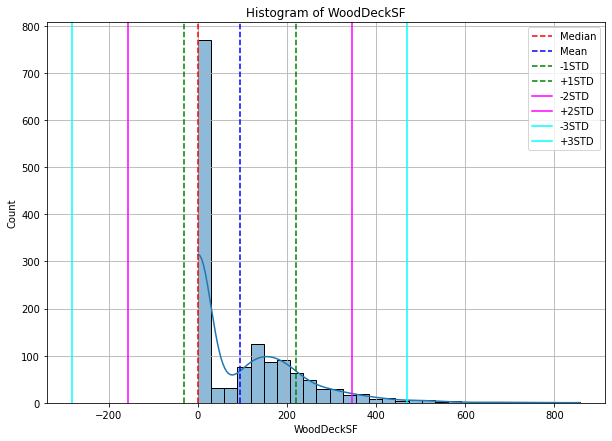

MeanofWoodDeckSF 	 : 94.245
MedianofWoodDeckSF 	 : 0.0
VarianceofWoodDeckSF 	 : 15709.813
Standard Deviation of WoodDeckSF 	 : 125.339
SkewofWoodDeckSF 	 : 1.541
KurtofWoodDeckSF 	 : 2.993
**************************************************


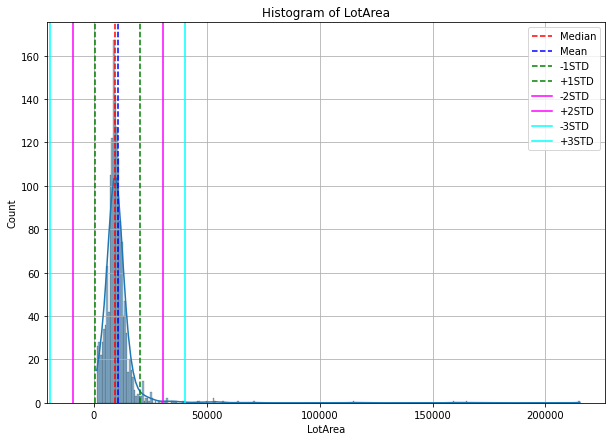

MeanofLotArea 	 : 10516.828
MedianofLotArea 	 : 9478.5
VarianceofLotArea 	 : 99625649.65
Standard Deviation of LotArea 	 : 9981.265
SkewofLotArea 	 : 12.208
KurtofLotArea 	 : 203.243
**************************************************


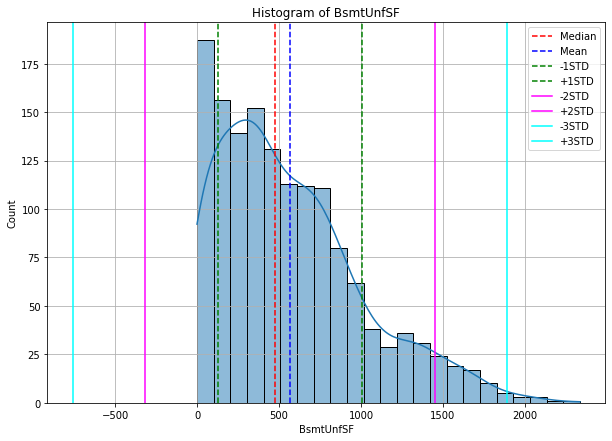

MeanofBsmtUnfSF 	 : 567.24
MedianofBsmtUnfSF 	 : 477.5
VarianceofBsmtUnfSF 	 : 195246.406
Standard Deviation of BsmtUnfSF 	 : 441.867
SkewofBsmtUnfSF 	 : 0.92
KurtofBsmtUnfSF 	 : 0.475
**************************************************


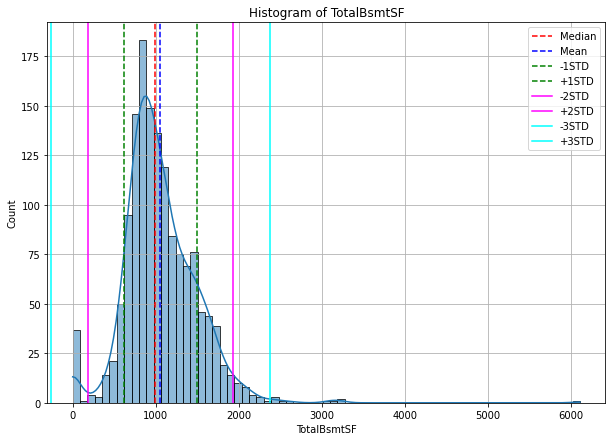

MeanofTotalBsmtSF 	 : 1057.429
MedianofTotalBsmtSF 	 : 991.5
VarianceofTotalBsmtSF 	 : 192462.362
Standard Deviation of TotalBsmtSF 	 : 438.705
SkewofTotalBsmtSF 	 : 1.524
KurtofTotalBsmtSF 	 : 13.25
**************************************************


In [ ]:
for i in cont_variable3:
  fig = plt.figure(figsize=(10,7))
  sns.histplot(data=df_train,x=i, kde=True).set_title("Histogram of" +" "+i)
  plt.axvline(df_train[i].median(),color = "r",ls="--",label="Median")
  plt.axvline(df_train[i].mean(), color = "b",ls="--", label="Mean")
  plt.axvline(df_train[i].mean()-df_train[i].std(), color = "g", ls="--", label = "-1STD")
  plt.axvline(df_train[i].mean()+df_train[i].std(), color = "g", ls= "--", label = "+1STD")
  plt.axvline(df_train[i].mean()-(2*df_train[i].std()), color = "magenta", label ="-2STD")
  plt.axvline(df_train[i].mean()+(2*df_train[i].std()), color = "magenta", label = "+2STD")
  plt.axvline(df_train[i].mean()-(3*df_train[i].std()), color = "cyan", label ="-3STD")
  plt.axvline(df_train[i].mean()+(3*df_train[i].std()), color = "cyan", label = "+3STD")
  plt.legend()
  plt.grid()
  plt.show()

  print("Mean" + "of" + str(i), "\t", ":", round(df_train[i].mean(),3))
  print("Median" + "of" + str(i), "\t", ":", round(df_train[i].median(),3))
  print("Variance"+ "of" + str(i), "\t", ":", round(df_train[i].var(),3))
  print("Standard Deviation" + " of " + str(i), "\t", ":", round(df_train[i].std(),3))
  print("Skew" + "of" + str(i), "\t", ":", round(df_train[i].skew(),3))
  print("Kurt" + "of" + str(i), "\t", ":", round(df_train[i].kurt(),3))
  print("**"*25)


#OR 
# """for i in cont_variable3:
#   sns.histplot(data = df_train, x=i, kde=True)
#   plt.title("Histogram")
#   plt.show()
#   print("Skewness:",round(df_train[i].skew(),2))
#   print("Kurt:", round(df_train[i].kurt(),2))
#   print("Variance:",round(df_train[i].var(),2))
#   print("Standard deviation:", round(df_train[i].std(),2))
#   print("**"*25)"""

#OR
# """cols = 4
# rows = 38
# num_cols = df_train.select_dtypes(exclude='object').columns
# fig = plt.figure( figsize=(cols*5, rows*3))
# for i, col in enumerate(num_cols):
    
#     ax=fig.add_subplot(rows,cols,i+1)
    
#     sns.histplot(x = df_train[col], ax = ax)
    
# fig.tight_layout()  
# plt.show()"""

#3.1.1.b. BOX PLOT

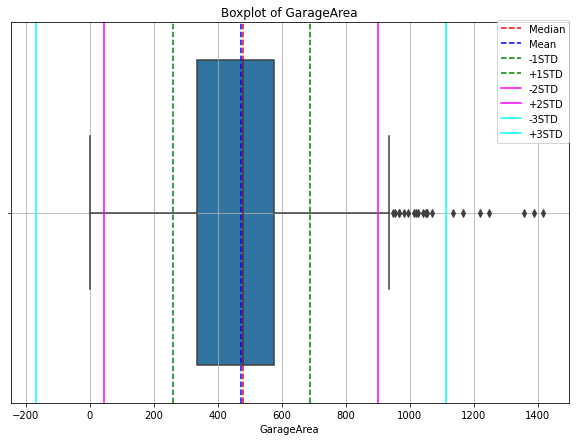

Mean of GarageArea 	 : 472.98
Median of GarageArea 	 : 480.0
Standard Deviation of GarageArea 	 : 213.805
Q1 of GarageArea 	 : -27.75
Q2 of GarageArea 	 : 334
Q3 of GarageArea 	 : 480
Q4 of GarageArea 	 : 576
Q5` of GarageArea 	 : 938.25
Kurt of GarageArea 	 : 0.917
**************************************************


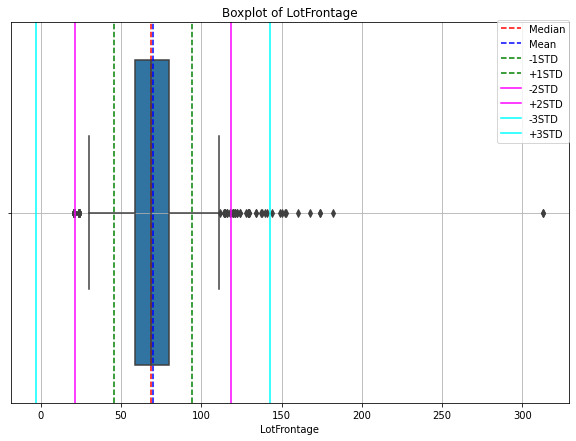

Mean of LotFrontage 	 : 70.05
Median of LotFrontage 	 : 69.0
Standard Deviation of LotFrontage 	 : 24.285
Q1 of LotFrontage 	 : 27.5
Q2 of LotFrontage 	 : 59
Q3 of LotFrontage 	 : 69
Q4 of LotFrontage 	 : 80
Q5` of LotFrontage 	 : 111.5
Kurt of LotFrontage 	 : 17.453
**************************************************


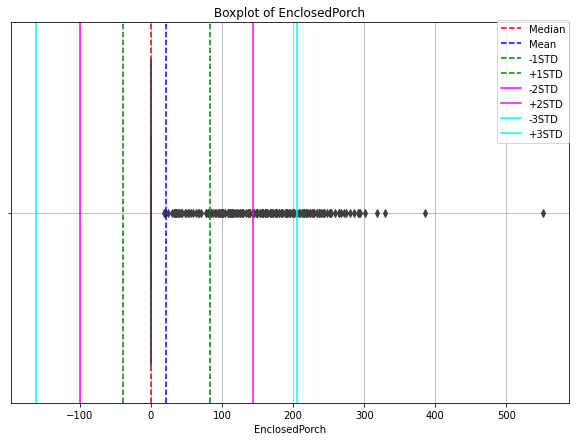

Mean of EnclosedPorch 	 : 21.954
Median of EnclosedPorch 	 : 0.0
Standard Deviation of EnclosedPorch 	 : 61.119
Q1 of EnclosedPorch 	 : 0.0
Q2 of EnclosedPorch 	 : 0
Q3 of EnclosedPorch 	 : 0
Q4 of EnclosedPorch 	 : 0
Q5` of EnclosedPorch 	 : 0.0
Kurt of EnclosedPorch 	 : 10.431
**************************************************


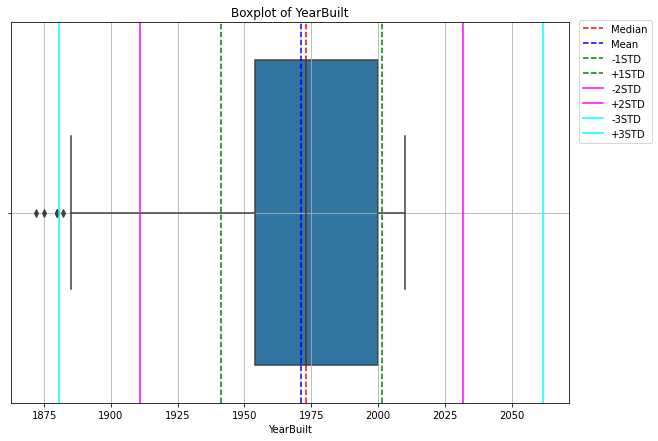

Mean of YearBuilt 	 : 1971.268
Median of YearBuilt 	 : 1973.0
Standard Deviation of YearBuilt 	 : 30.203
Q1 of YearBuilt 	 : 1885.0
Q2 of YearBuilt 	 : 1954
Q3 of YearBuilt 	 : 1973
Q4 of YearBuilt 	 : 2000
Q5` of YearBuilt 	 : 2069.0
Kurt of YearBuilt 	 : -0.44
**************************************************


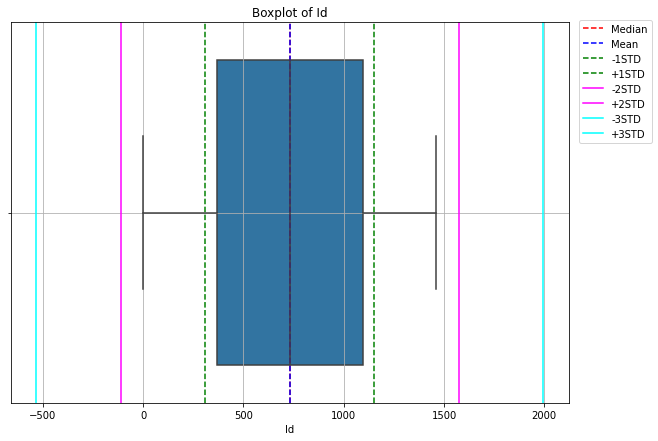

Mean of Id 	 : 730.5
Median of Id 	 : 730.5
Standard Deviation of Id 	 : 421.61
Q1 of Id 	 : -728.5
Q2 of Id 	 : 366
Q3 of Id 	 : 730
Q4 of Id 	 : 1095
Q5` of Id 	 : 2189.5
Kurt of Id 	 : -1.2
**************************************************


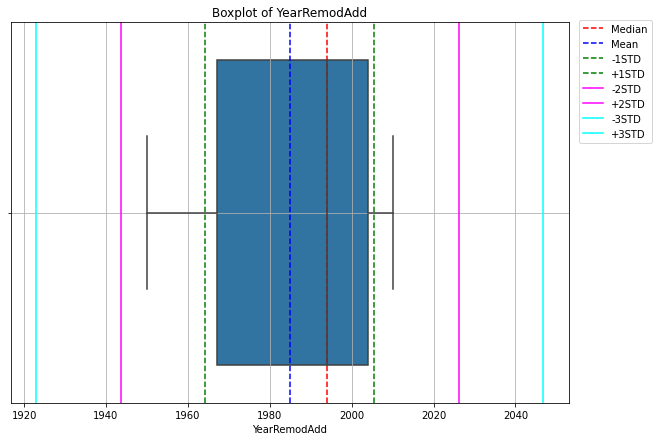

Mean of YearRemodAdd 	 : 1984.866
Median of YearRemodAdd 	 : 1994.0
Standard Deviation of YearRemodAdd 	 : 20.645
Q1 of YearRemodAdd 	 : 1911.5
Q2 of YearRemodAdd 	 : 1967
Q3 of YearRemodAdd 	 : 1994
Q4 of YearRemodAdd 	 : 2004
Q5` of YearRemodAdd 	 : 2059.5
Kurt of YearRemodAdd 	 : -1.272
**************************************************


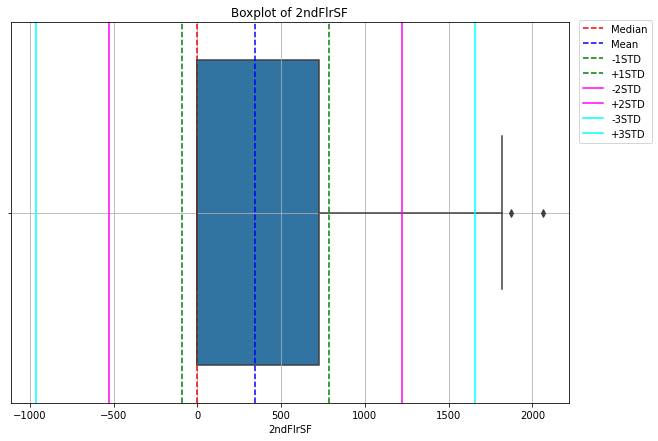

Mean of 2ndFlrSF 	 : 346.992
Median of 2ndFlrSF 	 : 0.0
Standard Deviation of 2ndFlrSF 	 : 436.528
Q1 of 2ndFlrSF 	 : -1092.0
Q2 of 2ndFlrSF 	 : 0
Q3 of 2ndFlrSF 	 : 0
Q4 of 2ndFlrSF 	 : 728
Q5` of 2ndFlrSF 	 : 1820.0
Kurt of 2ndFlrSF 	 : -0.553
**************************************************


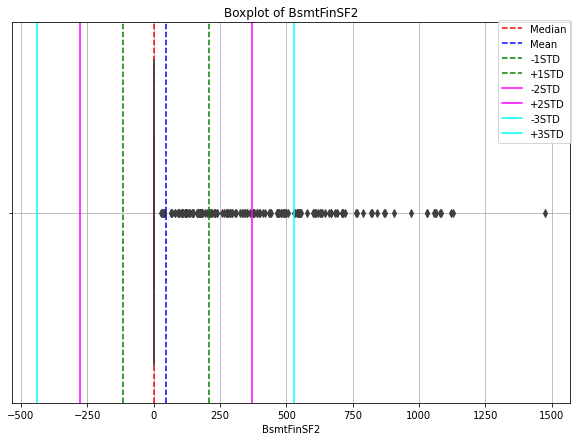

Mean of BsmtFinSF2 	 : 46.549
Median of BsmtFinSF2 	 : 0.0
Standard Deviation of BsmtFinSF2 	 : 161.319
Q1 of BsmtFinSF2 	 : 0.0
Q2 of BsmtFinSF2 	 : 0
Q3 of BsmtFinSF2 	 : 0
Q4 of BsmtFinSF2 	 : 0
Q5` of BsmtFinSF2 	 : 0.0
Kurt of BsmtFinSF2 	 : 20.113
**************************************************


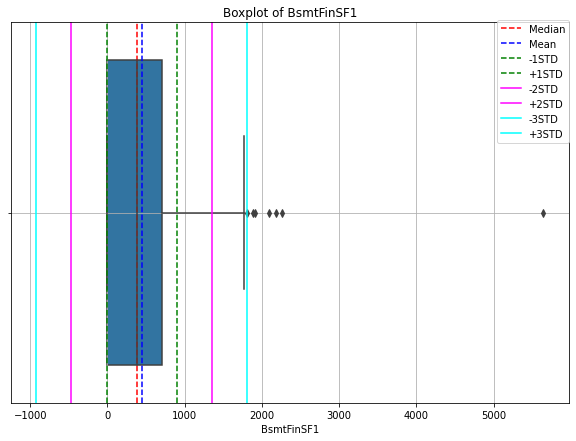

Mean of BsmtFinSF1 	 : 443.64
Median of BsmtFinSF1 	 : 383.5
Standard Deviation of BsmtFinSF1 	 : 456.098
Q1 of BsmtFinSF1 	 : -1068.375
Q2 of BsmtFinSF1 	 : 0
Q3 of BsmtFinSF1 	 : 384
Q4 of BsmtFinSF1 	 : 712
Q5` of BsmtFinSF1 	 : 1780.625
Kurt of BsmtFinSF1 	 : 11.118
**************************************************


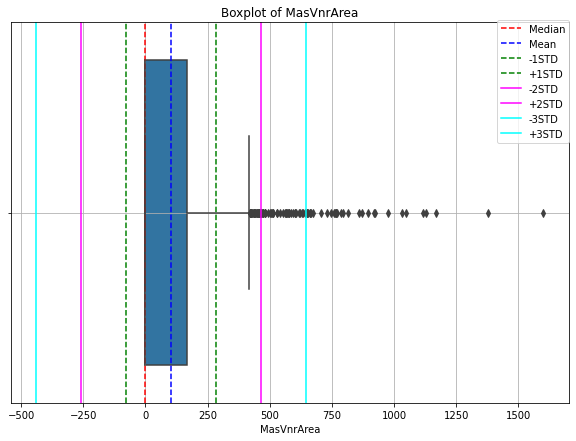

Mean of MasVnrArea 	 : 103.685
Median of MasVnrArea 	 : 0.0
Standard Deviation of MasVnrArea 	 : 181.066
Q1 of MasVnrArea 	 : -249.0
Q2 of MasVnrArea 	 : 0
Q3 of MasVnrArea 	 : 0
Q4 of MasVnrArea 	 : 166
Q5` of MasVnrArea 	 : 415.0
Kurt of MasVnrArea 	 : 10.082
**************************************************


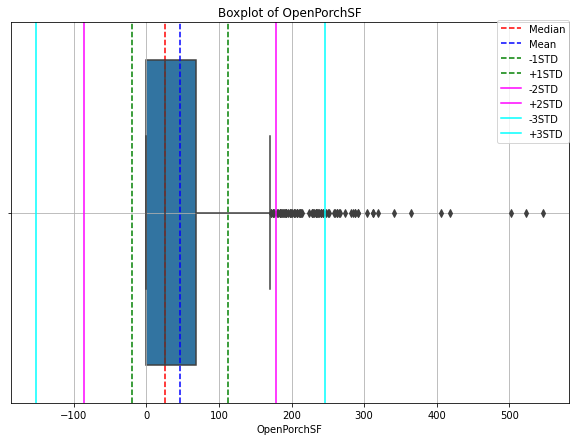

Mean of OpenPorchSF 	 : 46.66
Median of OpenPorchSF 	 : 25.0
Standard Deviation of OpenPorchSF 	 : 66.256
Q1 of OpenPorchSF 	 : -102.0
Q2 of OpenPorchSF 	 : 0
Q3 of OpenPorchSF 	 : 25
Q4 of OpenPorchSF 	 : 68
Q5` of OpenPorchSF 	 : 170.0
Kurt of OpenPorchSF 	 : 8.49
**************************************************


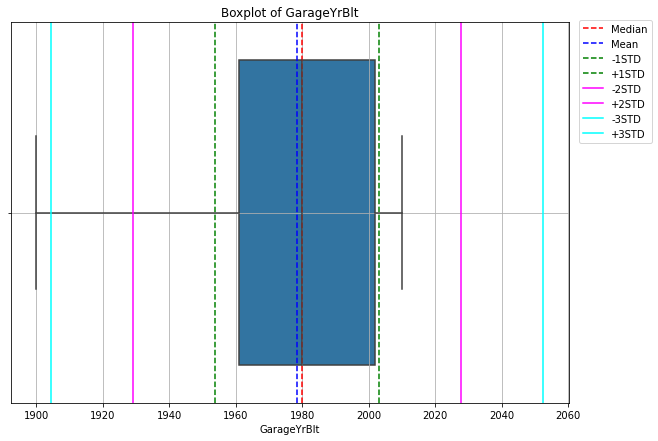

Mean of GarageYrBlt 	 : 1978.506
Median of GarageYrBlt 	 : 1980.0
Standard Deviation of GarageYrBlt 	 : 24.69
Q1 of GarageYrBlt 	 : 1899.5
Q2 of GarageYrBlt 	 : 1961
Q3 of GarageYrBlt 	 : 1980
Q4 of GarageYrBlt 	 : 2002
Q5` of GarageYrBlt 	 : 2063.5
Kurt of GarageYrBlt 	 : -0.418
**************************************************


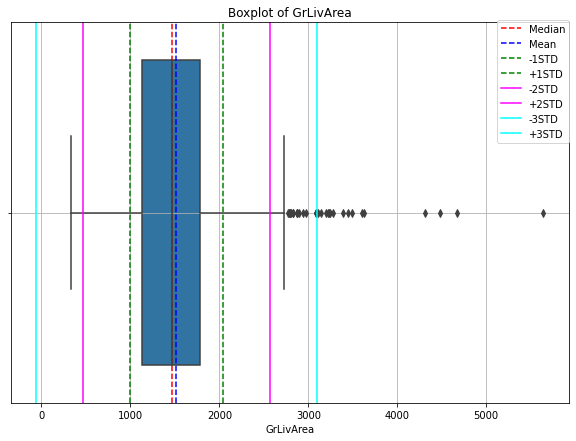

Mean of GrLivArea 	 : 1515.464
Median of GrLivArea 	 : 1464.0
Standard Deviation of GrLivArea 	 : 525.48
Q1 of GrLivArea 	 : 158.625
Q2 of GrLivArea 	 : 1130
Q3 of GrLivArea 	 : 1464
Q4 of GrLivArea 	 : 1777
Q5` of GrLivArea 	 : 2747.625
Kurt of GrLivArea 	 : 4.895
**************************************************


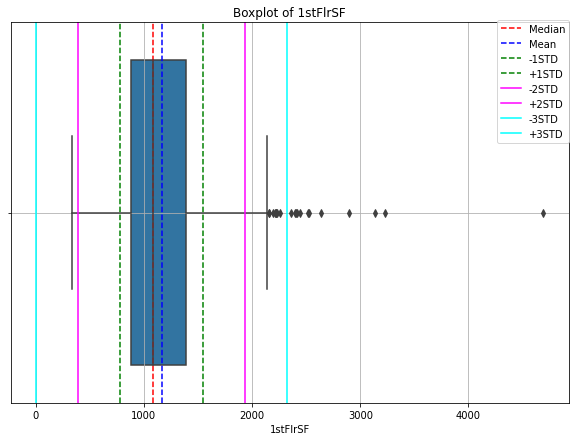

Mean of 1stFlrSF 	 : 1162.627
Median of 1stFlrSF 	 : 1087.0
Standard Deviation of 1stFlrSF 	 : 386.588
Q1 of 1stFlrSF 	 : 118.125
Q2 of 1stFlrSF 	 : 882
Q3 of 1stFlrSF 	 : 1087
Q4 of 1stFlrSF 	 : 1391
Q5` of 1stFlrSF 	 : 2155.125
Kurt of 1stFlrSF 	 : 5.746
**************************************************


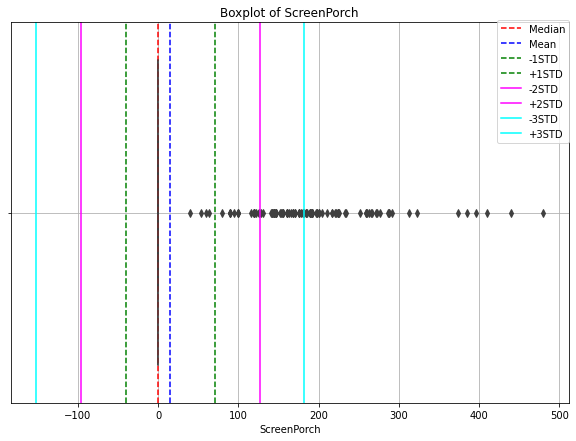

Mean of ScreenPorch 	 : 15.061
Median of ScreenPorch 	 : 0.0
Standard Deviation of ScreenPorch 	 : 55.757
Q1 of ScreenPorch 	 : 0.0
Q2 of ScreenPorch 	 : 0
Q3 of ScreenPorch 	 : 0
Q4 of ScreenPorch 	 : 0
Q5` of ScreenPorch 	 : 0.0
Kurt of ScreenPorch 	 : 18.439
**************************************************


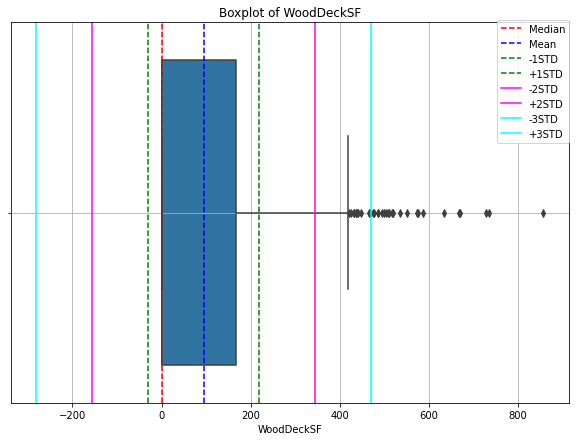

Mean of WoodDeckSF 	 : 94.245
Median of WoodDeckSF 	 : 0.0
Standard Deviation of WoodDeckSF 	 : 125.339
Q1 of WoodDeckSF 	 : -252.0
Q2 of WoodDeckSF 	 : 0
Q3 of WoodDeckSF 	 : 0
Q4 of WoodDeckSF 	 : 168
Q5` of WoodDeckSF 	 : 420.0
Kurt of WoodDeckSF 	 : 2.993
**************************************************


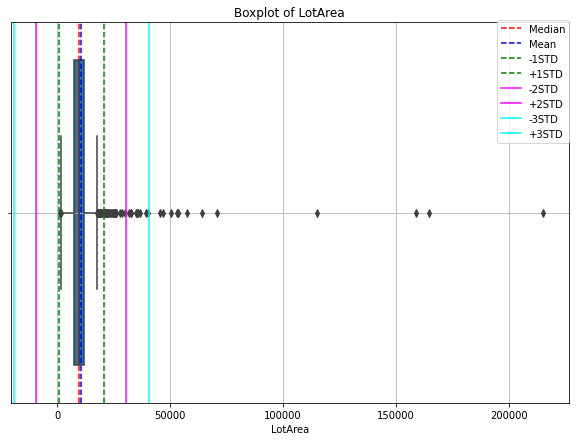

Mean of LotArea 	 : 10516.828
Median of LotArea 	 : 9478.5
Standard Deviation of LotArea 	 : 9981.265
Q1 of LotArea 	 : 1481.5
Q2 of LotArea 	 : 7554
Q3 of LotArea 	 : 9478
Q4 of LotArea 	 : 11602
Q5` of LotArea 	 : 17673.5
Kurt of LotArea 	 : 203.243
**************************************************


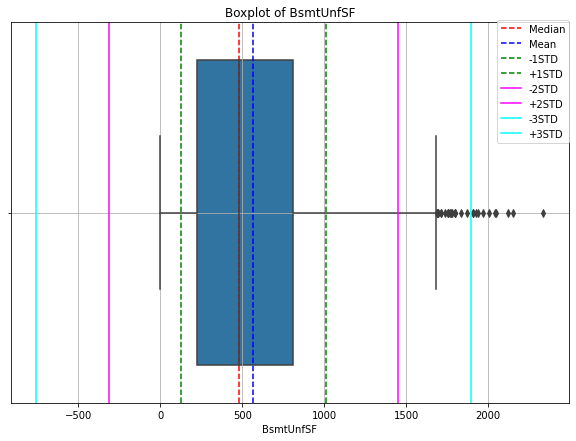

Mean of BsmtUnfSF 	 : 567.24
Median of BsmtUnfSF 	 : 477.5
Standard Deviation of BsmtUnfSF 	 : 441.867
Q1 of BsmtUnfSF 	 : -654.5
Q2 of BsmtUnfSF 	 : 223
Q3 of BsmtUnfSF 	 : 478
Q4 of BsmtUnfSF 	 : 808
Q5` of BsmtUnfSF 	 : 1685.5
Kurt of BsmtUnfSF 	 : 0.475
**************************************************


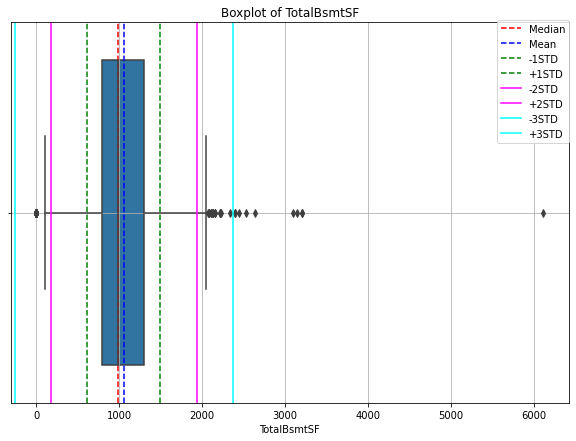

Mean of TotalBsmtSF 	 : 1057.429
Median of TotalBsmtSF 	 : 991.5
Standard Deviation of TotalBsmtSF 	 : 438.705
Q1 of TotalBsmtSF 	 : 42.0
Q2 of TotalBsmtSF 	 : 796
Q3 of TotalBsmtSF 	 : 992
Q4 of TotalBsmtSF 	 : 1298
Q5` of TotalBsmtSF 	 : 2052.0
Kurt of TotalBsmtSF 	 : 13.25
**************************************************


In [ ]:
for i in cont_variable3:
  fig = plt.figure(figsize=(10,7))
  sns.boxplot(data=df_train,x=i).set_title("Boxplot of" +" "+i)
  plt.axvline(df_train[i].median(),color = "r",ls="--",label="Median")
  plt.axvline(df_train[i].mean(), color = "b",ls="--", label="Mean")
  plt.axvline(df_train[i].mean()-df_train[i].std(), color = "g", ls="--", label = "-1STD")
  plt.axvline(df_train[i].mean()+df_train[i].std(), color = "g", ls= "--", label = "+1STD")
  plt.axvline(df_train[i].mean()-(2*df_train[i].std()), color = "magenta", label ="-2STD")
  plt.axvline(df_train[i].mean()+(2*df_train[i].std()), color = "magenta", label = "+2STD")
  plt.axvline(df_train[i].mean()-(3*df_train[i].std()), color = "cyan", label ="-3STD")
  plt.axvline(df_train[i].mean()+(3*df_train[i].std()), color = "cyan", label = "+3STD")
  plt.legend(bbox_to_anchor=(1.01,1.02))
  plt.grid()
  plt.grid(True)
  plt.show()

  print("Mean" + " of " + str(i), "\t", ":", round(df_train[i].mean(),3))
  print("Median" + " of " + str(i), "\t", ":", round(df_train[i].median(),3))
  print("Standard Deviation" + " of " + str(i), "\t", ":", round(df_train[i].std(),3))
  print("Q1" + " of " + str(i), "\t", ":", df_train[i].quantile(0.25)-1.5*(df_train[i].quantile(0.75)-df_train[i].quantile(0.25)))
  print("Q2" + " of " + str(i), "\t", ":", round(df_train[i].quantile(0.25)))
  print("Q3" + " of " + str(i), "\t", ":", round(df_train[i].quantile(0.50)))
  print("Q4" + " of " + str(i), "\t", ":", round(df_train[i].quantile(0.75)))
  print("Q5`" + " of " + str(i), "\t", ":",  df_train[i].quantile(0.75)+1.5*(df_train[i].quantile(0.75)-df_train[i].quantile(0.25)))

  print("Kurt" + " of " + str(i), "\t", ":", round(df_train[i].kurt(),3))
  print("**"*25)


#OR
# """for i in cont_variable3:
#   sns.boxplot(data=df_train,x=i)
#   plt.show()
#   print("**"*25)
#   print("Mean:",round(df_train[i].mean()))
#   print("Median:",round(df_train[i].median()))
#   print("Q1:", round(df_train[i].quantile(0.25)))
#   print("Q3:", round(df_train[i].quantile(0.75)))
#   print("IQR:",round((df_train[i].quantile(0.75)-(df_train[i].quantile(0.25)))))
#   print("**"*25)"""

#OR
# # '''cols = 4
# # rows = 10
# # num_cols = df_train.select_dtypes(exclude='object').columns
# # fig = plt.figure(figsize= (15,15))
# # for i, col in enumerate(num_cols):
    
# #     ax=fig.add_subplot( rows, cols, i+1)
    
# #     sns.boxplot(x=df_train[col], ax=ax)
    
# # fig.tight_layout()  
# # plt.show()'''

#3.1.2 Categorical features

In [ ]:
df_train.describe(include='object') #Here displaying the summery of statistics for all numeric & categorical features

,RoofStyle,Exterior2nd,Functional,SaleCondition,Heating,HeatingQC,HouseStyle,GarageFinish,Electrical,Neighborhood,...,Condition2,Exterior1st,PavedDrive,Utilities,RoofMatl,MSZoning,KitchenQual,BldgType,GarageQual,MasVnrType
count,1460,1460,1460,1460,1460,1460,1460,1379,1459,1460,...,1460,1460,1460,1460,1460,1460,1460,1460,1379,1452
unique,6,16,7,6,6,5,8,3,5,25,...,8,15,3,2,8,5,4,5,5,4
top,Gable,VinylSd,Typ,Normal,GasA,Ex,1Story,Unf,SBrkr,NAmes,...,Norm,VinylSd,Y,AllPub,CompShg,RL,TA,1Fam,TA,None
freq,1141,504,1360,1198,1428,741,726,605,1334,225,...,1445,515,1340,1459,1434,1151,735,1220,1311,864


## 3.1.2.a. COUNT PLOT

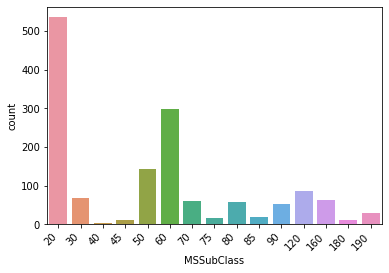

**************************************************
Mode value: 20
**************************************************


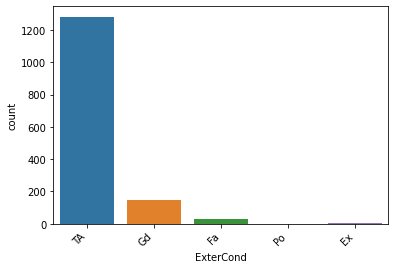

**************************************************
Mode value: TA
**************************************************


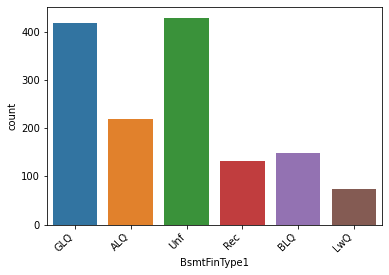

**************************************************
Mode value: Unf
**************************************************


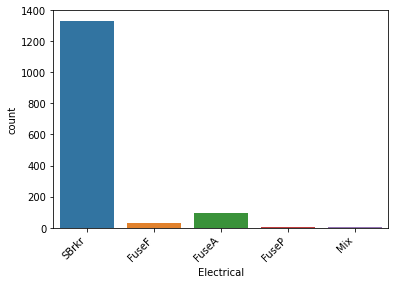

**************************************************
Mode value: SBrkr
**************************************************


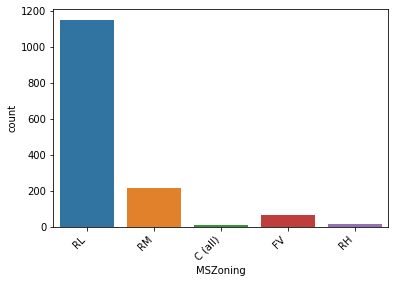

**************************************************
Mode value: RL
**************************************************


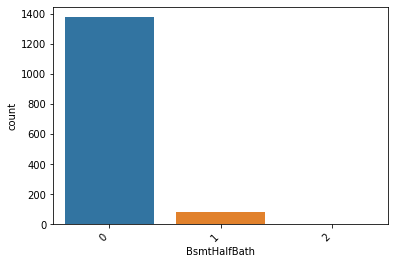

**************************************************
Mode value: 0
**************************************************


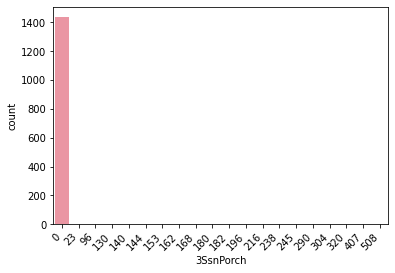

**************************************************
Mode value: 0
**************************************************


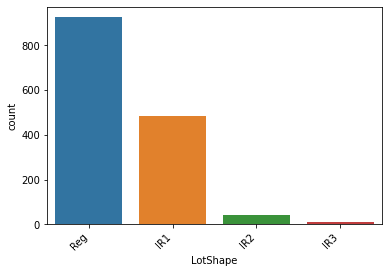

**************************************************
Mode value: Reg
**************************************************


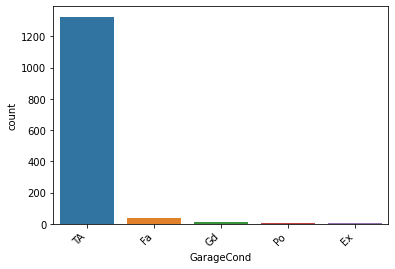

**************************************************
Mode value: TA
**************************************************


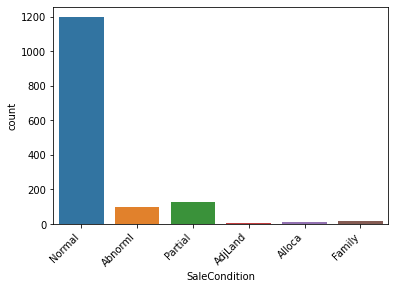

**************************************************
Mode value: Normal
**************************************************


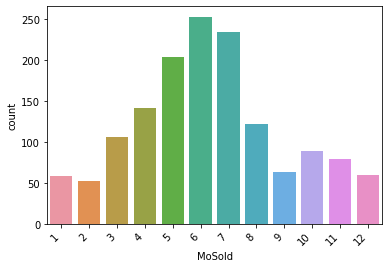

**************************************************
Mode value: 6
**************************************************


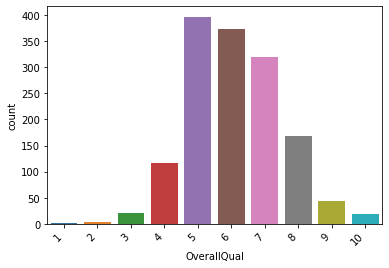

**************************************************
Mode value: 5
**************************************************


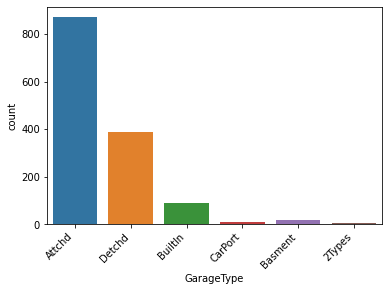

**************************************************
Mode value: Attchd
**************************************************


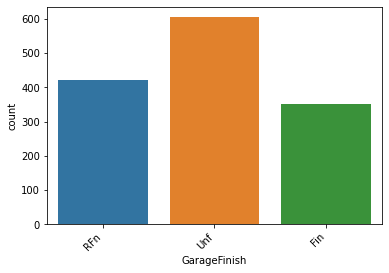

**************************************************
Mode value: Unf
**************************************************


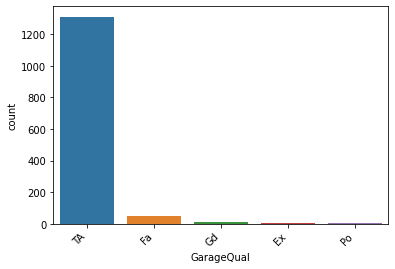

**************************************************
Mode value: TA
**************************************************


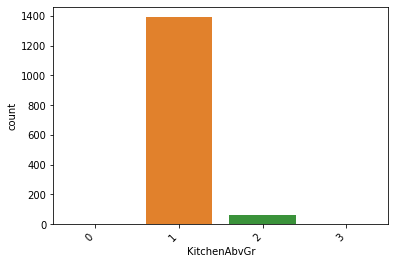

**************************************************
Mode value: 1
**************************************************


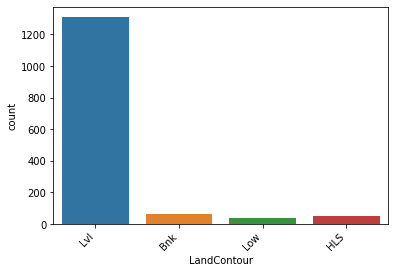

**************************************************
Mode value: Lvl
**************************************************


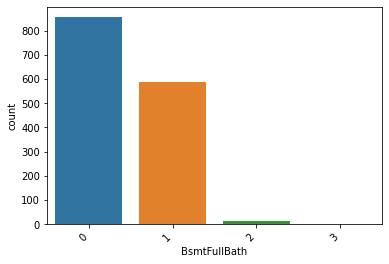

**************************************************
Mode value: 0
**************************************************


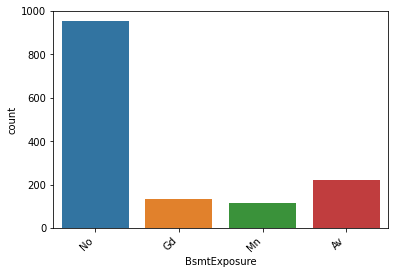

**************************************************
Mode value: No
**************************************************


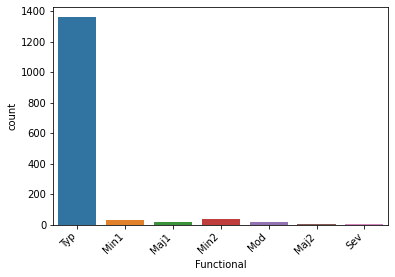

**************************************************
Mode value: Typ
**************************************************


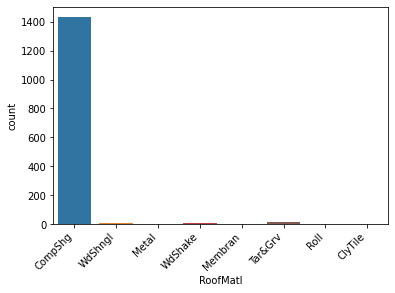

**************************************************
Mode value: CompShg
**************************************************


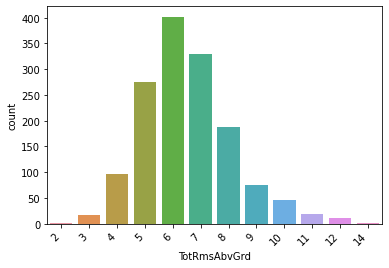

**************************************************
Mode value: 6
**************************************************


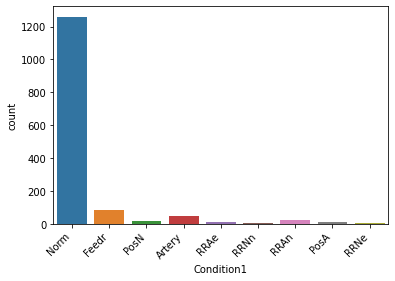

**************************************************
Mode value: Norm
**************************************************


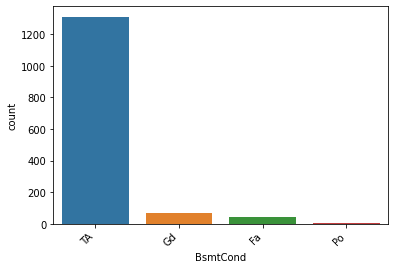

**************************************************
Mode value: TA
**************************************************


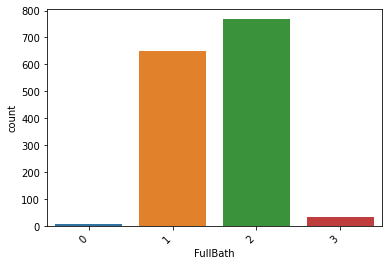

**************************************************
Mode value: 2
**************************************************


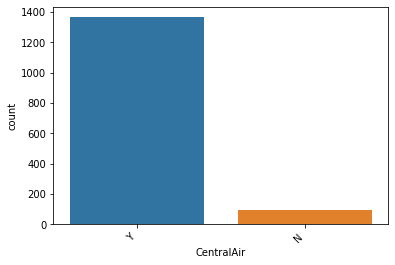

**************************************************
Mode value: Y
**************************************************


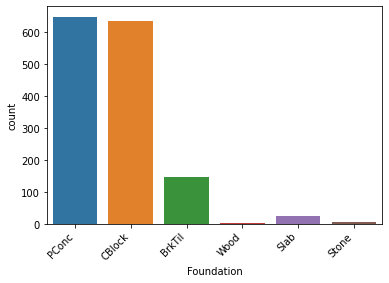

**************************************************
Mode value: PConc
**************************************************


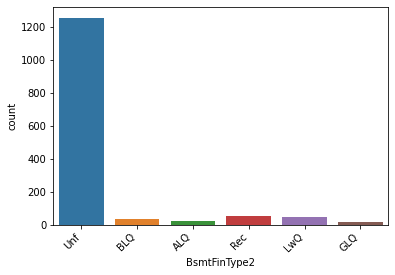

**************************************************
Mode value: Unf
**************************************************


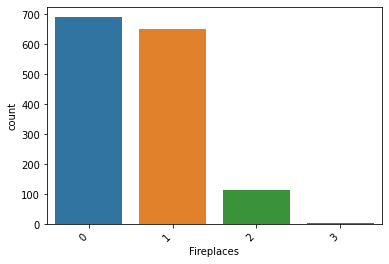

**************************************************
Mode value: 0
**************************************************


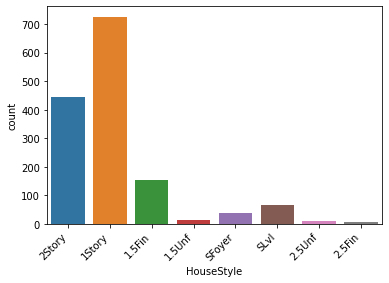

**************************************************
Mode value: 1Story
**************************************************


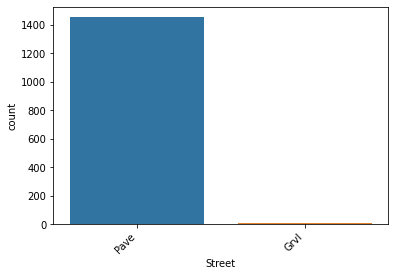

**************************************************
Mode value: Pave
**************************************************


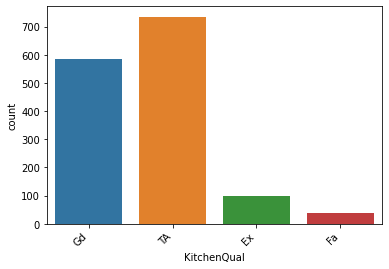

**************************************************
Mode value: TA
**************************************************


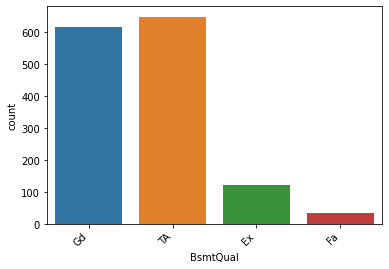

**************************************************
Mode value: TA
**************************************************


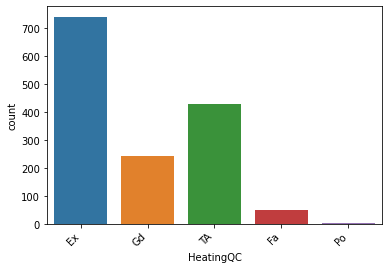

**************************************************
Mode value: Ex
**************************************************


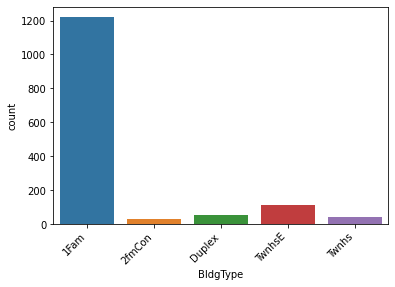

**************************************************
Mode value: 1Fam
**************************************************


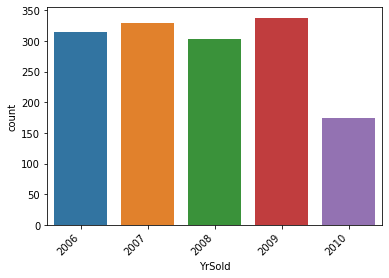

**************************************************
Mode value: 2009
**************************************************


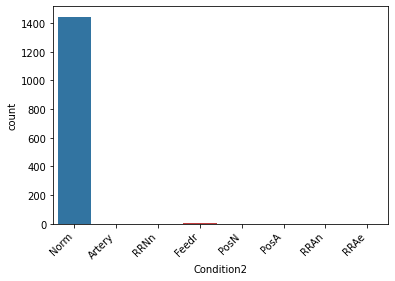

**************************************************
Mode value: Norm
**************************************************


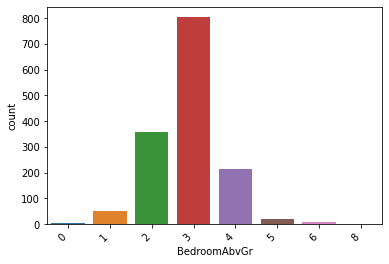

**************************************************
Mode value: 3
**************************************************


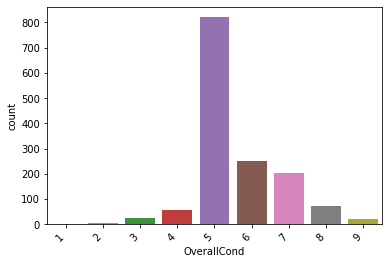

**************************************************
Mode value: 5
**************************************************


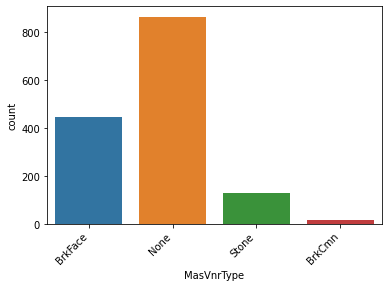

**************************************************
Mode value: None
**************************************************


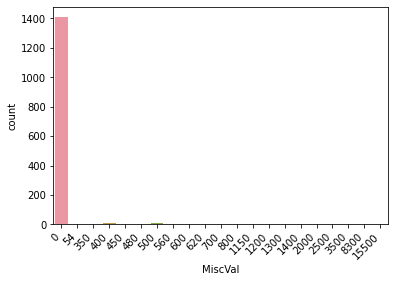

**************************************************
Mode value: 0
**************************************************


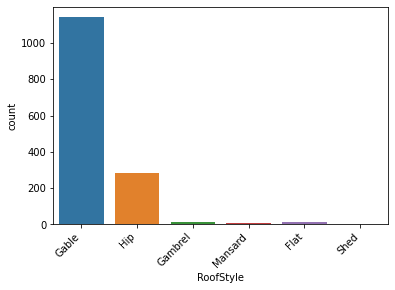

**************************************************
Mode value: Gable
**************************************************


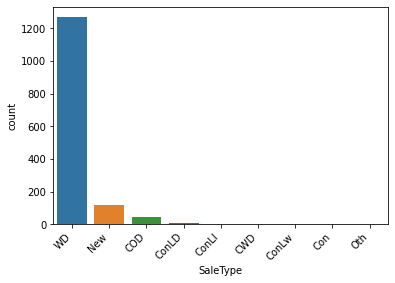

**************************************************
Mode value: WD
**************************************************


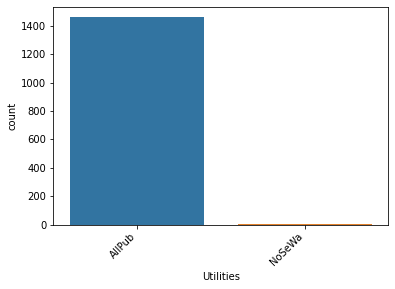

**************************************************
Mode value: AllPub
**************************************************


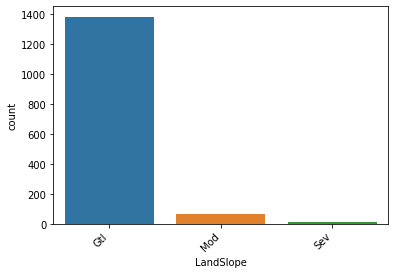

**************************************************
Mode value: Gtl
**************************************************


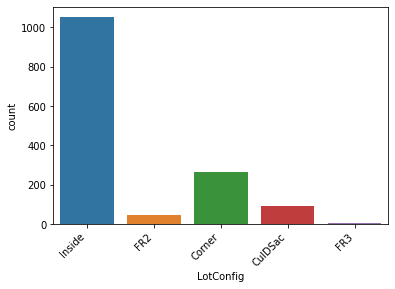

**************************************************
Mode value: Inside
**************************************************


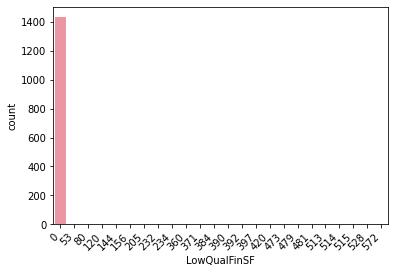

**************************************************
Mode value: 0
**************************************************


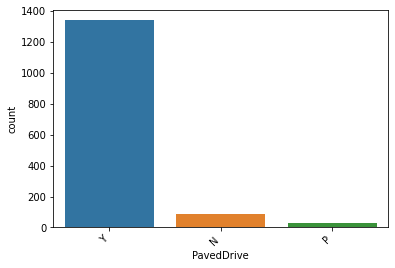

**************************************************
Mode value: Y
**************************************************


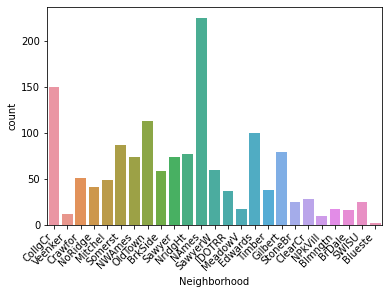

**************************************************
Mode value: NAmes
**************************************************


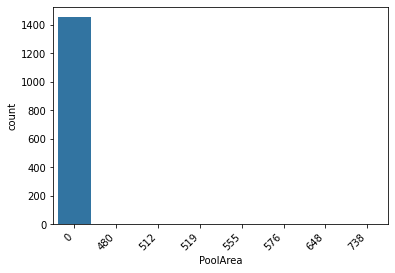

**************************************************
Mode value: 0
**************************************************


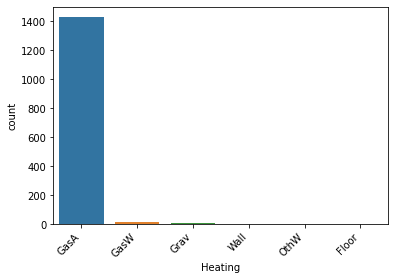

**************************************************
Mode value: GasA
**************************************************


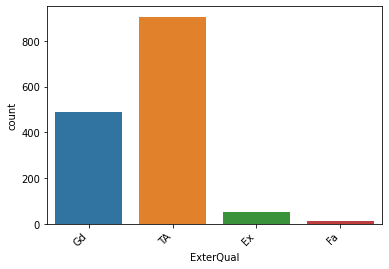

**************************************************
Mode value: TA
**************************************************


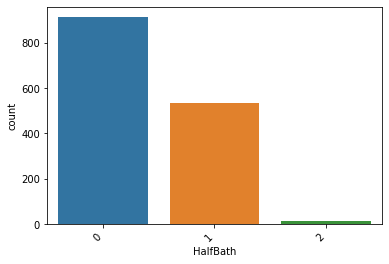

**************************************************
Mode value: 0
**************************************************


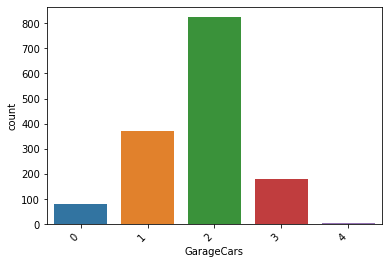

**************************************************
Mode value: 2
**************************************************


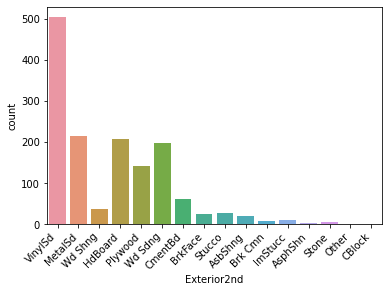

**************************************************
Mode value: VinylSd
**************************************************


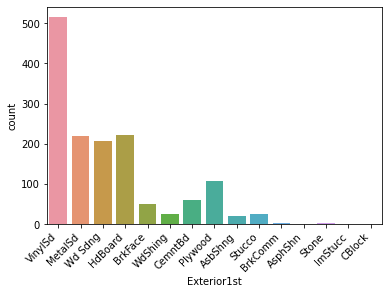

**************************************************
Mode value: VinylSd
**************************************************


"cols = 3\nrows = 15\nfig = plt.figure(figsize= (18,25))\nall_cats = df_train.select_dtypes(exclude='int64')\ncat_cols = all_cats.columns[all_cats.nunique() < 30]\nfor i, col in enumerate(cat_cols):\n    \n    ax=fig.add_subplot(rows, cols, i+1)\n    \n    sns.countplot(x=df_train[col], ax=ax)\n    \n    plt.xticks(rotation=45, ha='right')\n    \nfig.tight_layout()  \nplt.show()"

In [ ]:
for i in dis_variable3:
  sns.countplot(data=df_train, x=i)
  plt.xticks(rotation=45, ha="right")
  plt.show()
  print("**"*25)
  print("Mode value:", df_train[i].mode()[0])
  print("**"*25)

"""cols = 3
rows = 15
fig = plt.figure(figsize= (18,25))
all_cats = df_train.select_dtypes(exclude='int64')
cat_cols = all_cats.columns[all_cats.nunique() < 30]
for i, col in enumerate(cat_cols):
    
    ax=fig.add_subplot(rows, cols, i+1)
    
    sns.countplot(x=df_train[col], ax=ax)
    
    plt.xticks(rotation=45, ha='right')
    
fig.tight_layout()  
plt.show()"""

# 3.2 Bivariate Analysis

#3.2.a. Boxplot

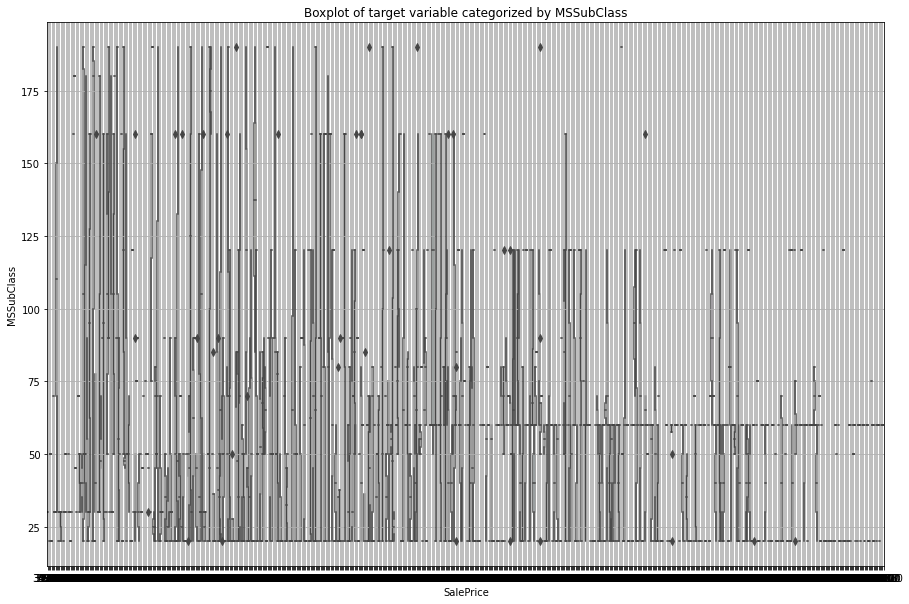

**************************************************


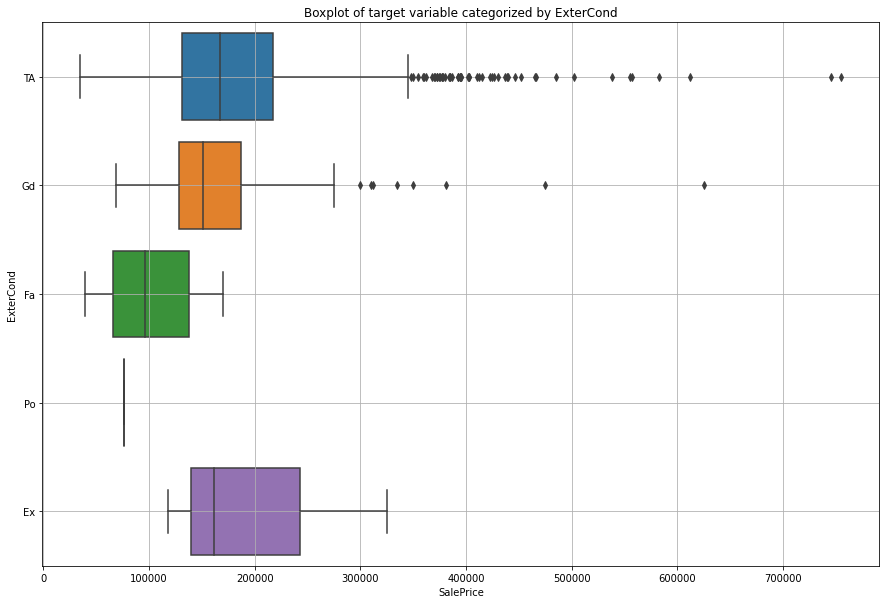

**************************************************


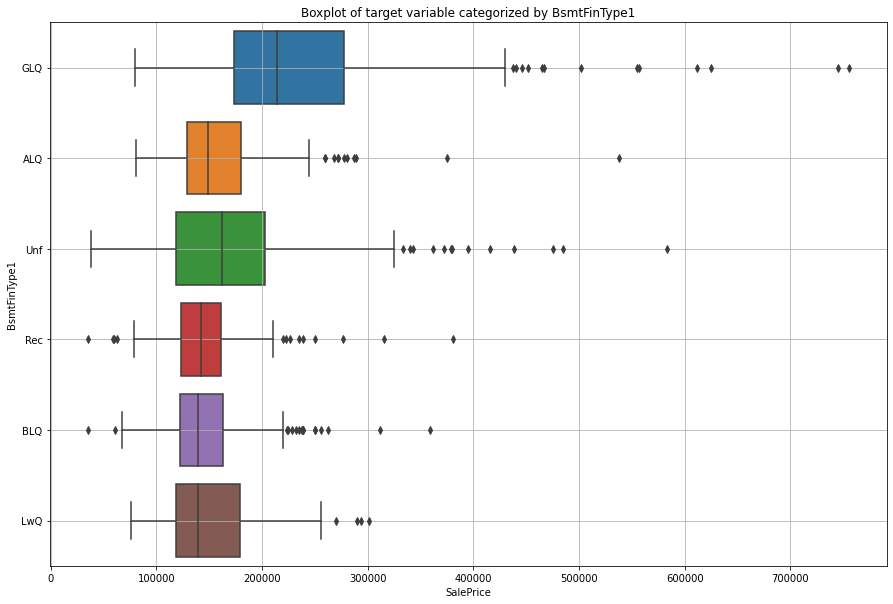

**************************************************


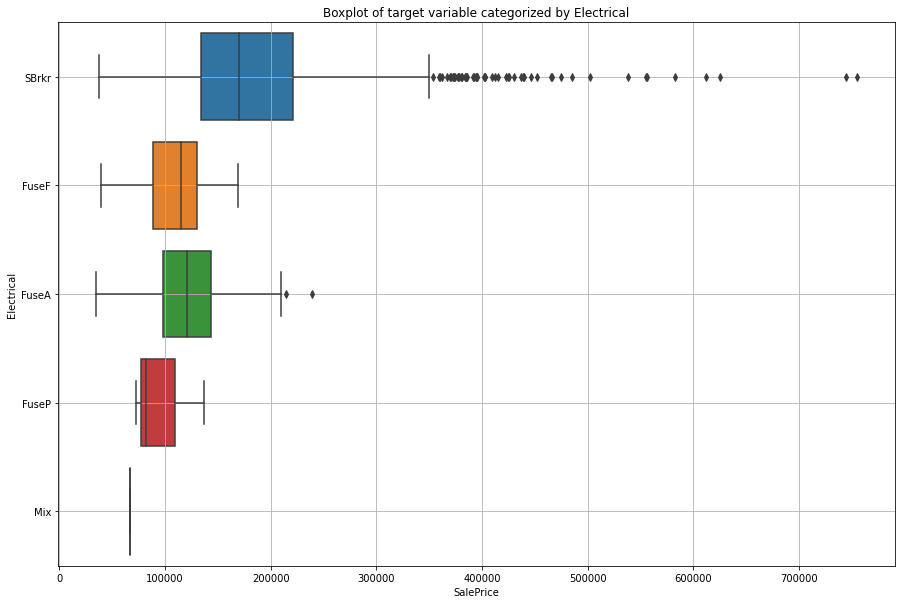

**************************************************


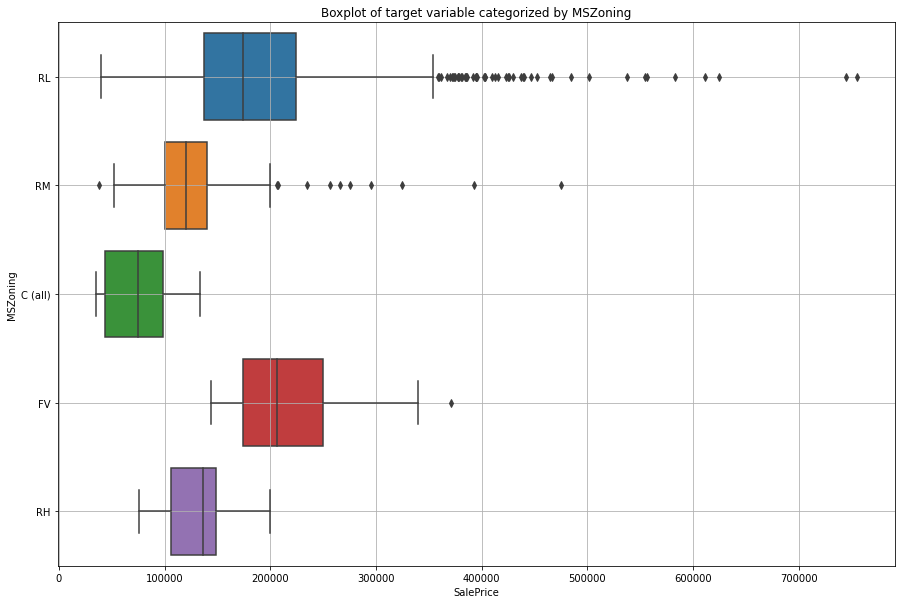

**************************************************


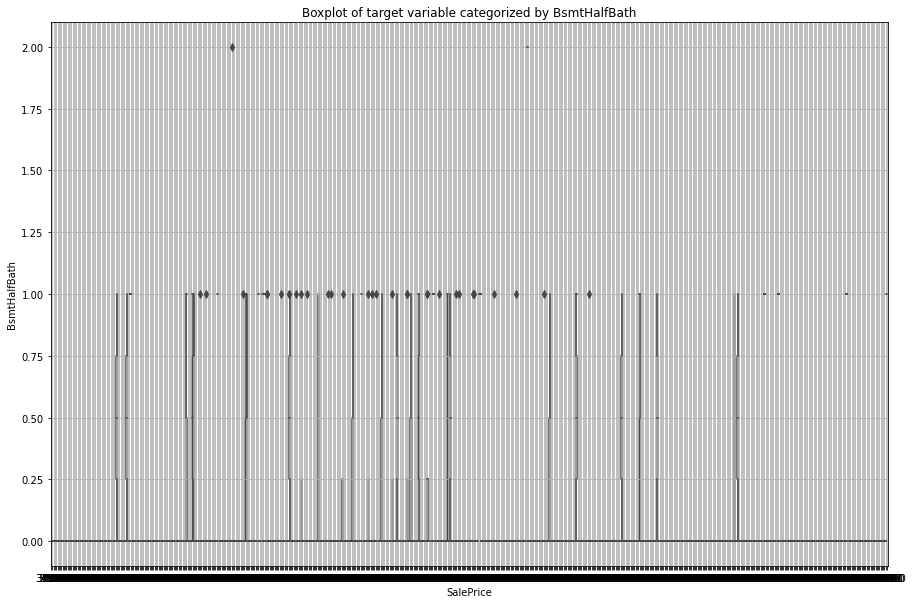

**************************************************


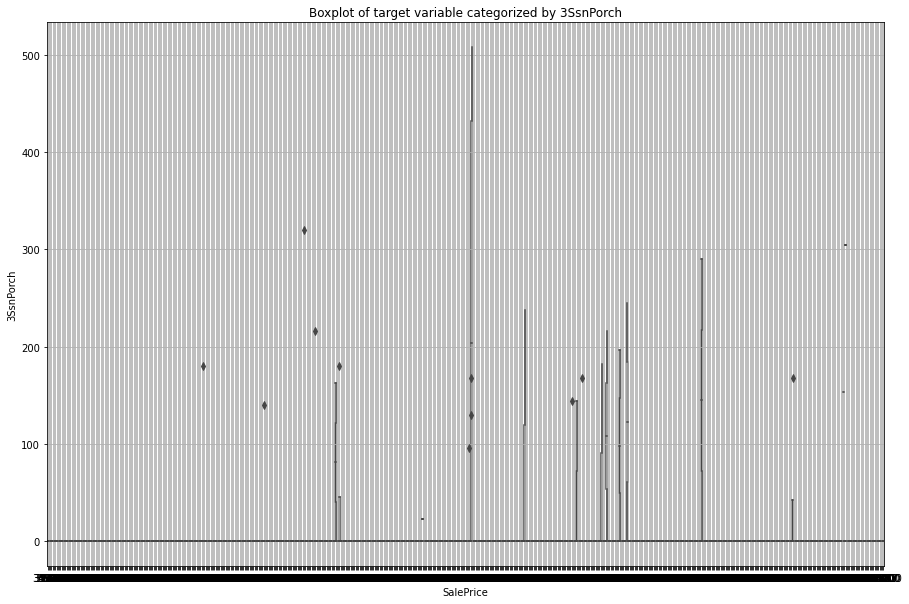

**************************************************


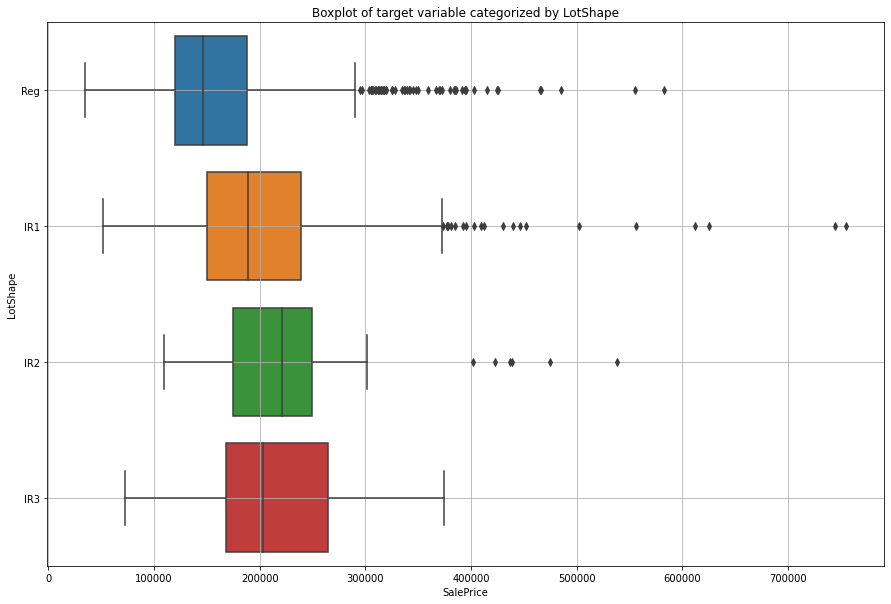

**************************************************


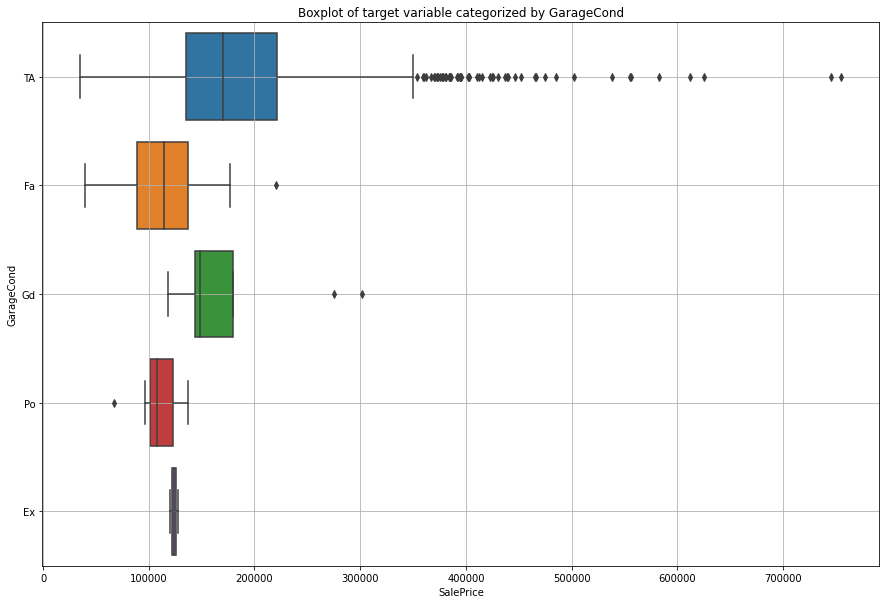

**************************************************


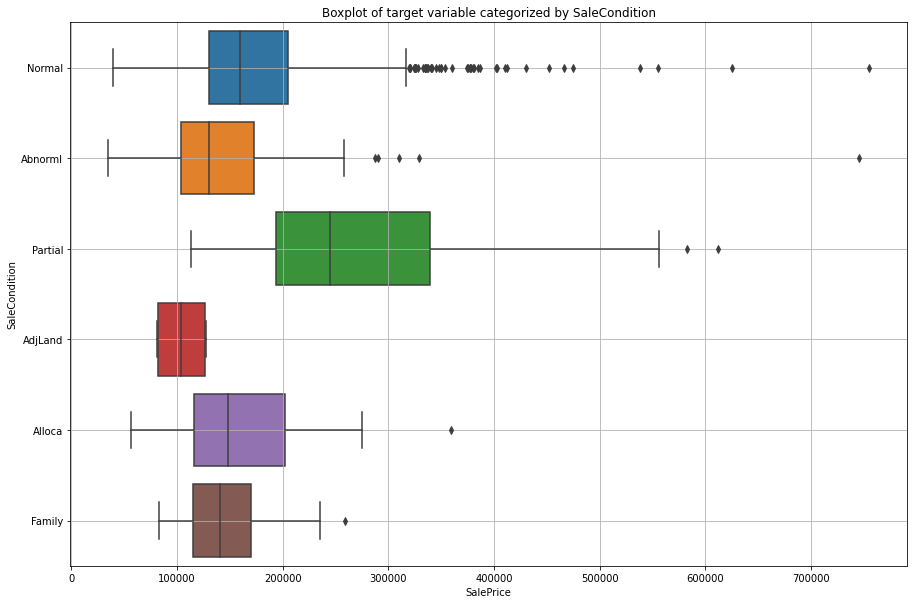

**************************************************


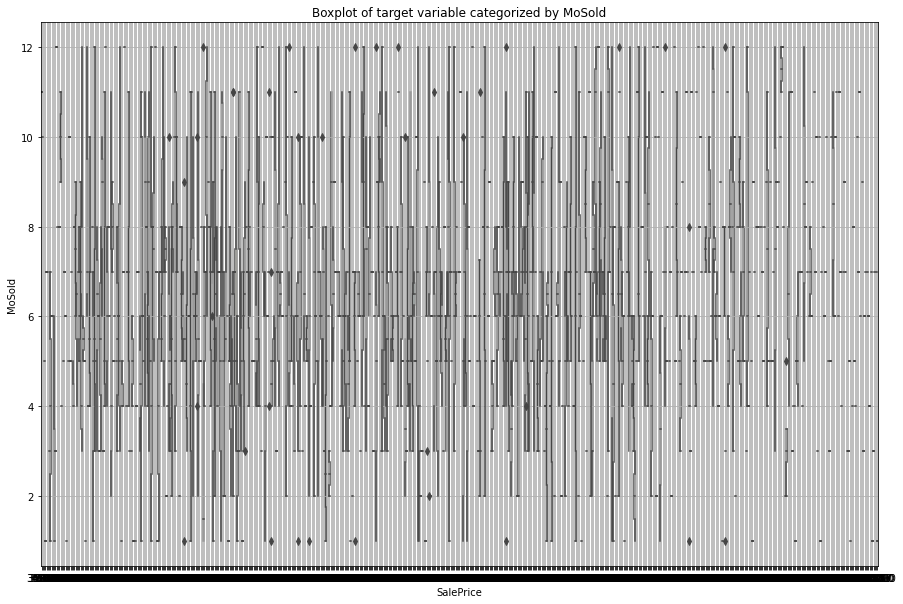

**************************************************


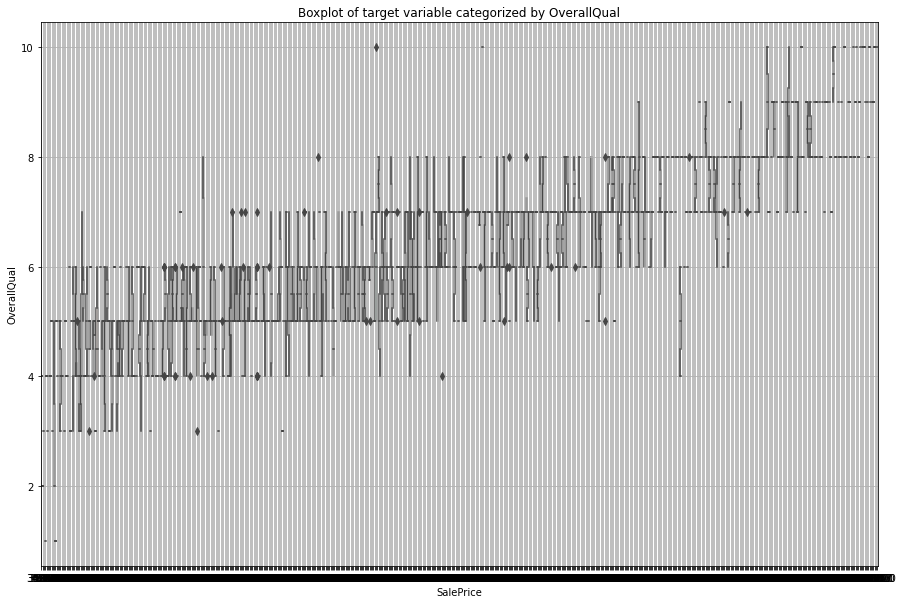

**************************************************


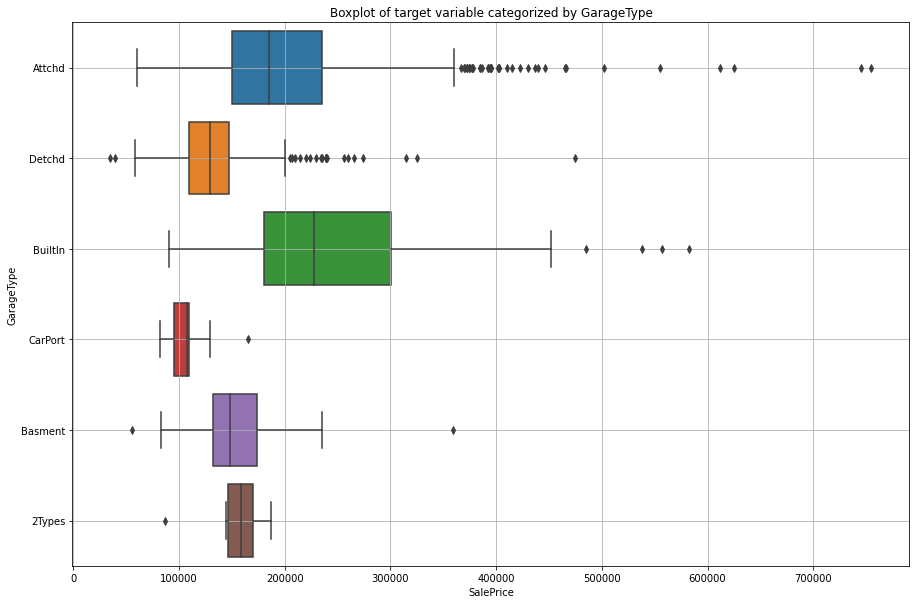

**************************************************


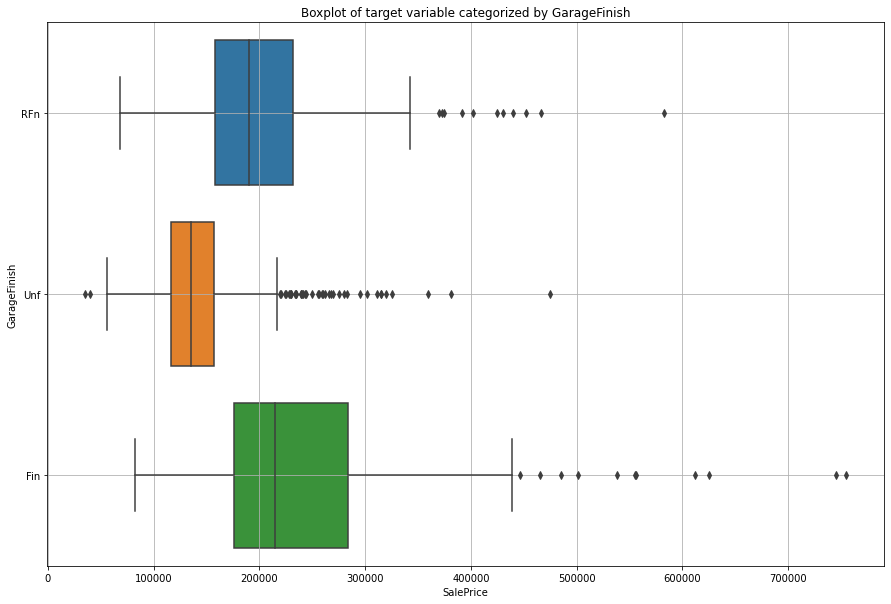

**************************************************


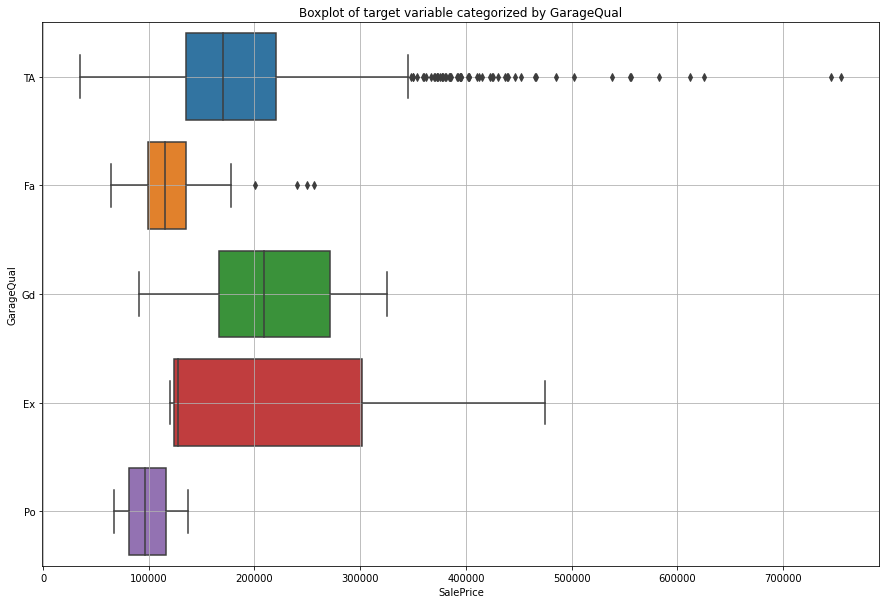

**************************************************


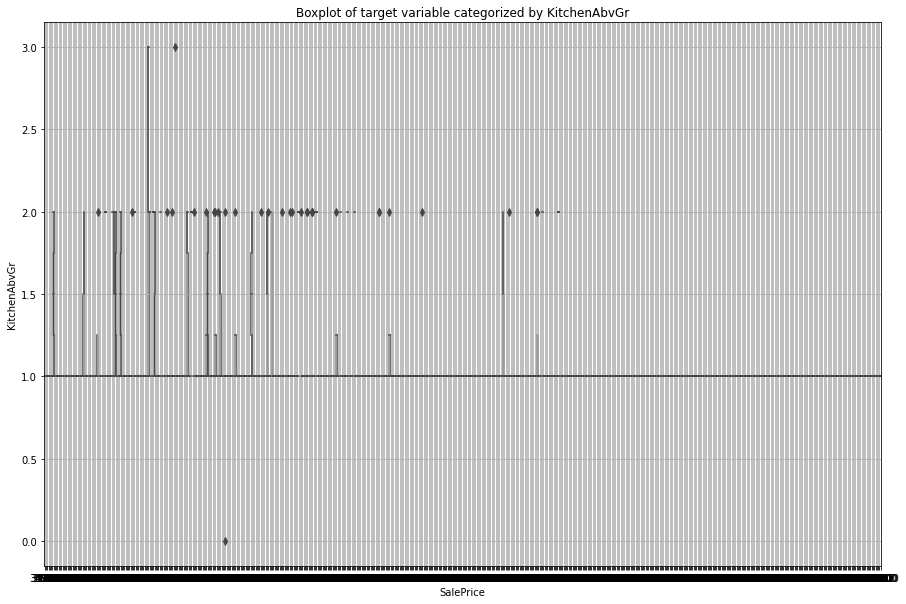

**************************************************


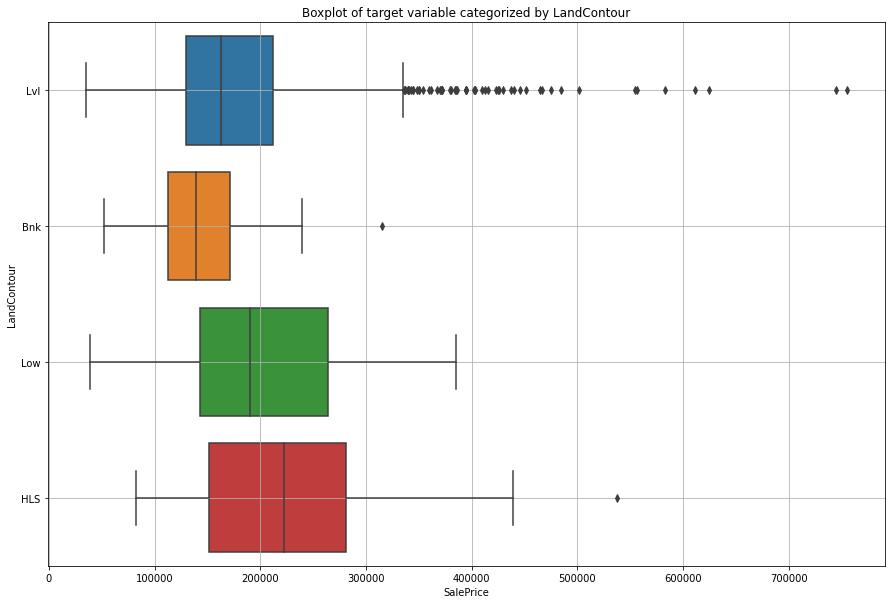

**************************************************


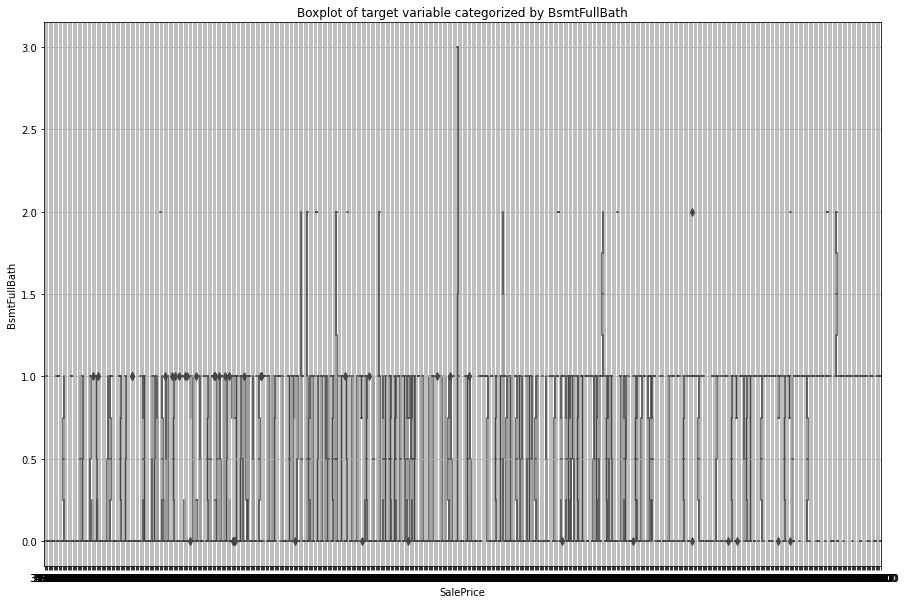

**************************************************


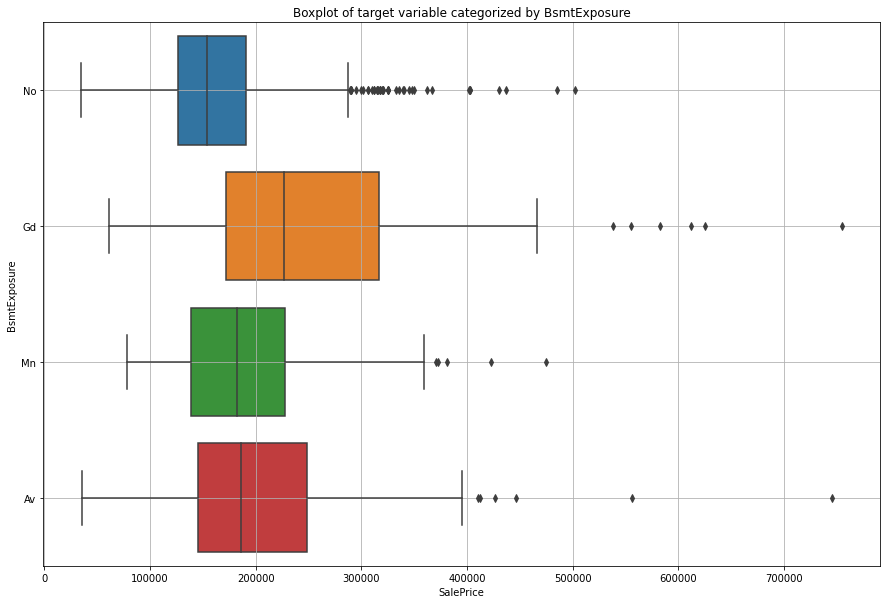

**************************************************


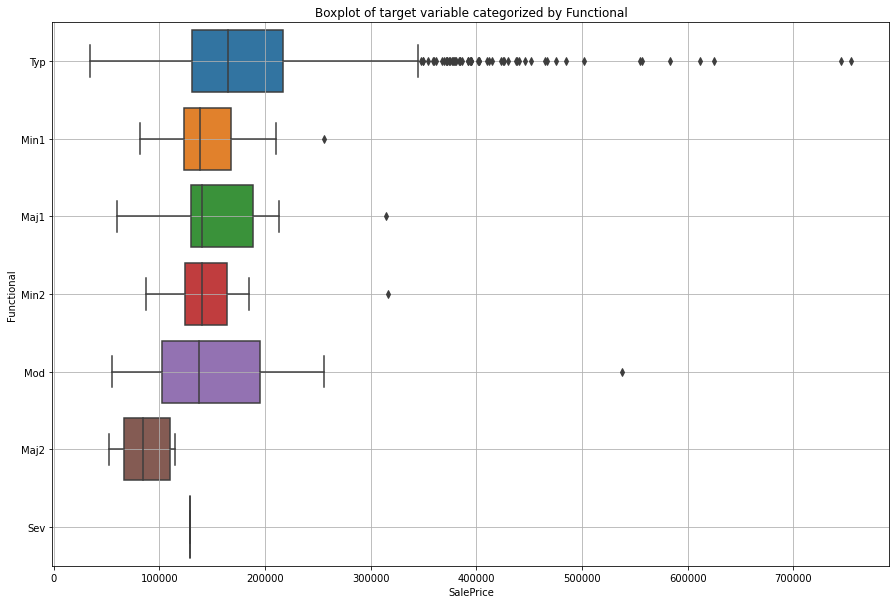

**************************************************


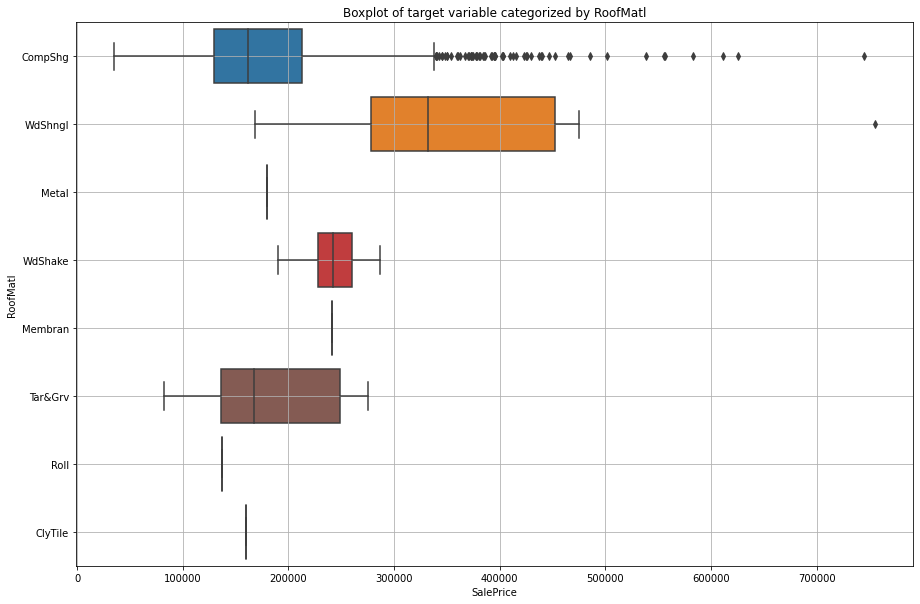

**************************************************


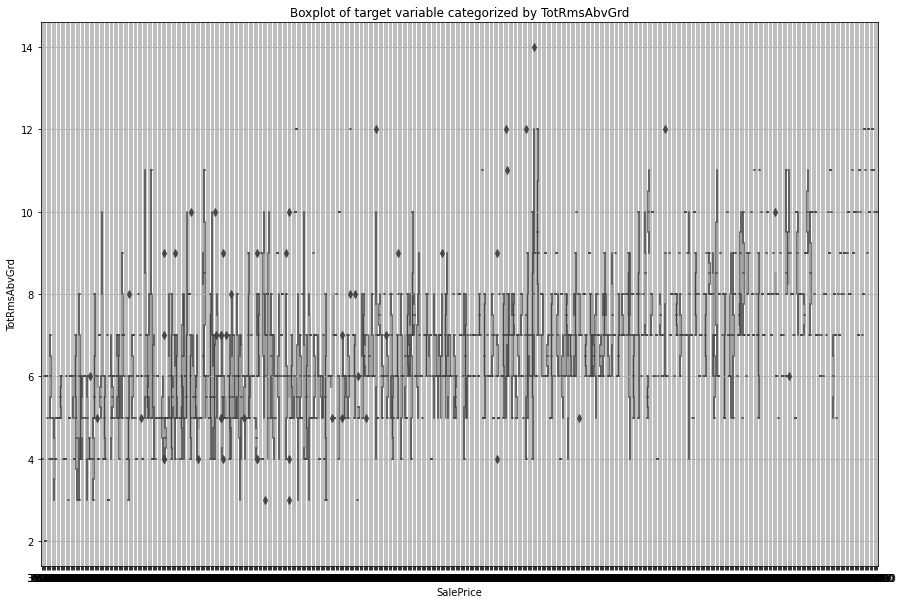

**************************************************


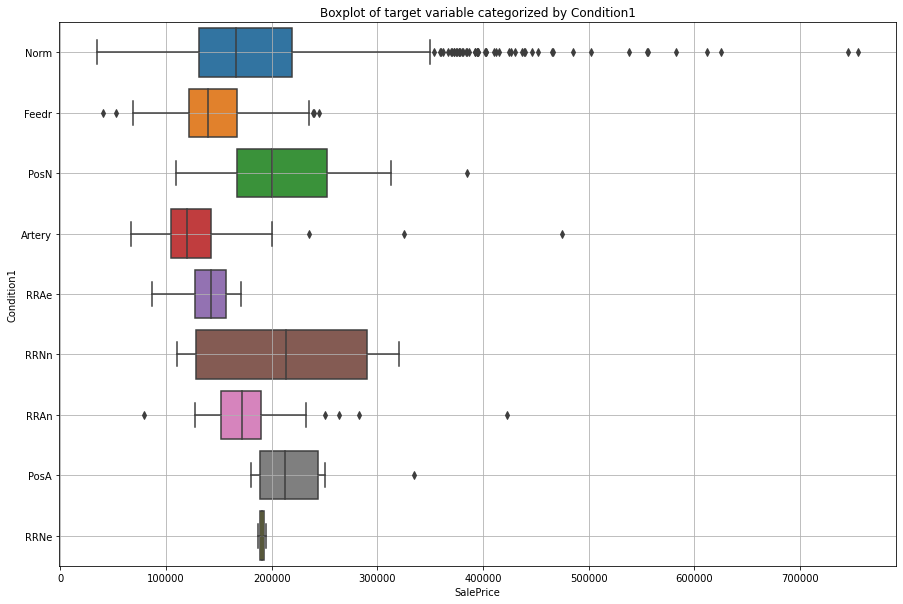

**************************************************


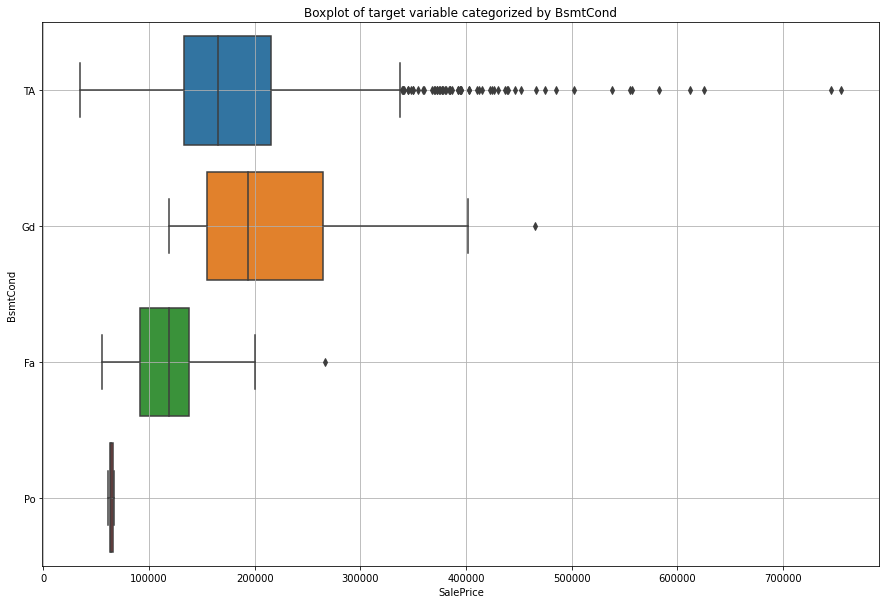

**************************************************


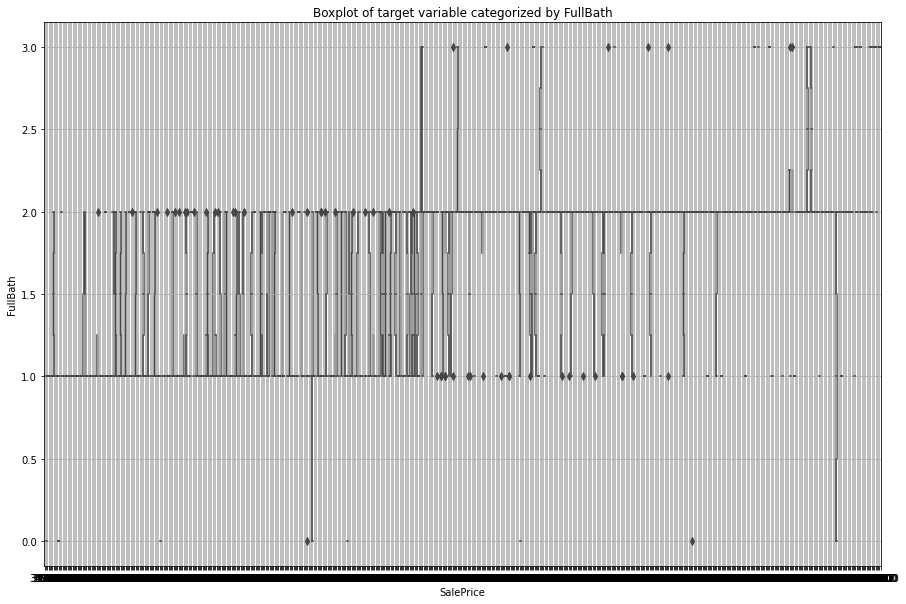

**************************************************


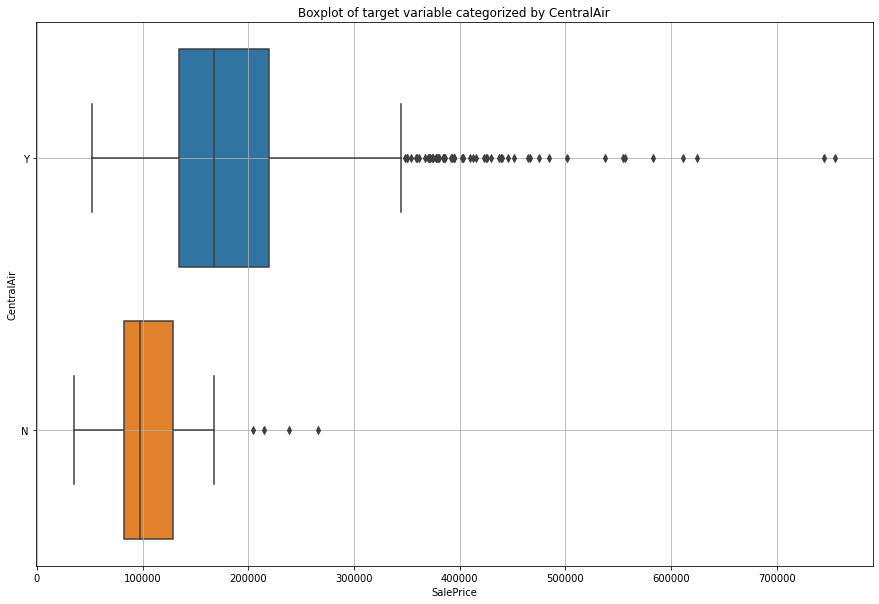

**************************************************


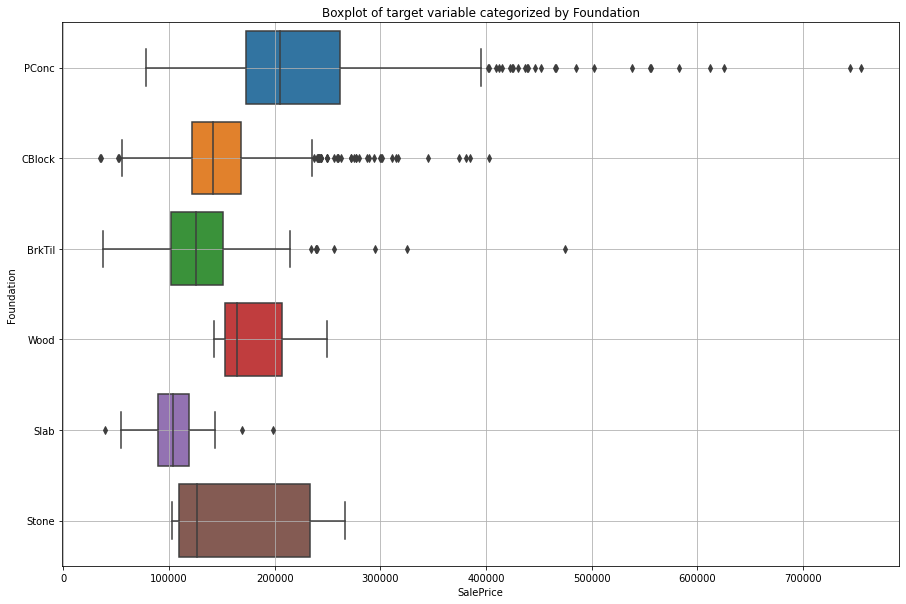

**************************************************


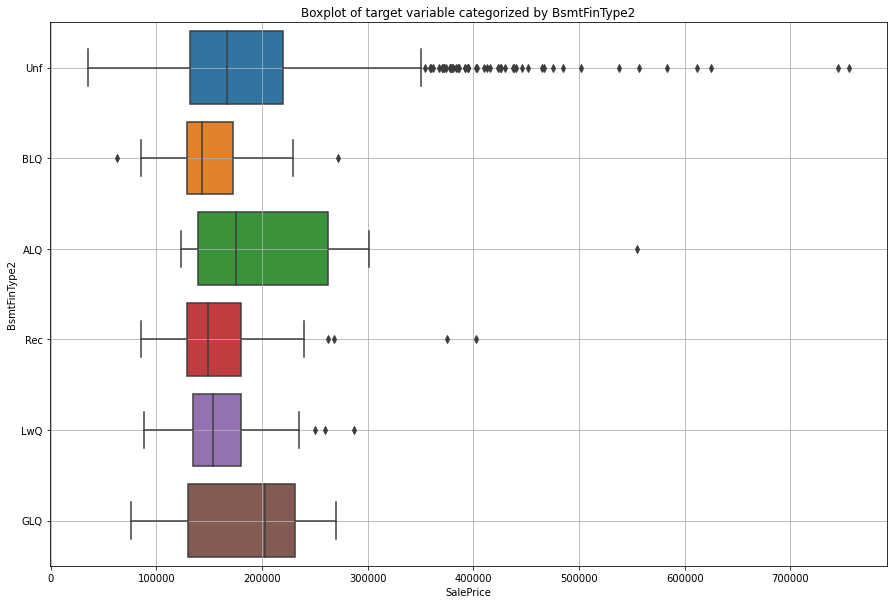

**************************************************


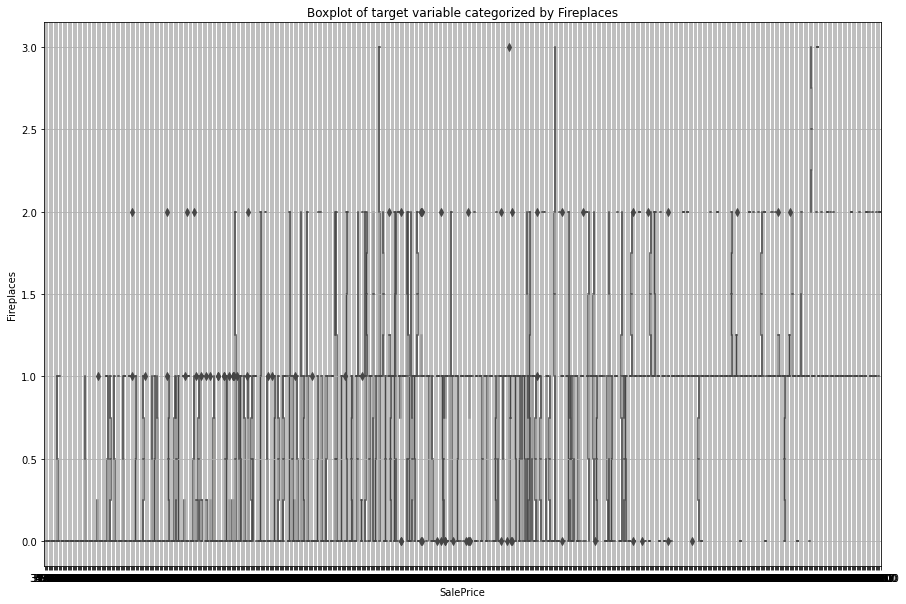

**************************************************


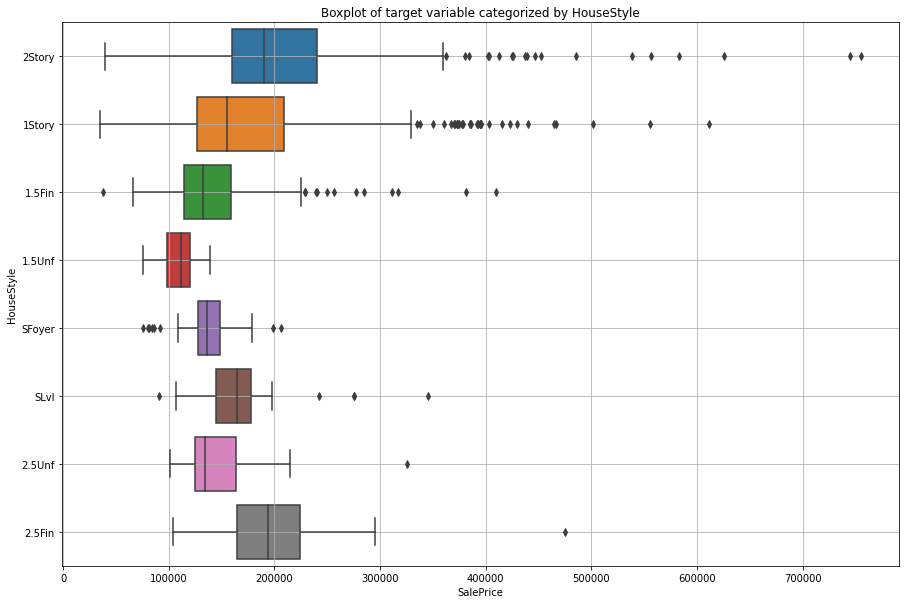

**************************************************


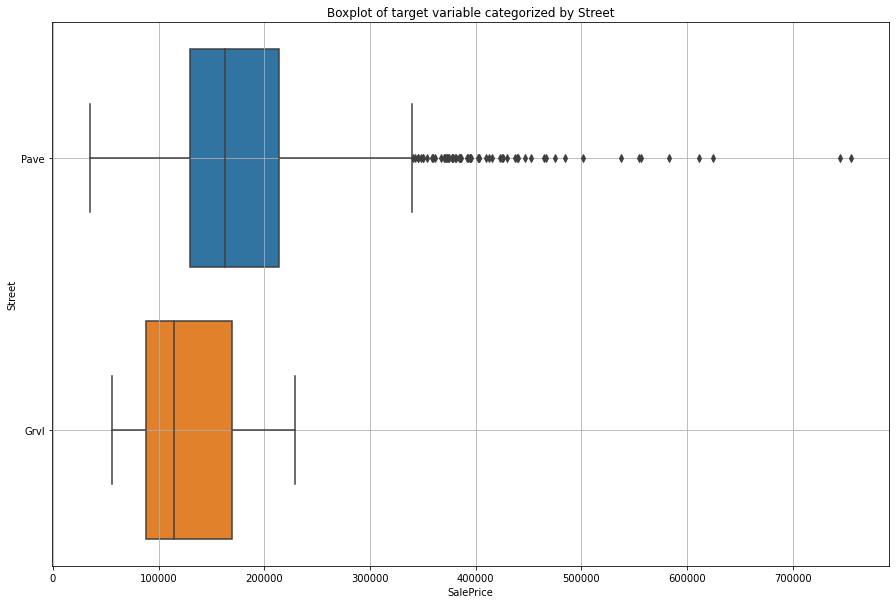

**************************************************


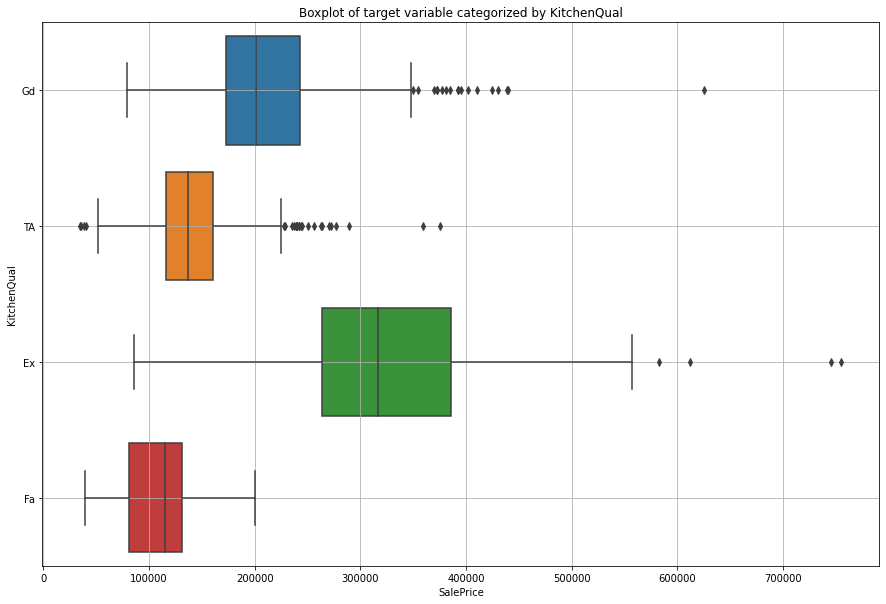

**************************************************


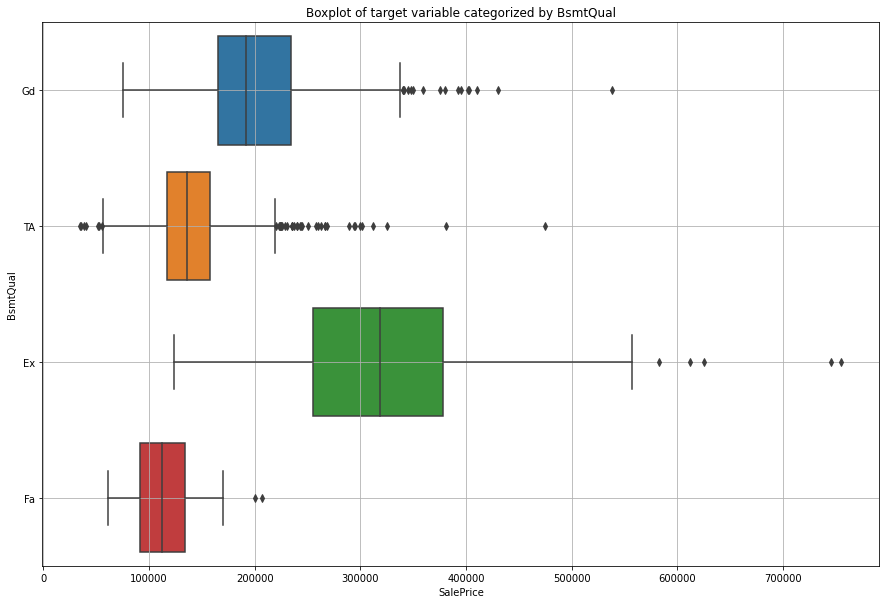

**************************************************


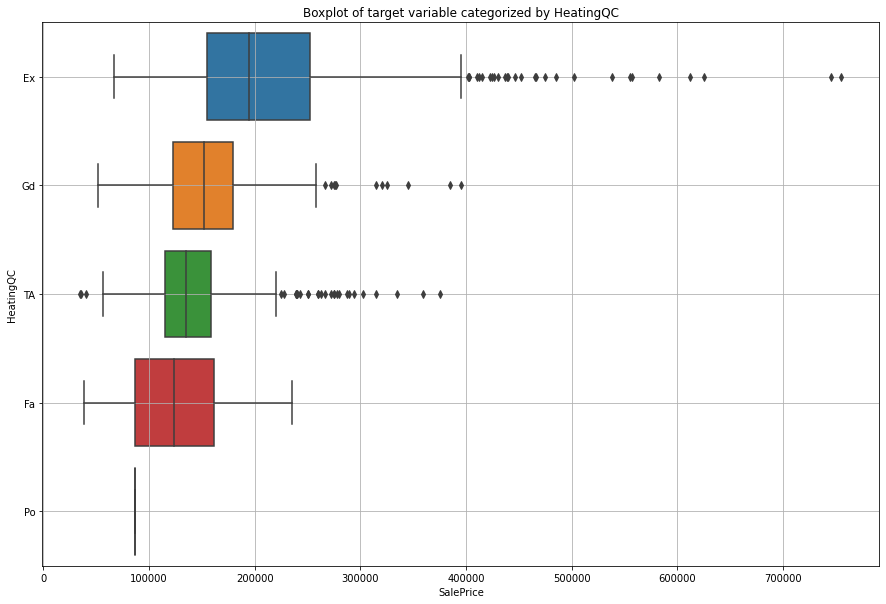

**************************************************


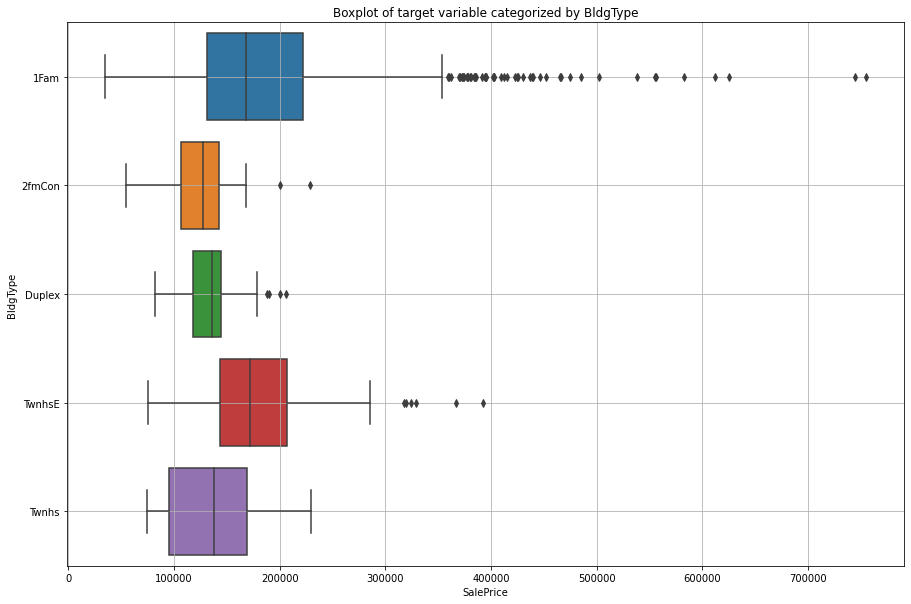

**************************************************


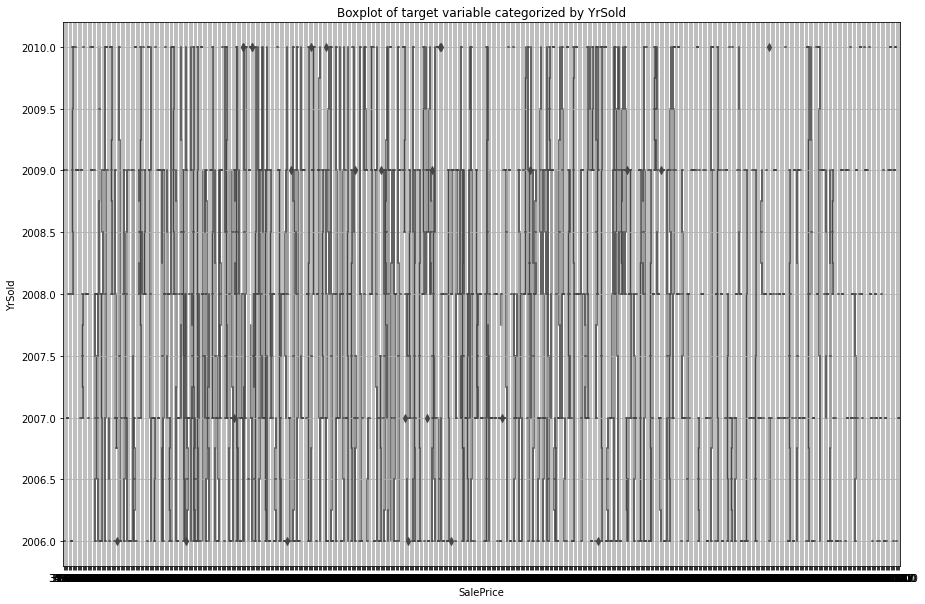

**************************************************


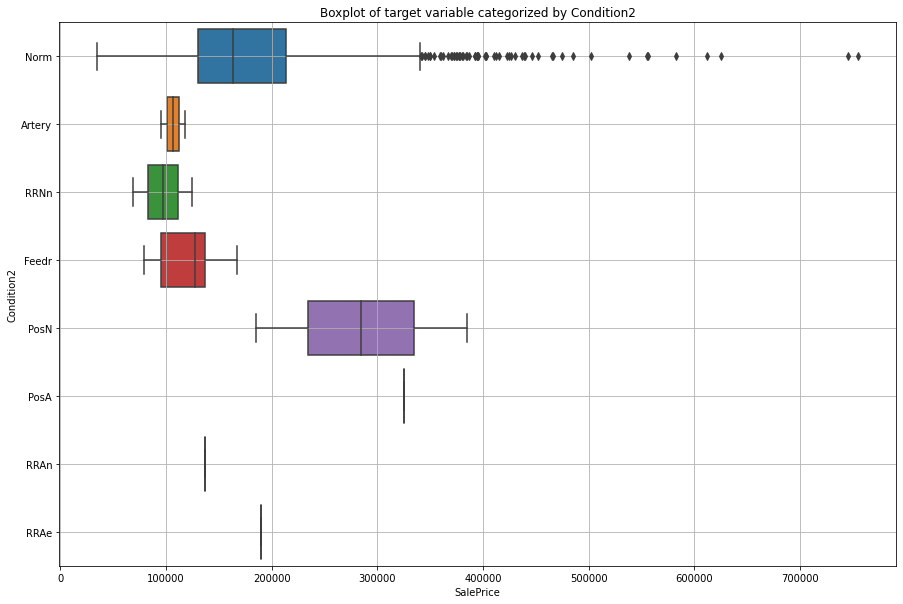

**************************************************


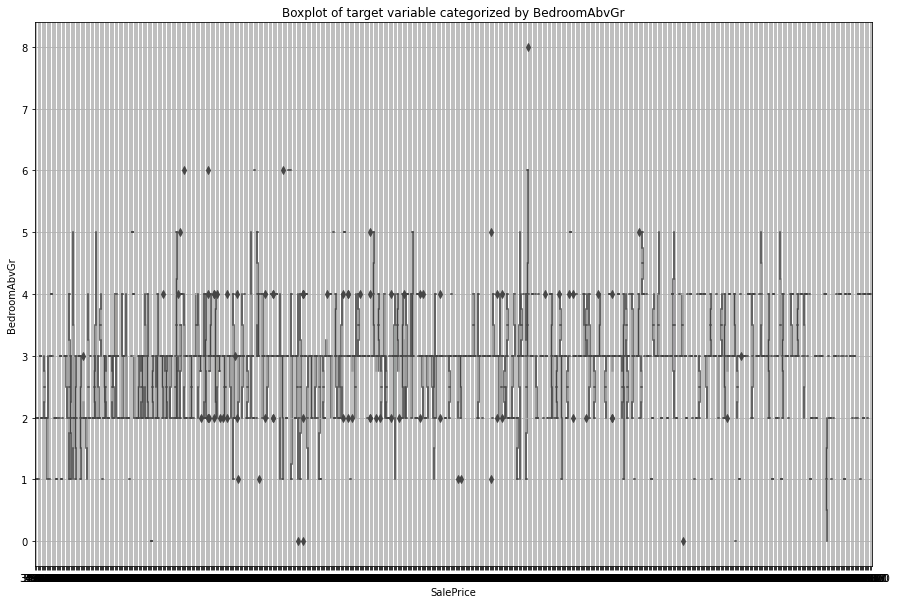

**************************************************


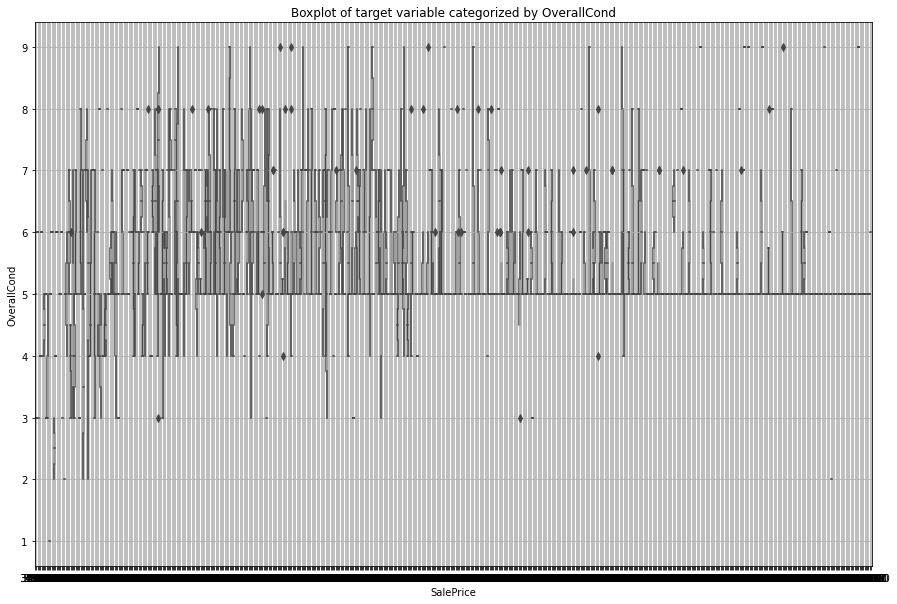

**************************************************


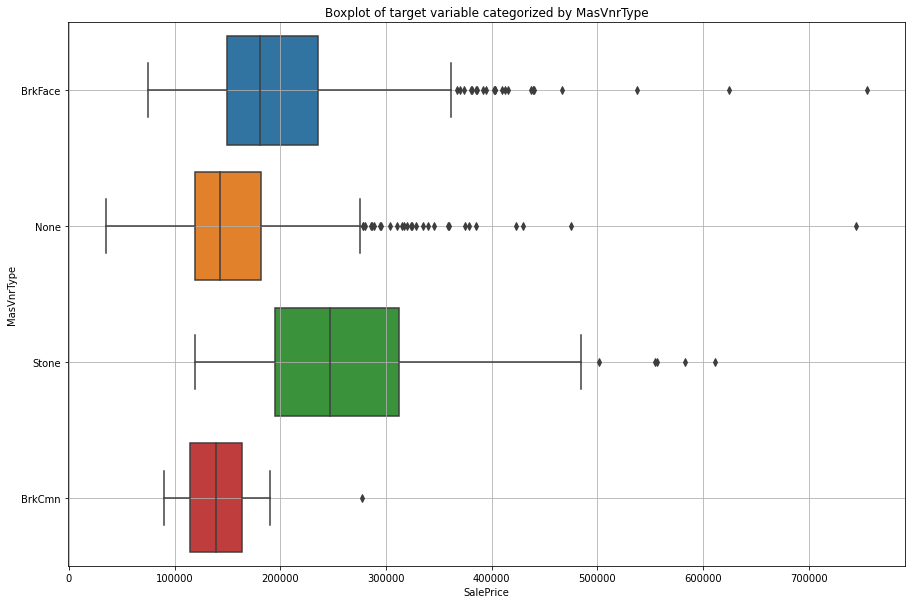

**************************************************


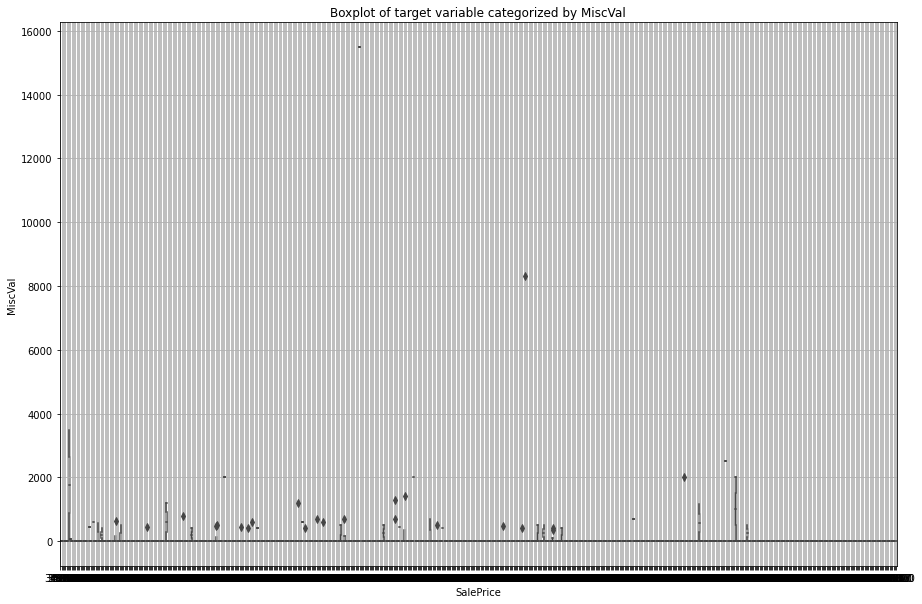

**************************************************


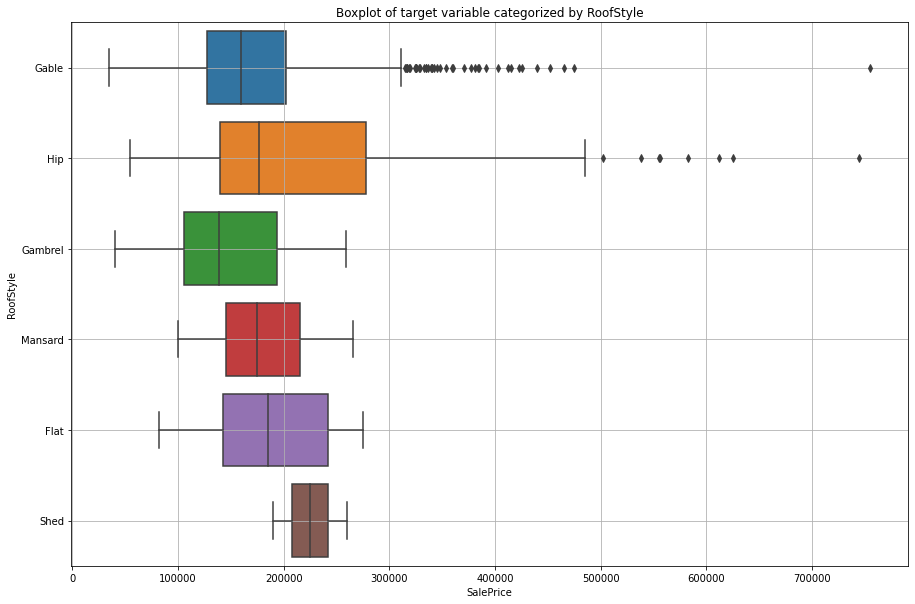

**************************************************


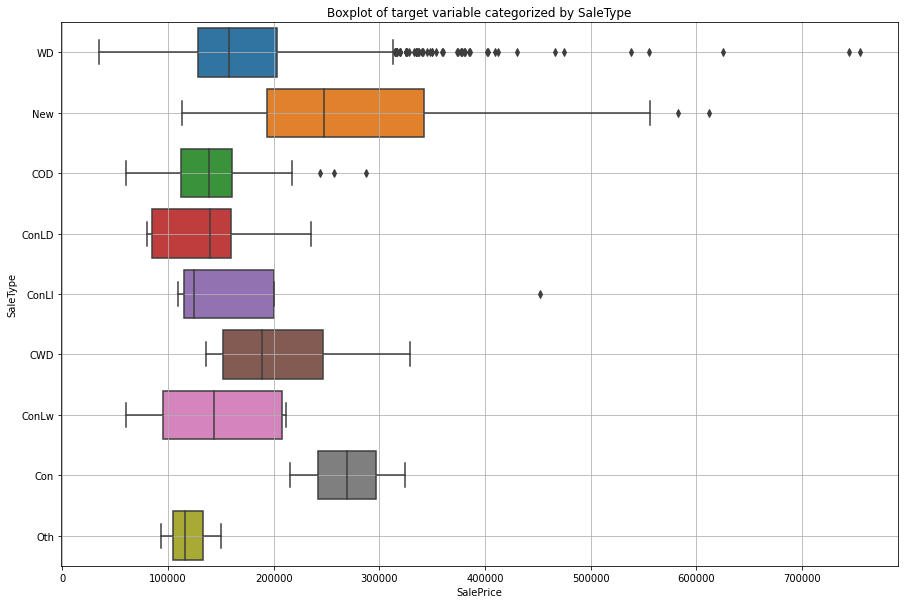

**************************************************


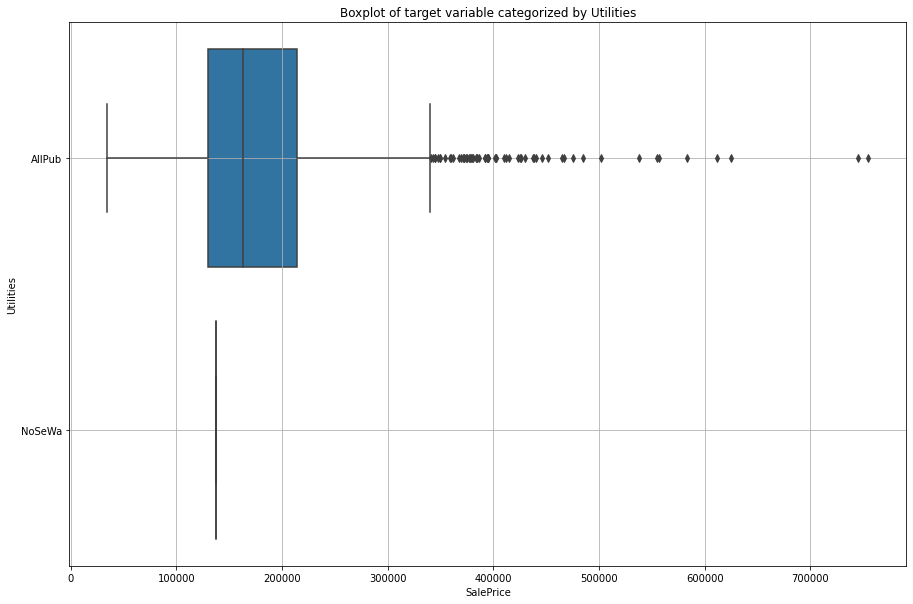

**************************************************


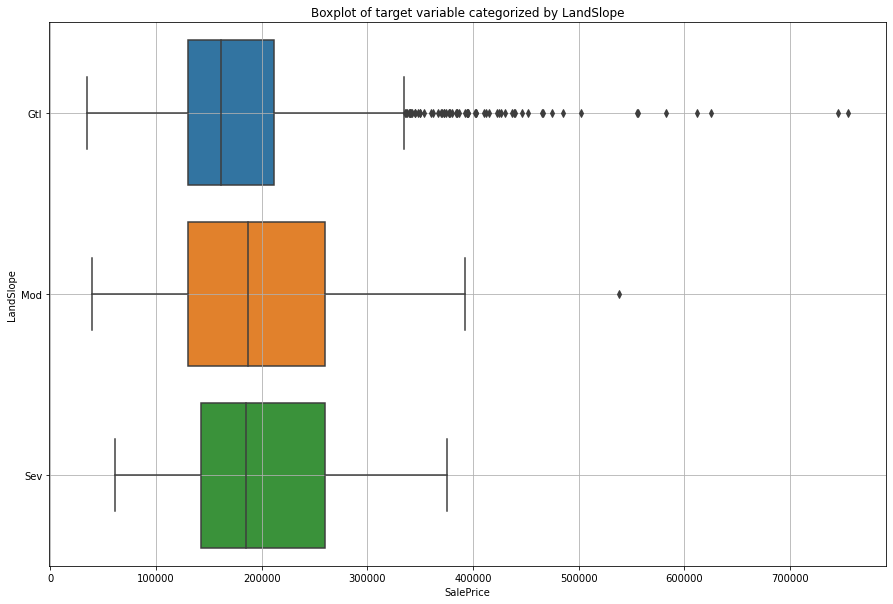

**************************************************


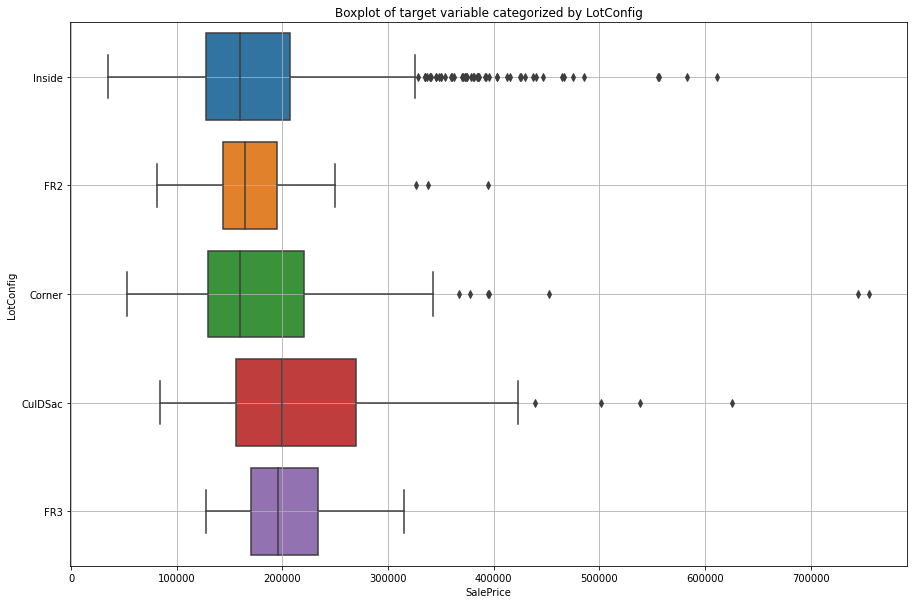

**************************************************


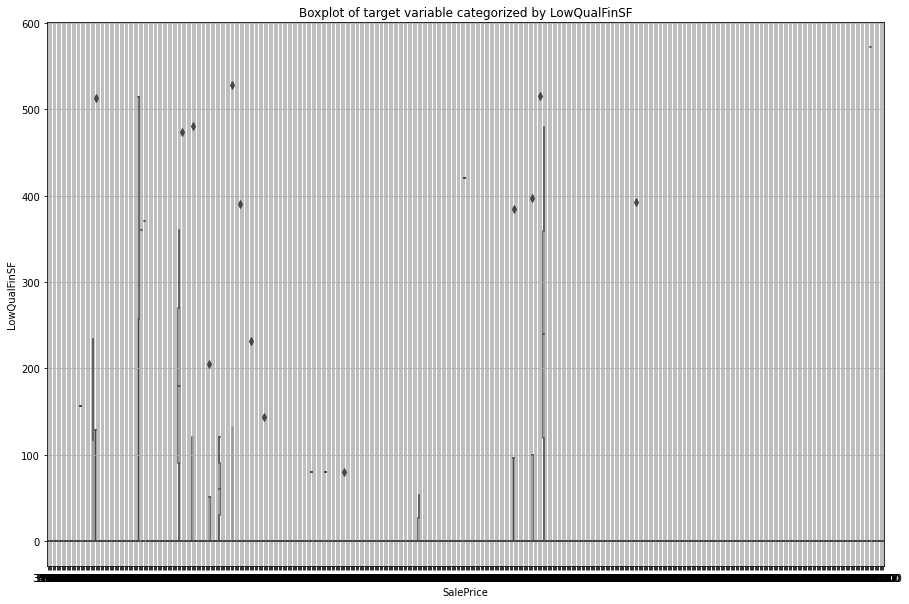

**************************************************


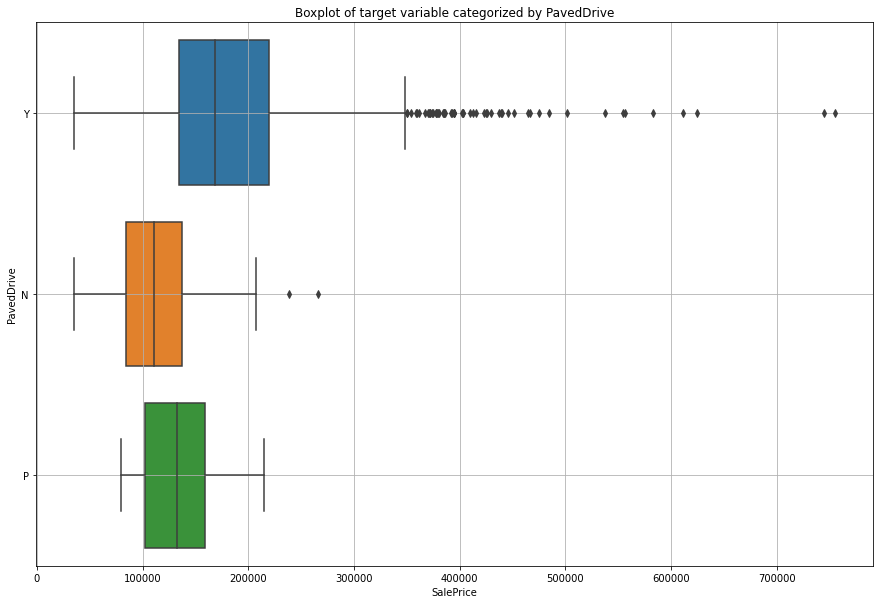

**************************************************


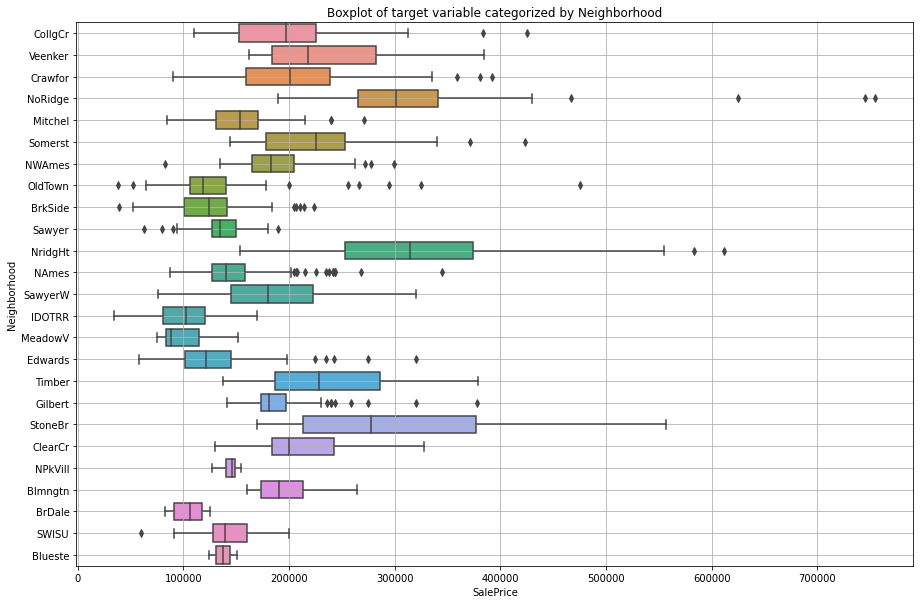

**************************************************


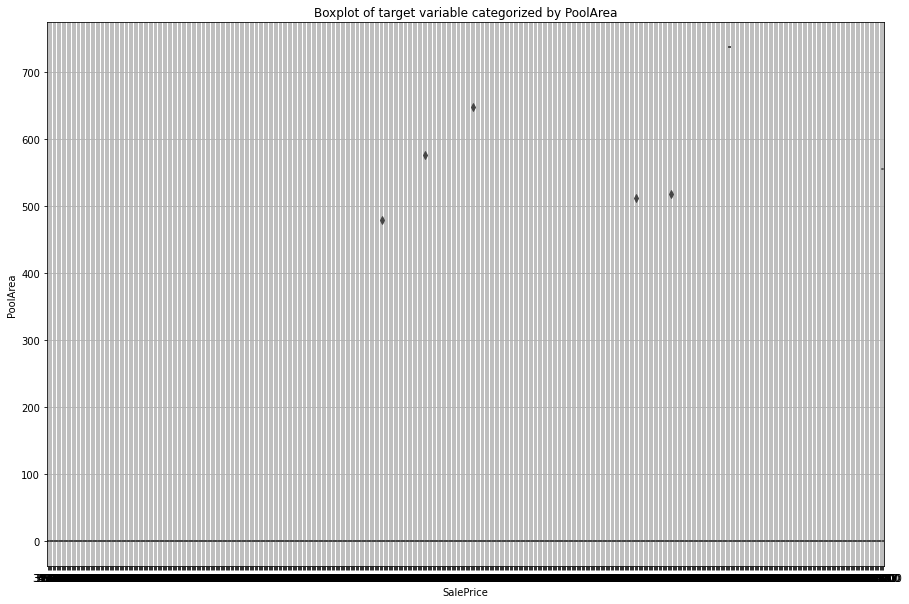

**************************************************


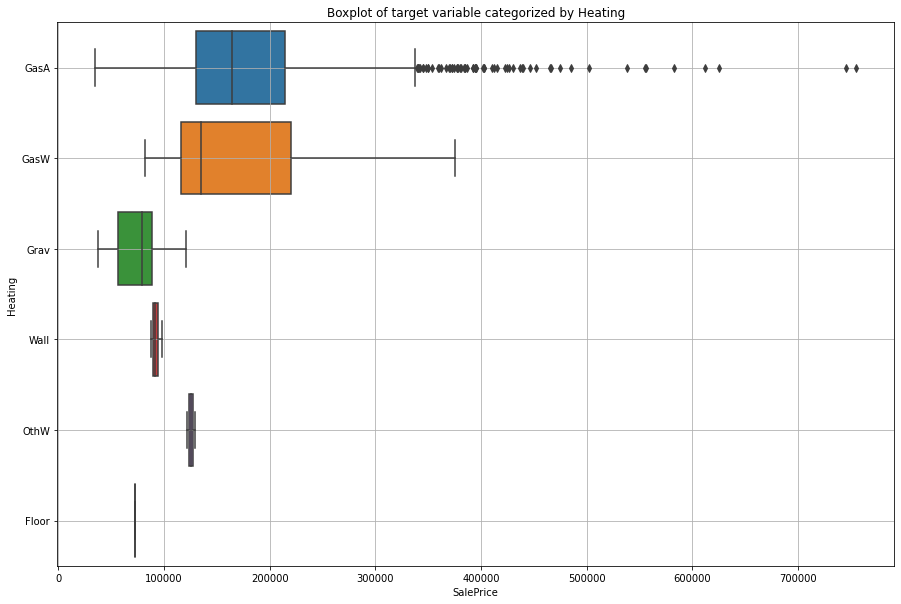

**************************************************


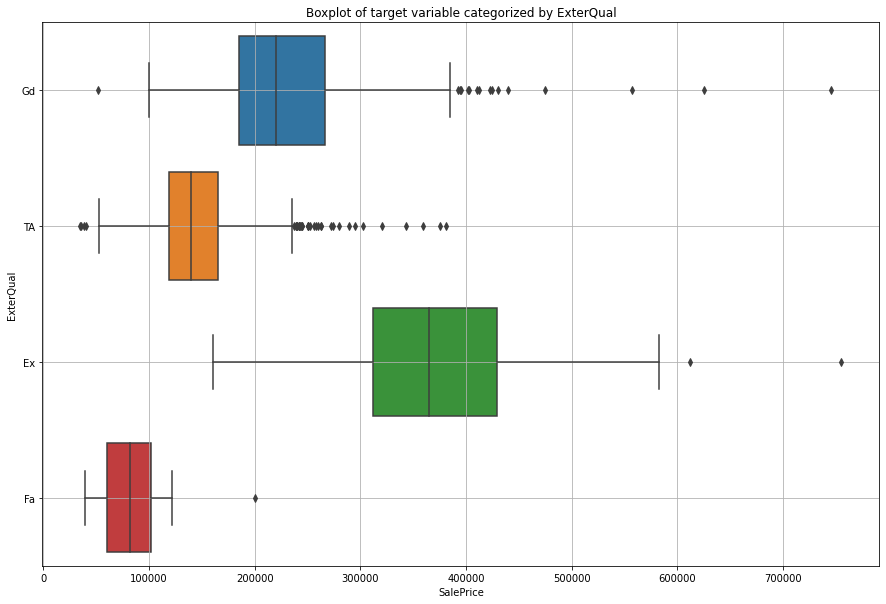

**************************************************


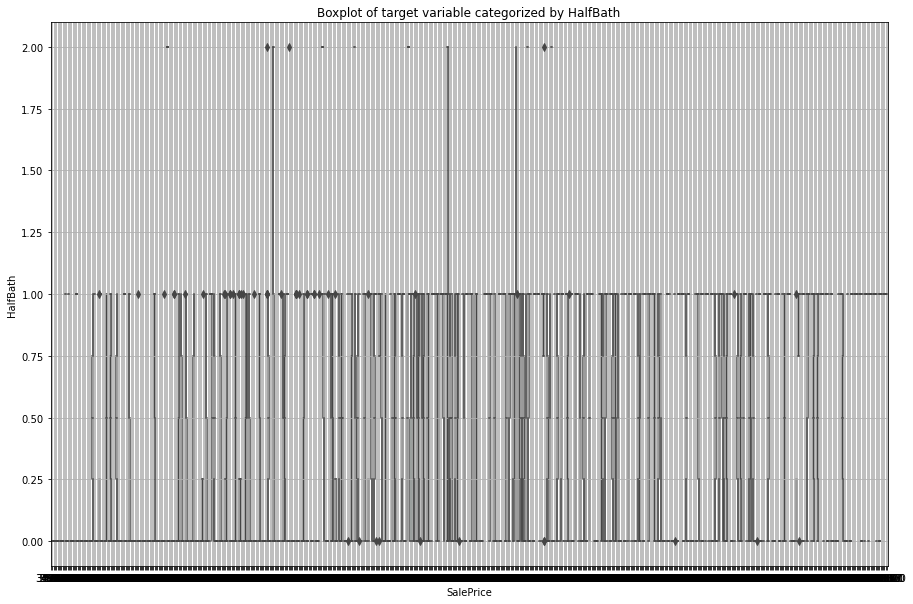

**************************************************


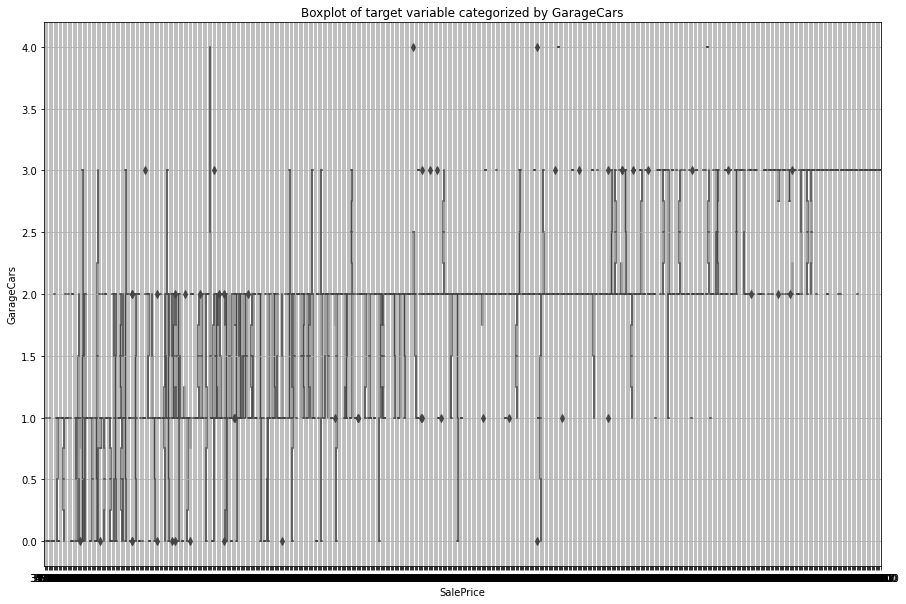

**************************************************


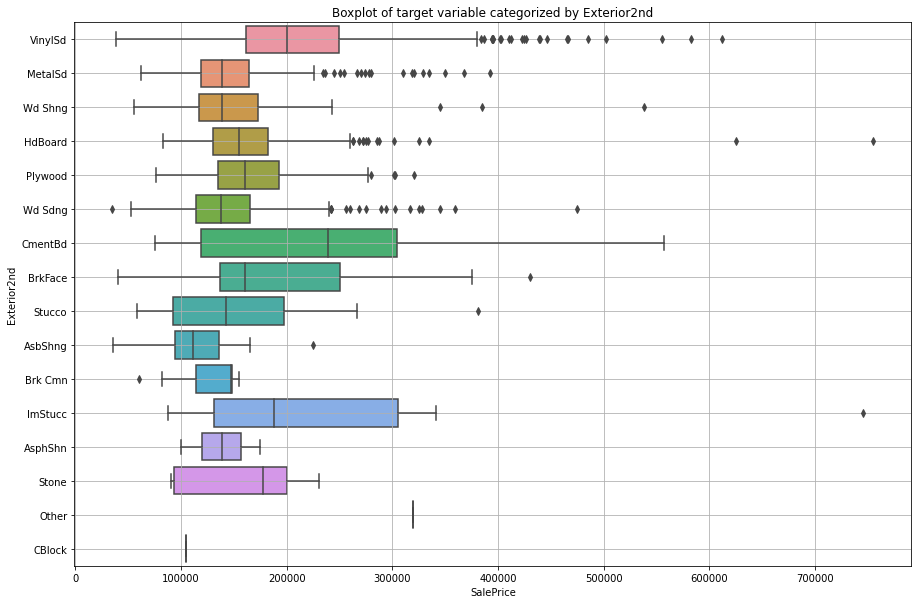

**************************************************


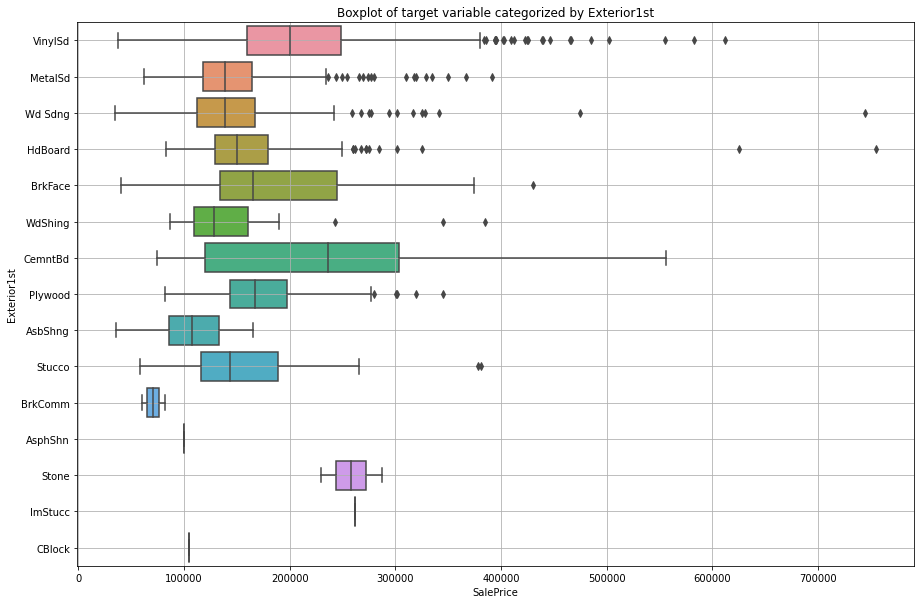

**************************************************


In [ ]:
for i in dis_variable3:
  fig = plt.figure(figsize=(15,10))
  sns.boxplot(data=df_train, x=target_variable3, y=i).set_title("Boxplot of target variable categorized by" " " +i)
  plt.grid()
  plt.show()
  print("**"*25)

#3.2.b. Countplot

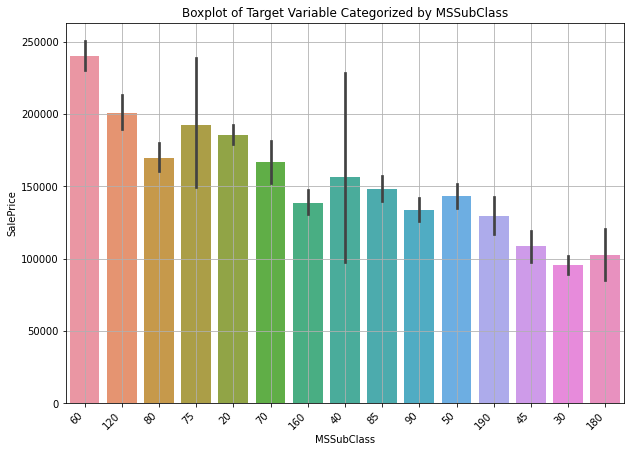

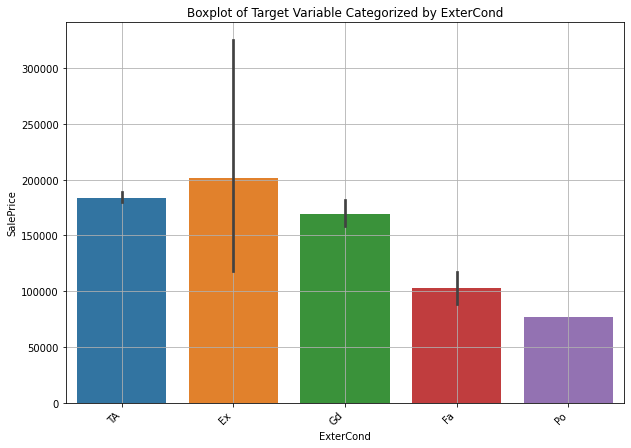

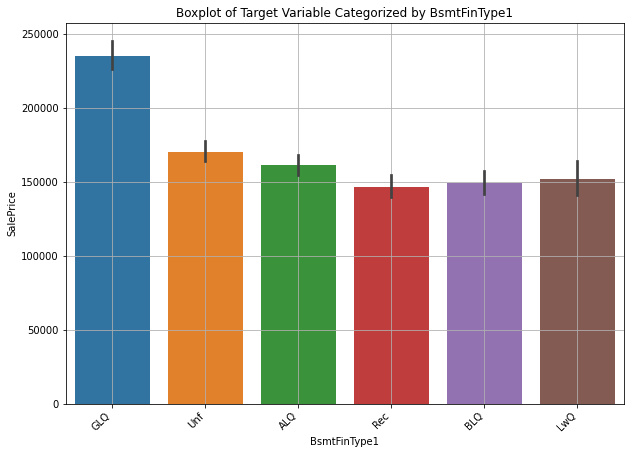

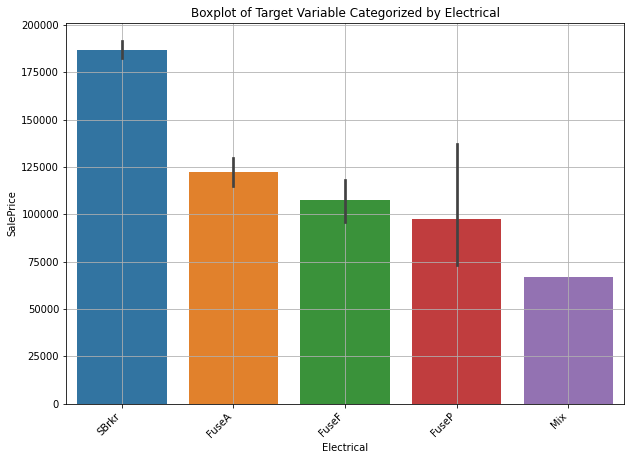

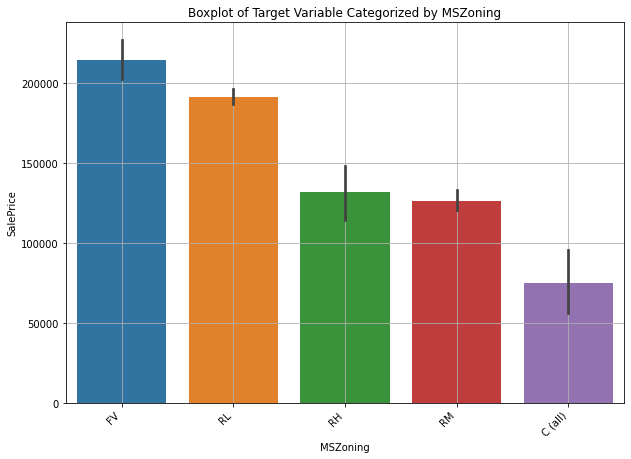

...

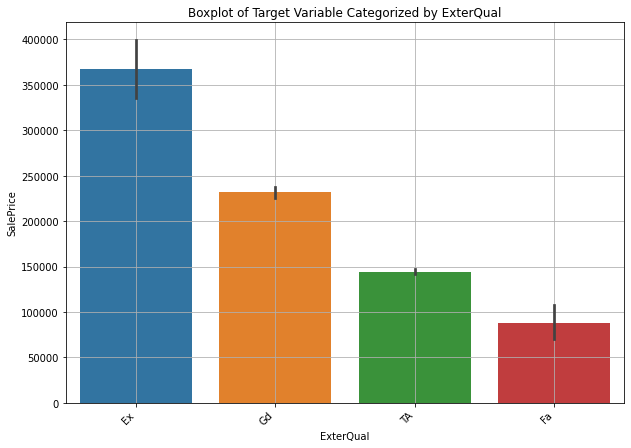

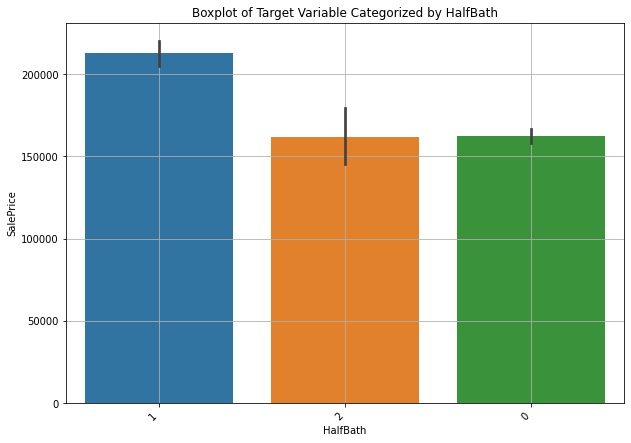

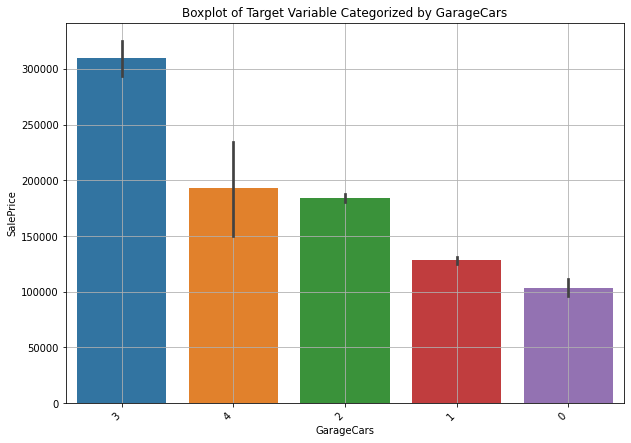

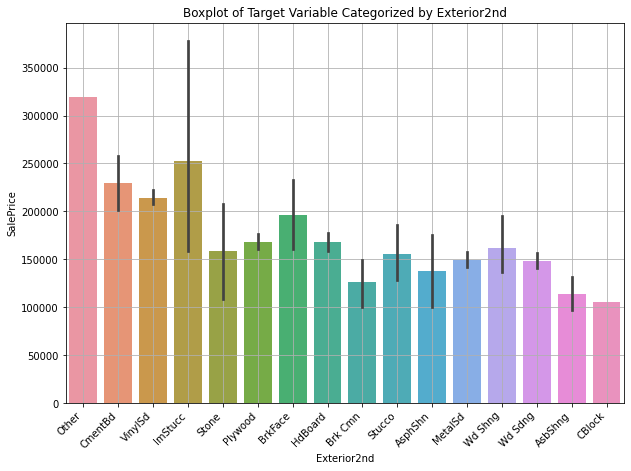

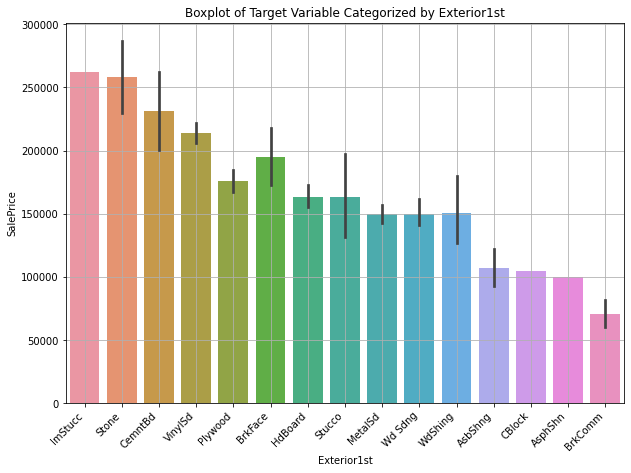

In [ ]:
for i in dis_variable3:
  import seaborn as sns
  import matplotlib.pyplot as plt
  fig=plt.figure(figsize=(10,7))
  plt.xticks(rotation=45, ha="right")
  sns.barplot(data=df_train,y=target_variable3,x=i,order=df_train[[i,target_variable3]].groupby(i).median().sort_values(by=target_variable3,ascending=False).index).set_title("Boxplot of Target Variable Categorized by "+i)
  plt.grid(True)
  plt.show()
  print("="*45)

#3.2.c. Violinplot

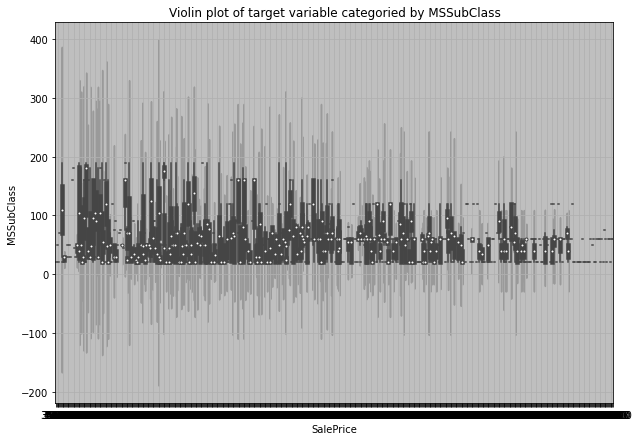

****************************************************************************************************


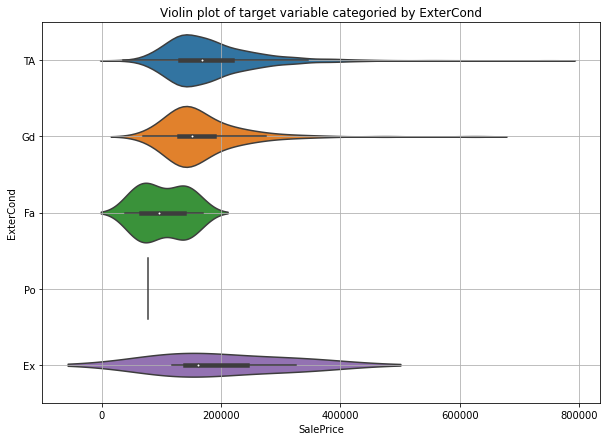

****************************************************************************************************


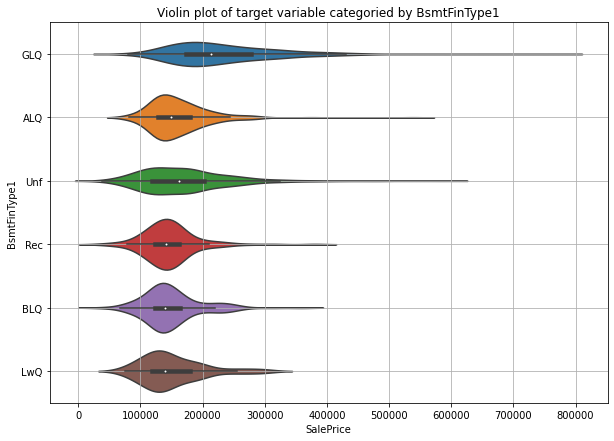

****************************************************************************************************


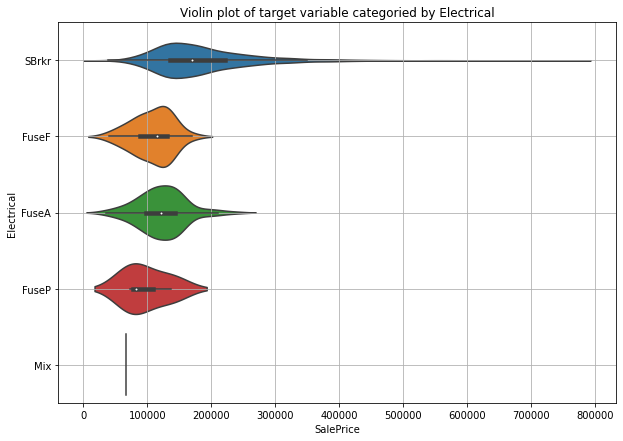

****************************************************************************************************


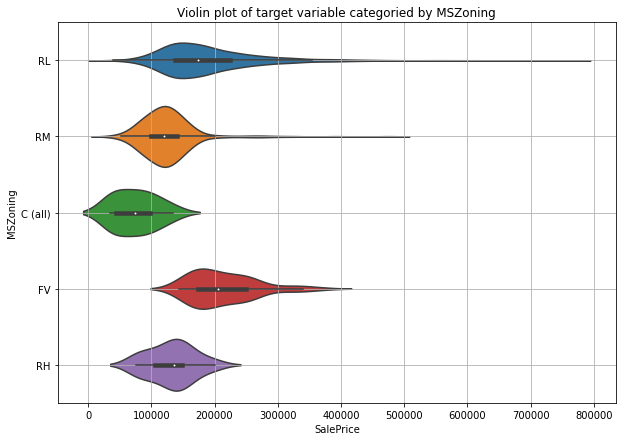

****************************************************************************************************


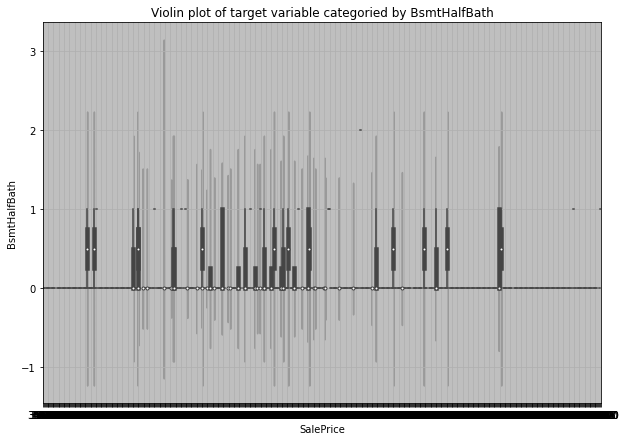

****************************************************************************************************


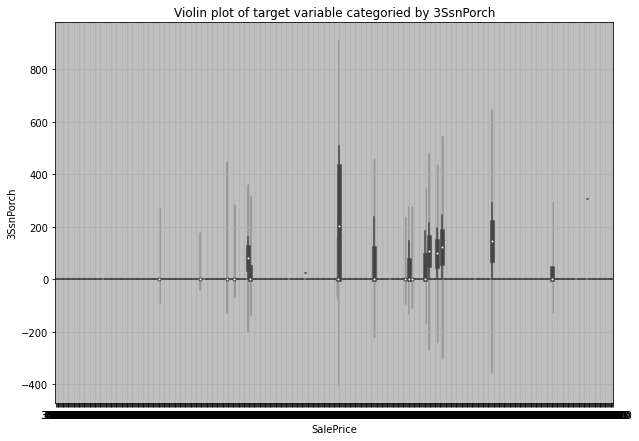

****************************************************************************************************


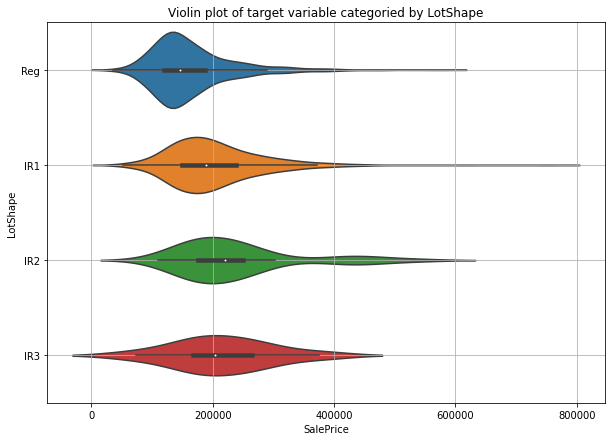

****************************************************************************************************


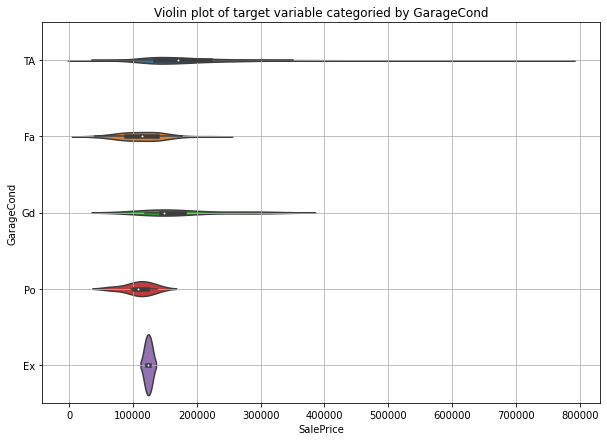

****************************************************************************************************


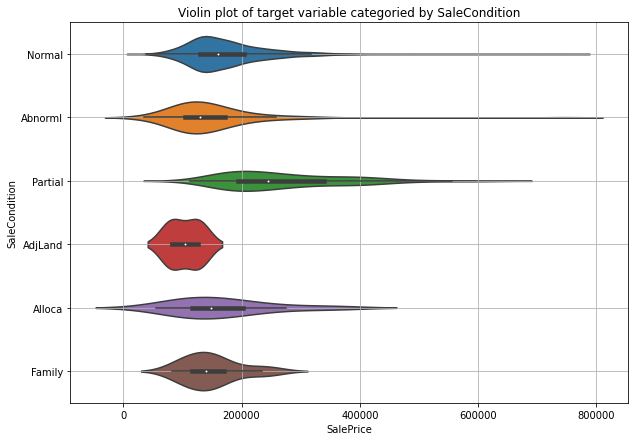

****************************************************************************************************


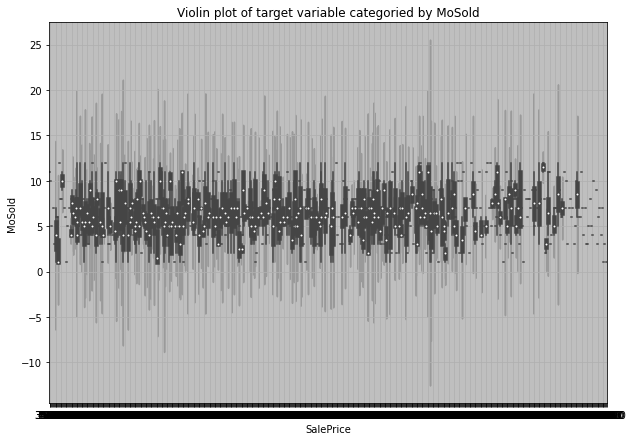

****************************************************************************************************


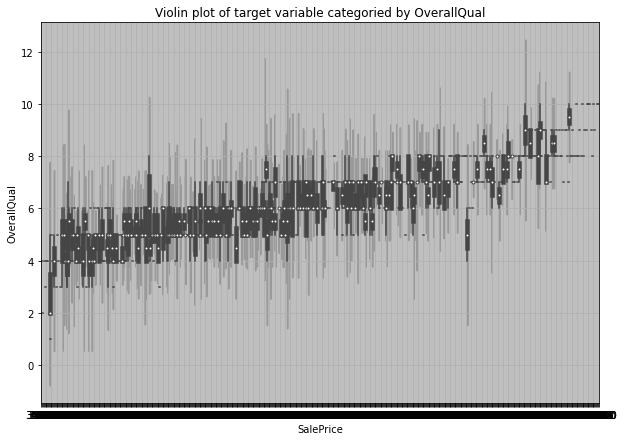

****************************************************************************************************


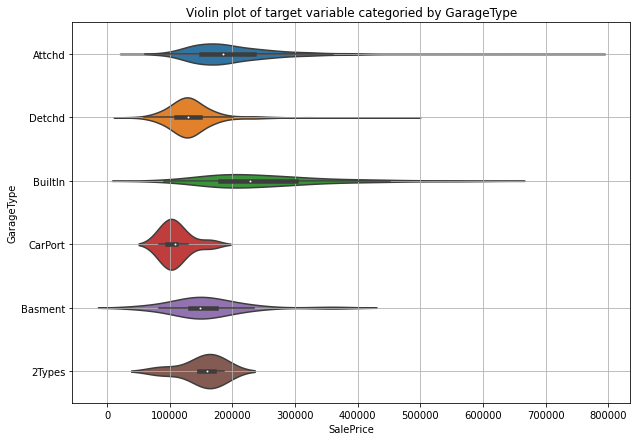

****************************************************************************************************


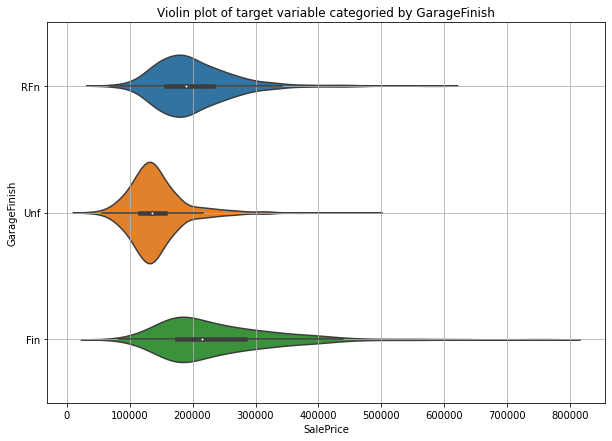

****************************************************************************************************


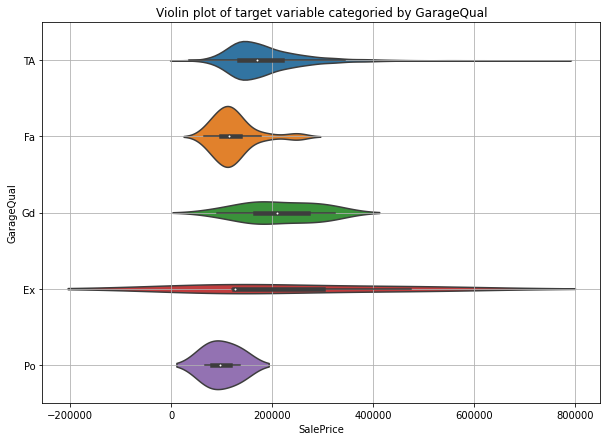

****************************************************************************************************


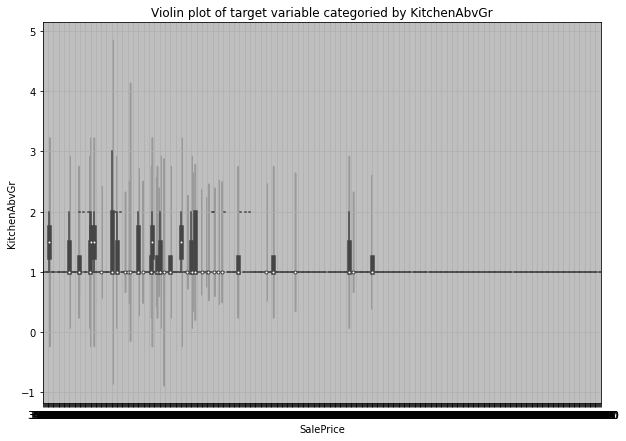

****************************************************************************************************


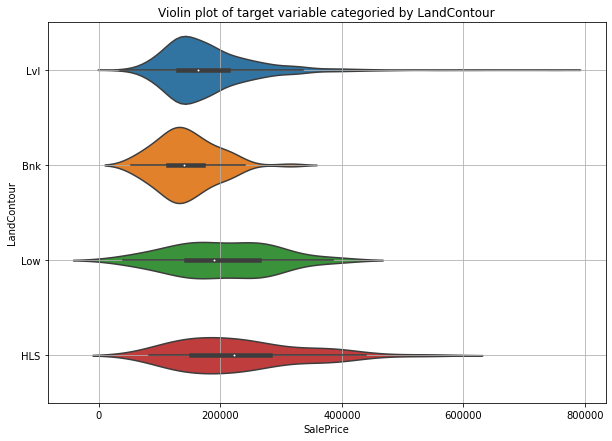

****************************************************************************************************


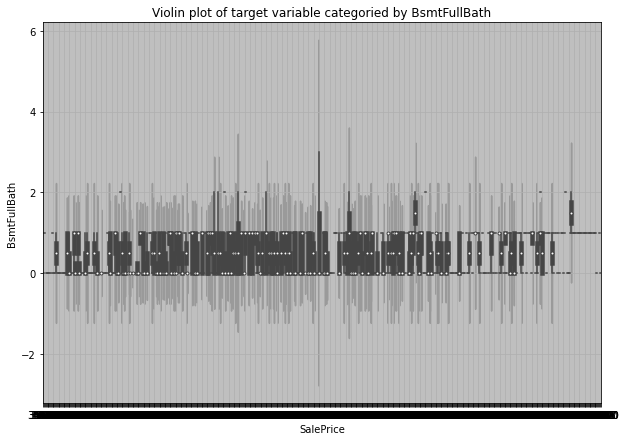

****************************************************************************************************


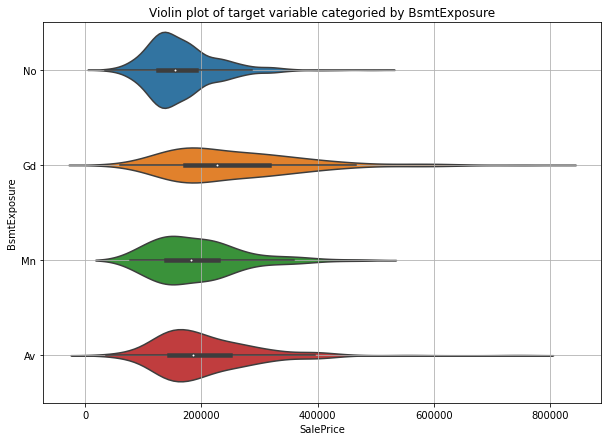

****************************************************************************************************


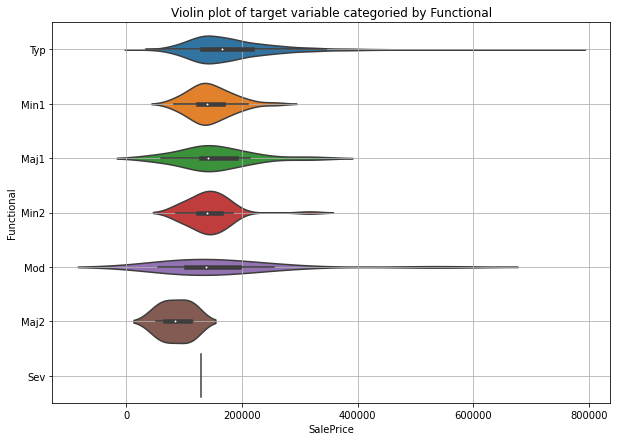

****************************************************************************************************


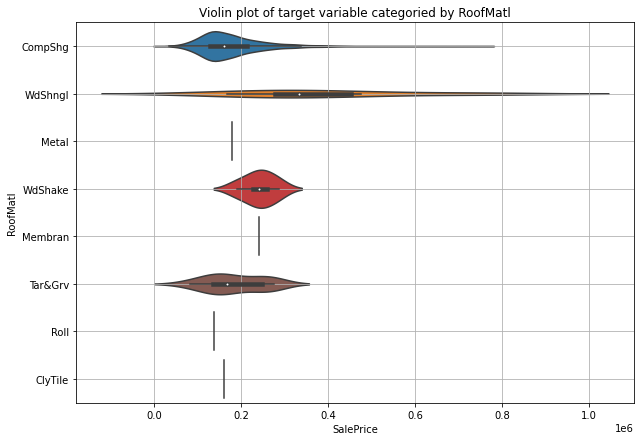

****************************************************************************************************


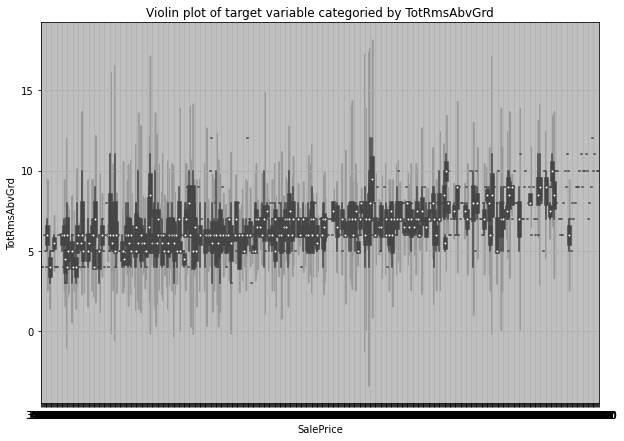

****************************************************************************************************


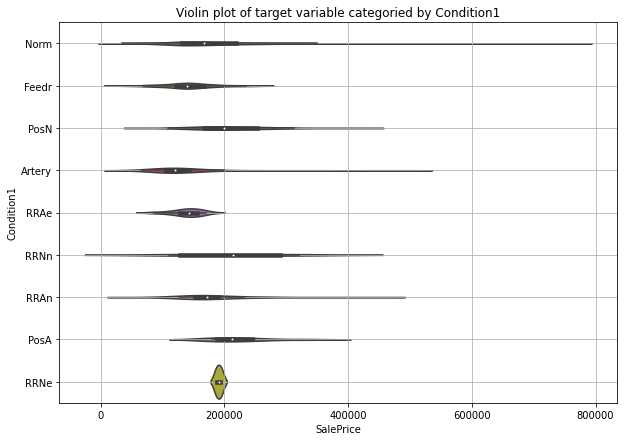

****************************************************************************************************


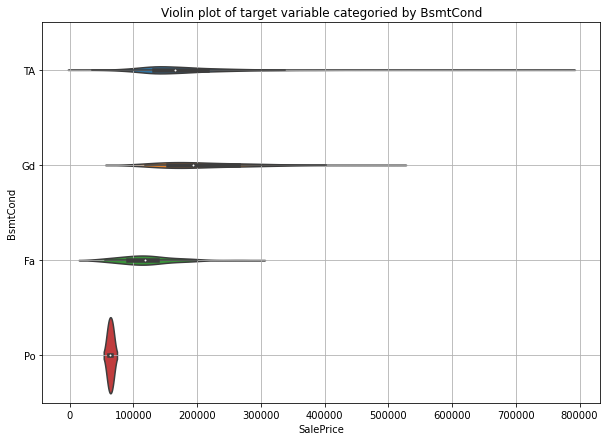

****************************************************************************************************


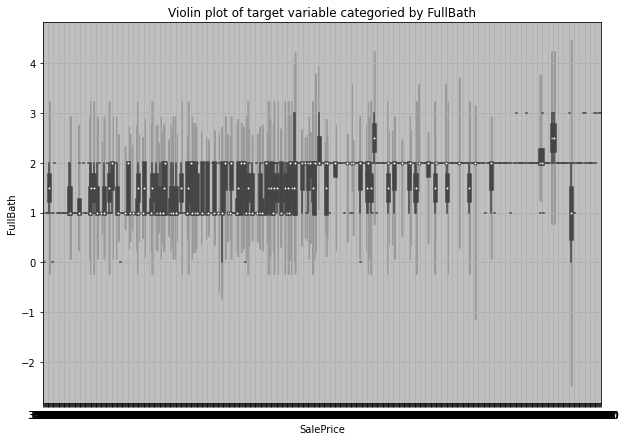

****************************************************************************************************


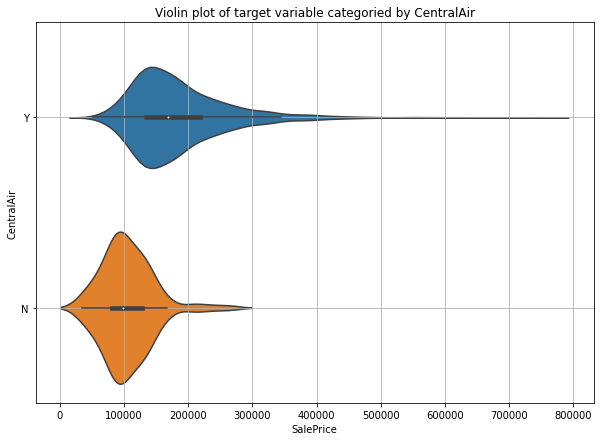

****************************************************************************************************


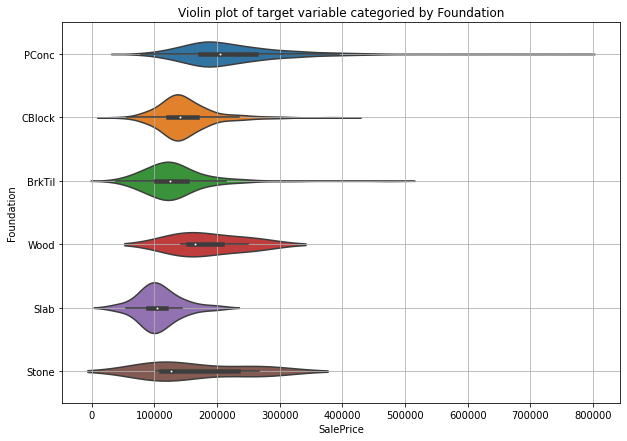

****************************************************************************************************


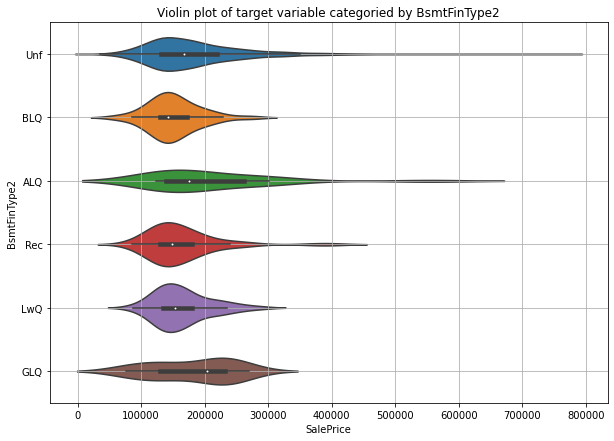

****************************************************************************************************


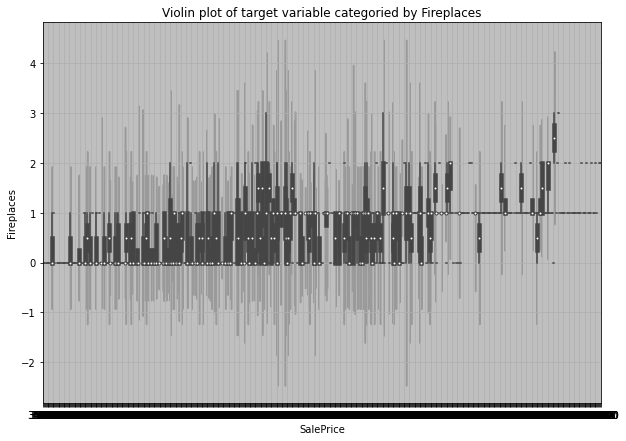

****************************************************************************************************


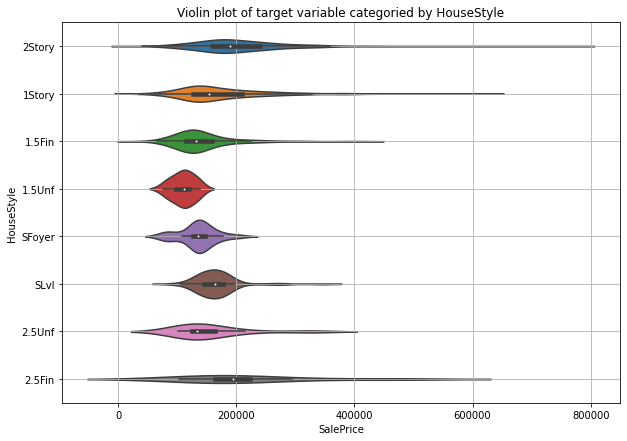

****************************************************************************************************


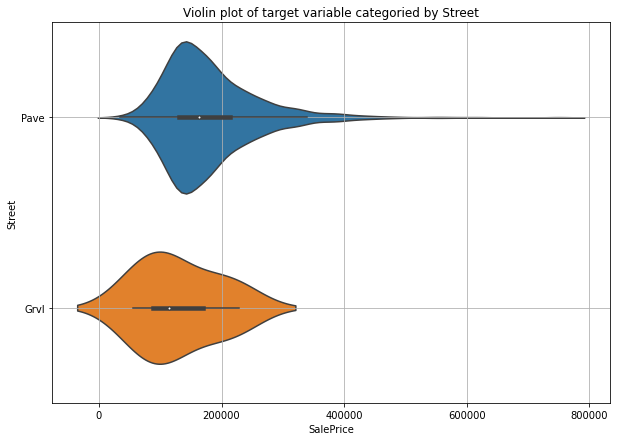

****************************************************************************************************


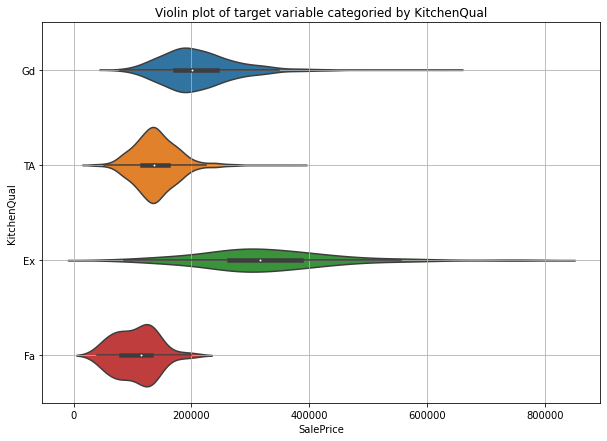

****************************************************************************************************


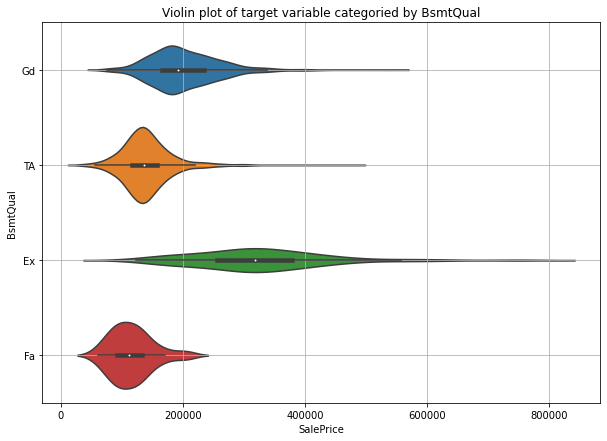

****************************************************************************************************


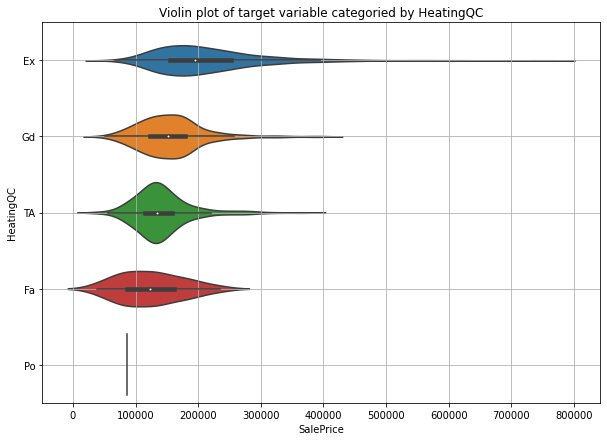

****************************************************************************************************


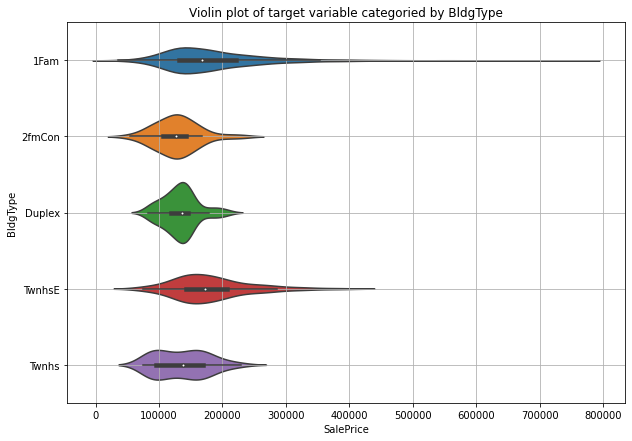

****************************************************************************************************


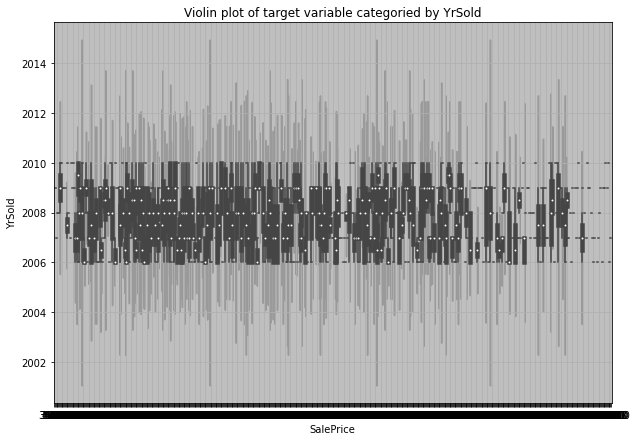

****************************************************************************************************


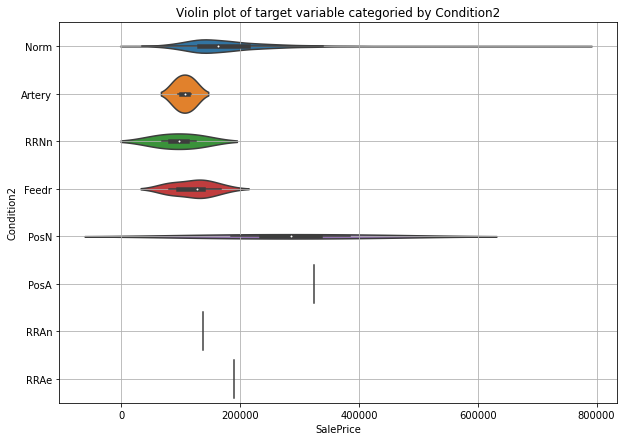

****************************************************************************************************


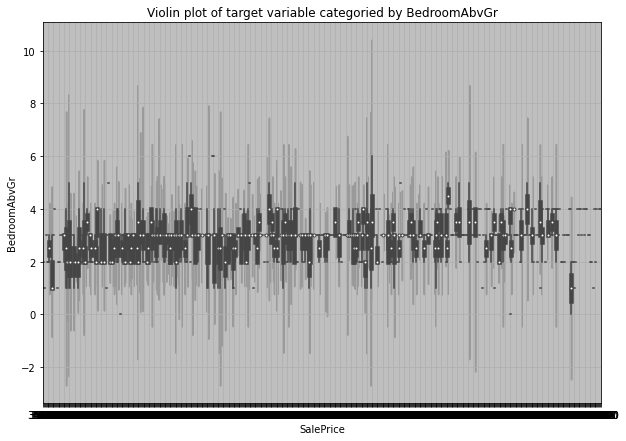

****************************************************************************************************


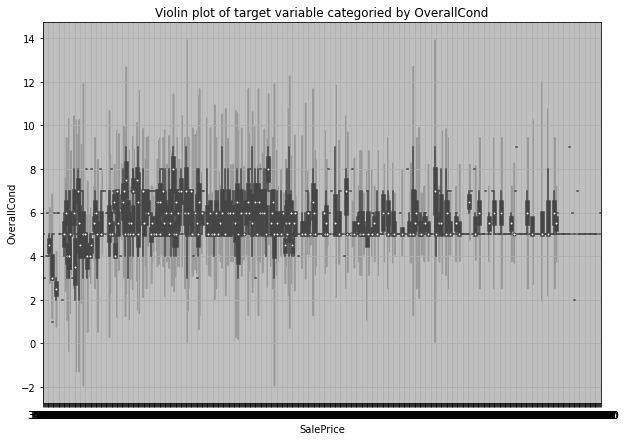

****************************************************************************************************


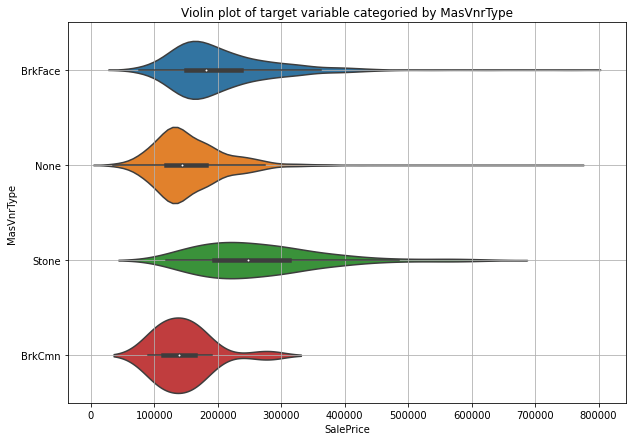

****************************************************************************************************


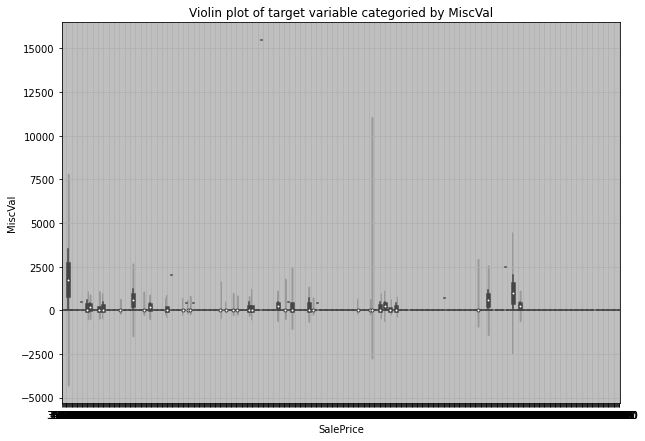

****************************************************************************************************


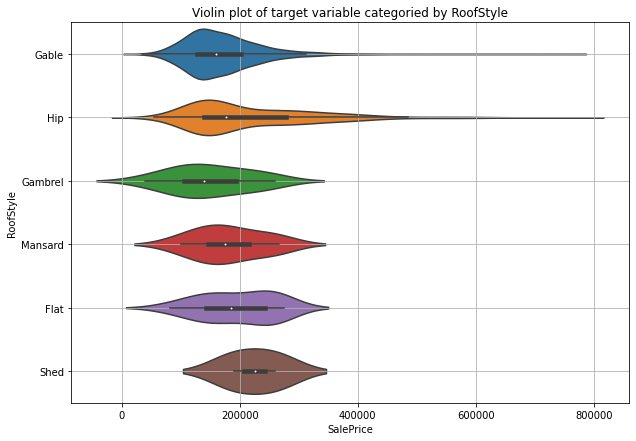

****************************************************************************************************


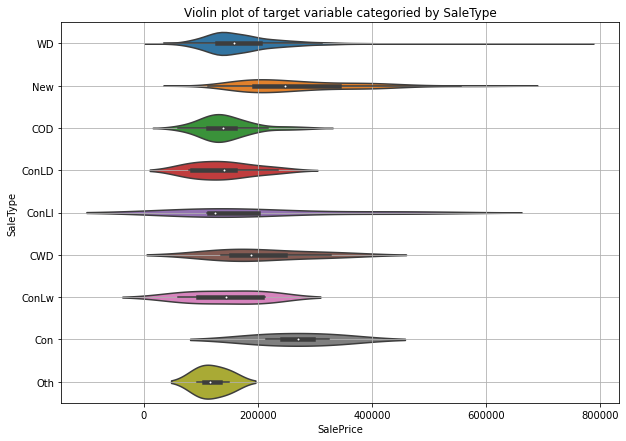

****************************************************************************************************


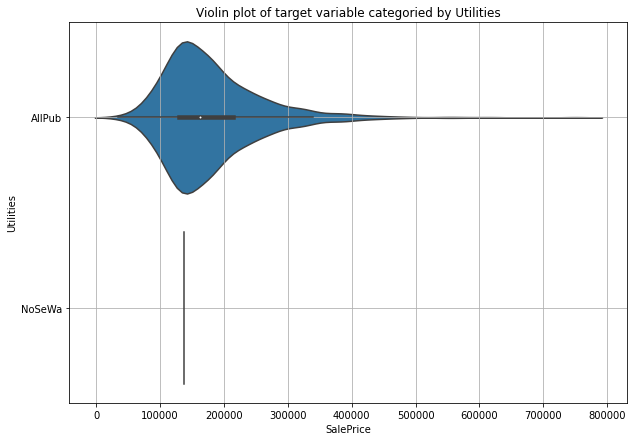

****************************************************************************************************


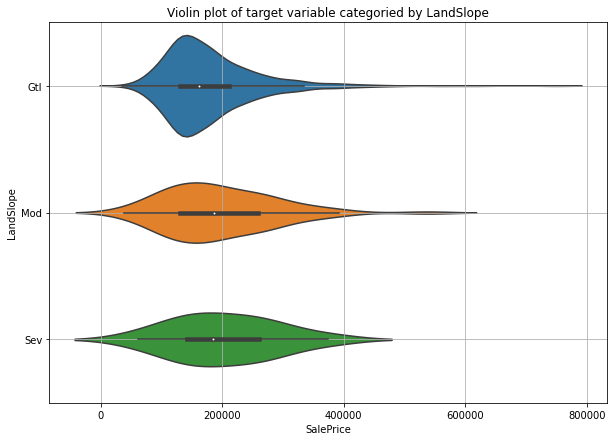

****************************************************************************************************


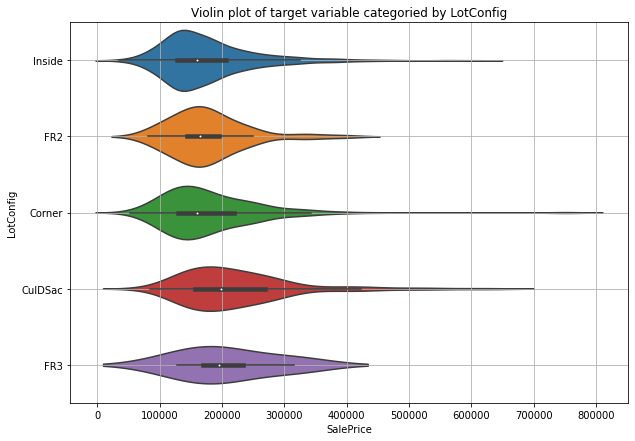

****************************************************************************************************


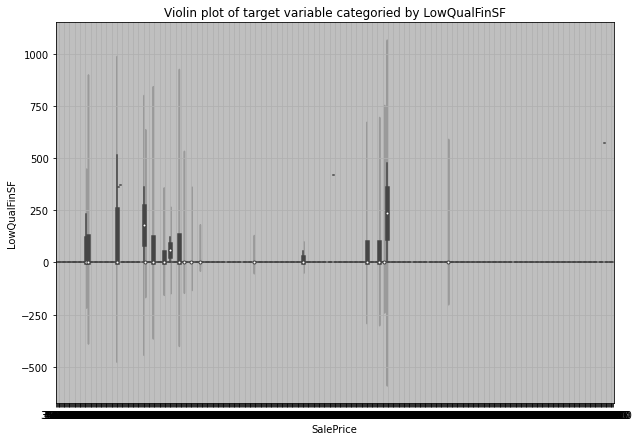

****************************************************************************************************


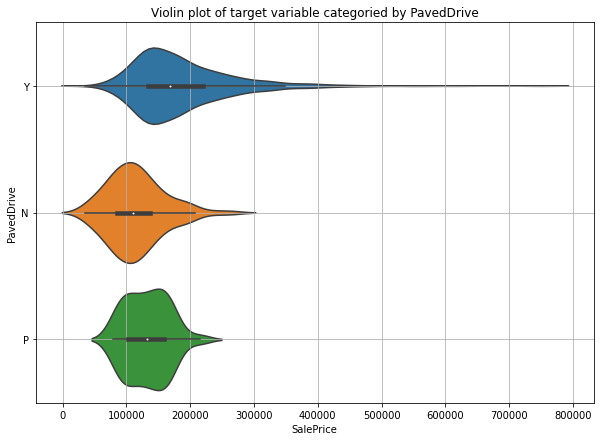

****************************************************************************************************


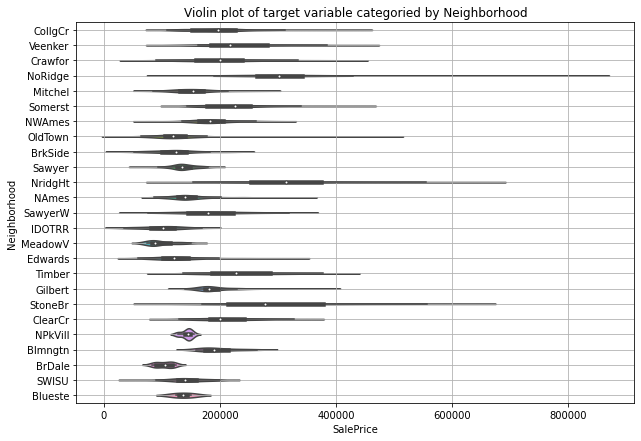

****************************************************************************************************


In [ ]:
for i in dis_variable3:
  fig = plt.figure(figsize=(10,7))
  sns.violinplot(data=df_train,x=target_variable3,y=i).set_title("Violin plot of target variable categoried by"" "+i)
  plt.grid()
  plt.show()
  print("****"*25)

# 3.2.d. Scatter plot

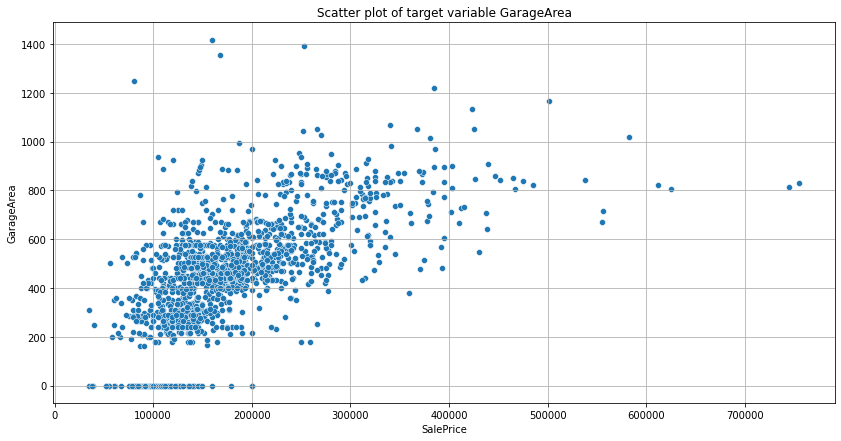

************************************************************


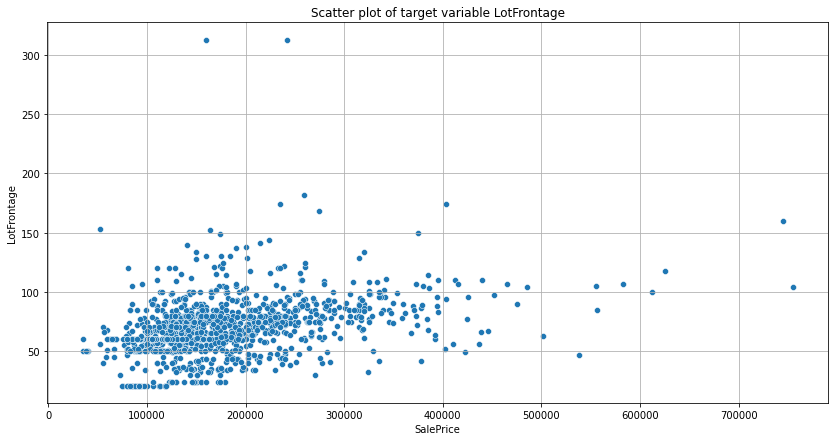

************************************************************


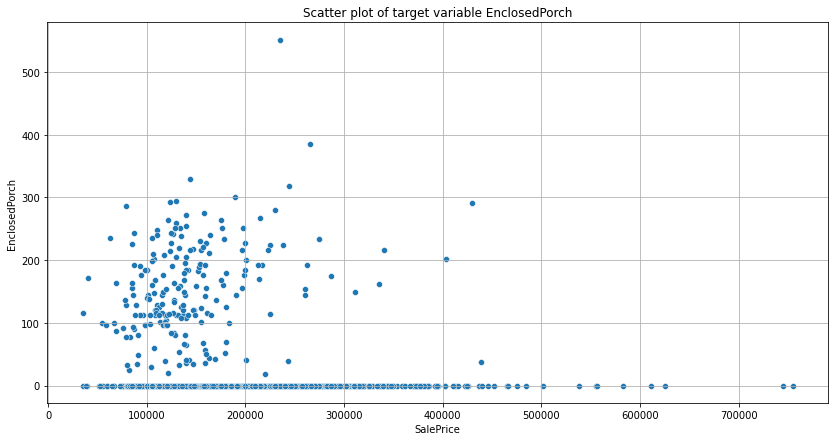

************************************************************


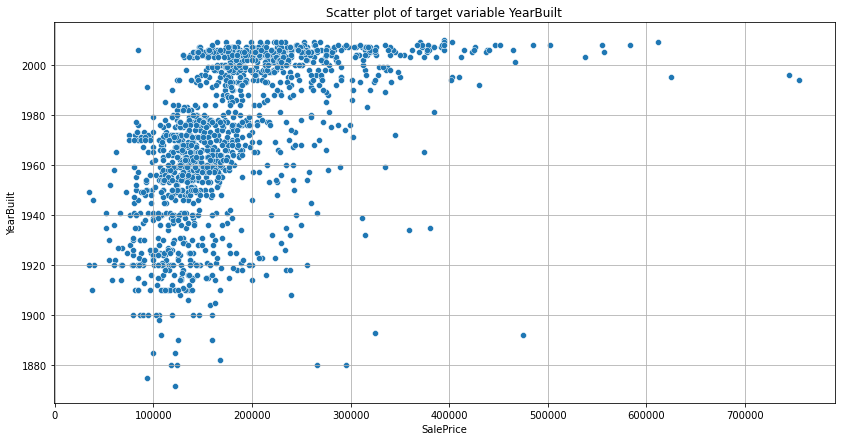

************************************************************


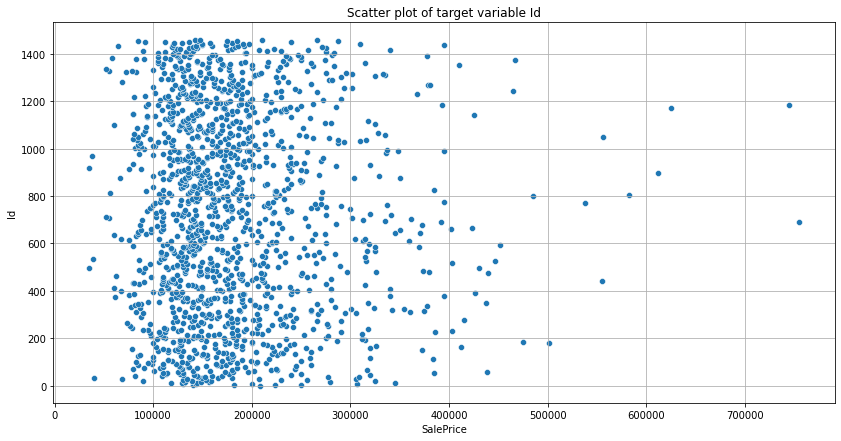

************************************************************


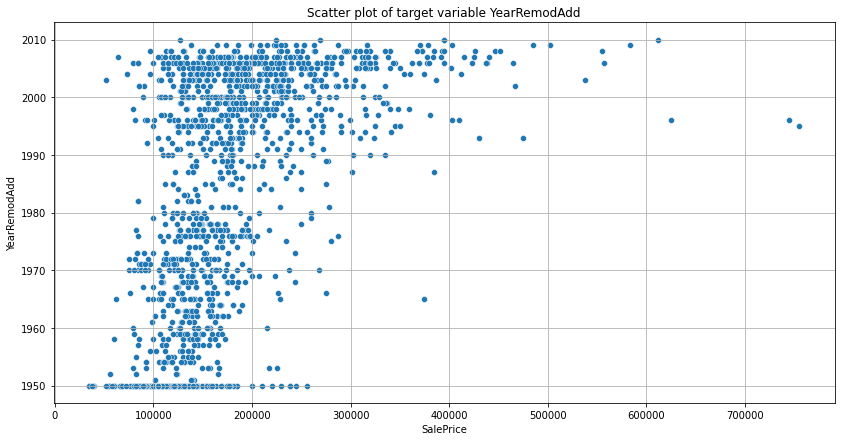

************************************************************


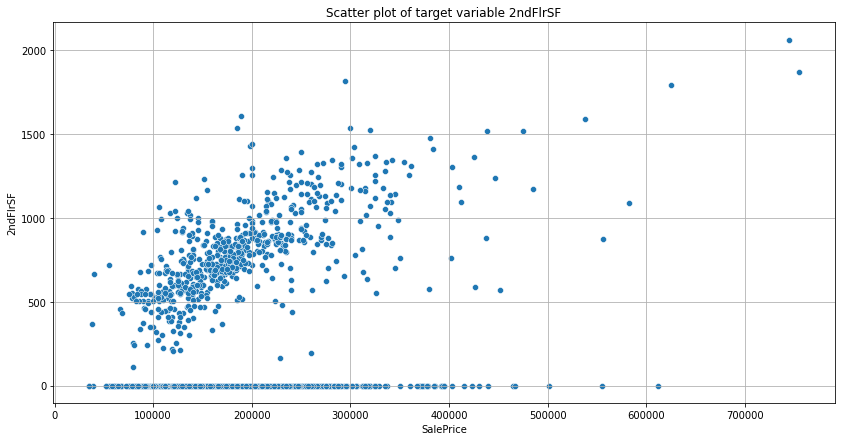

************************************************************


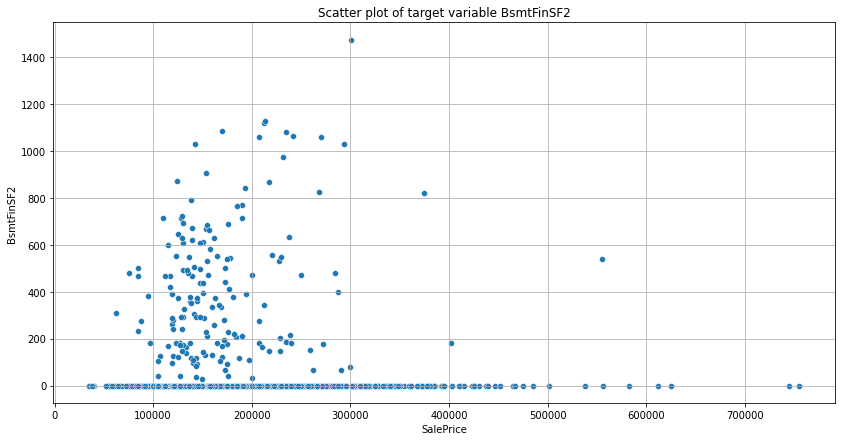

************************************************************


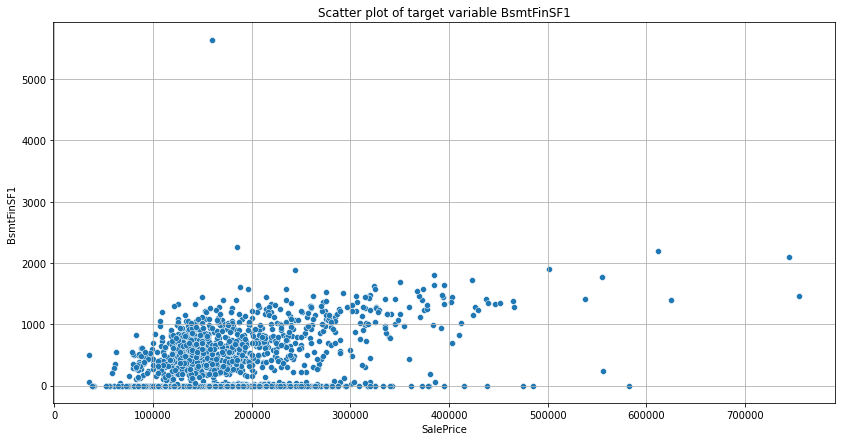

************************************************************


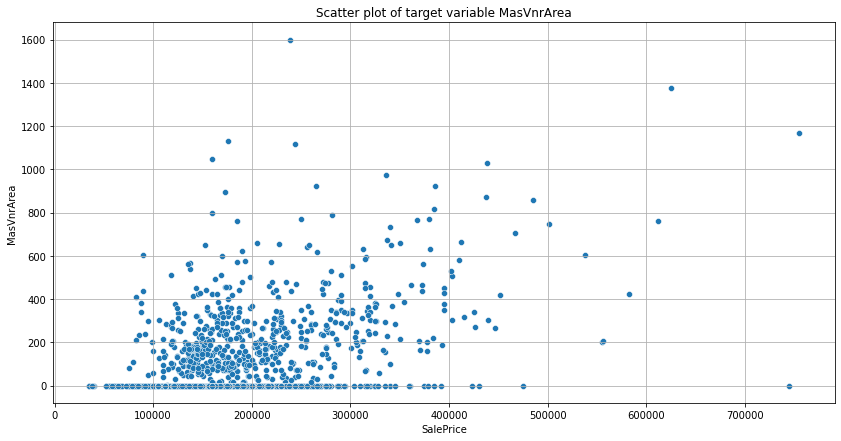

************************************************************


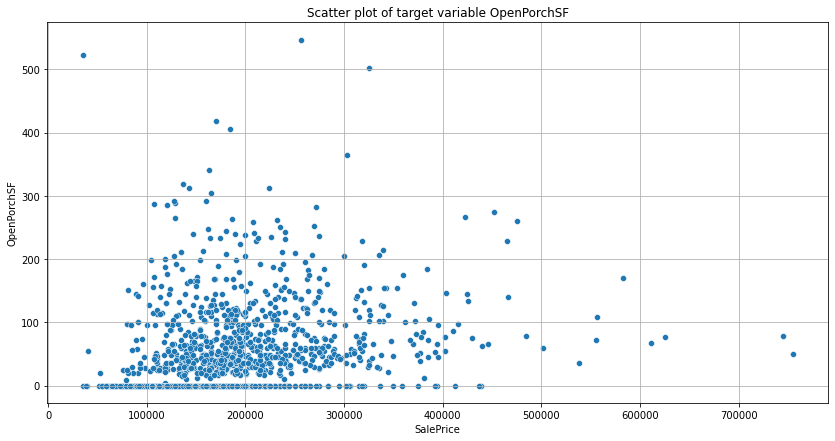

************************************************************


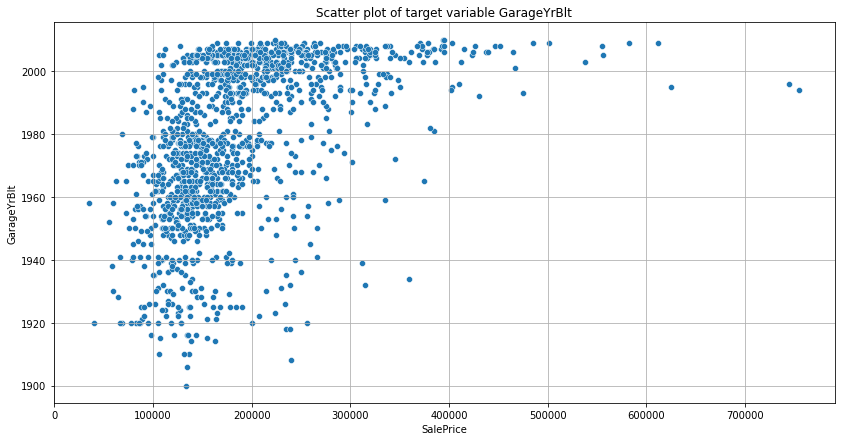

************************************************************


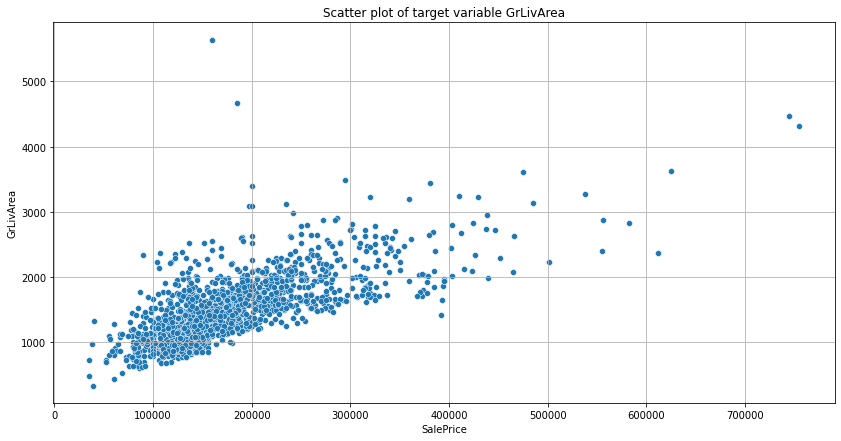

************************************************************


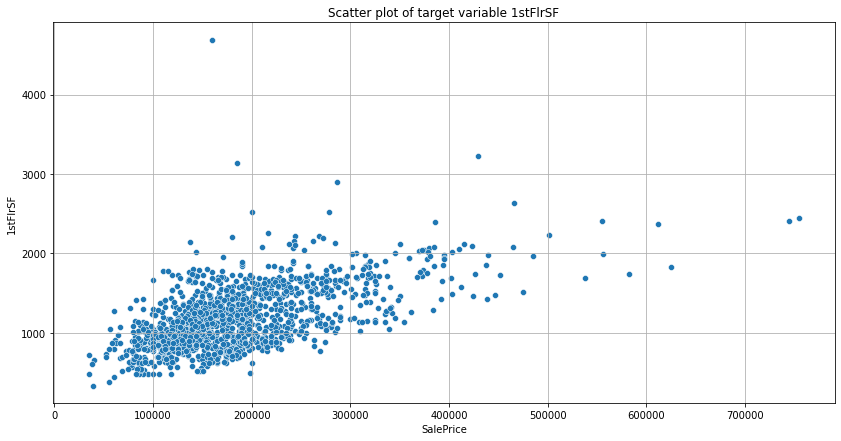

************************************************************


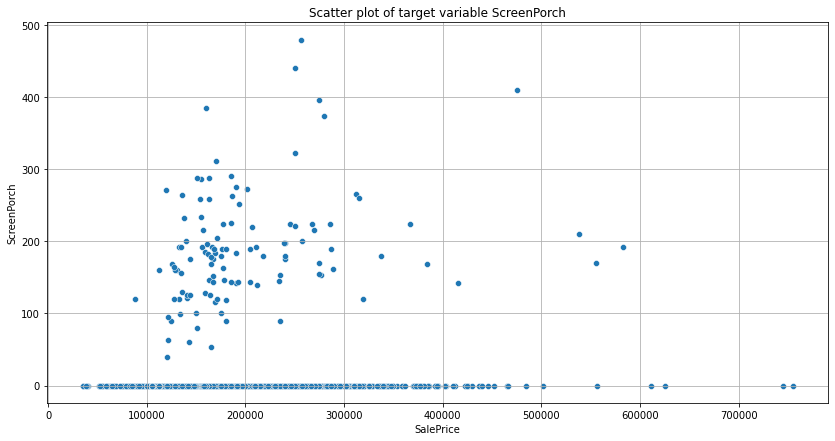

************************************************************


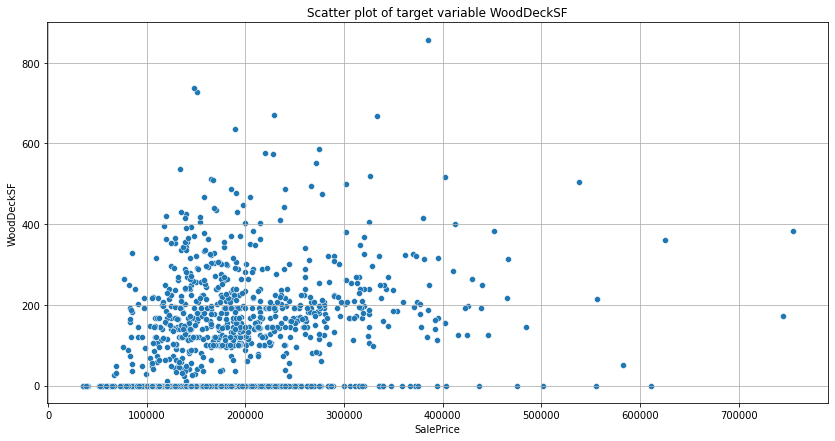

************************************************************


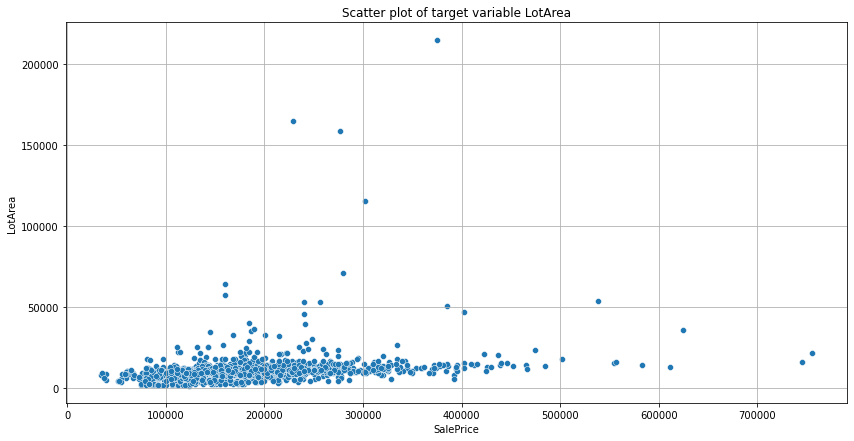

************************************************************


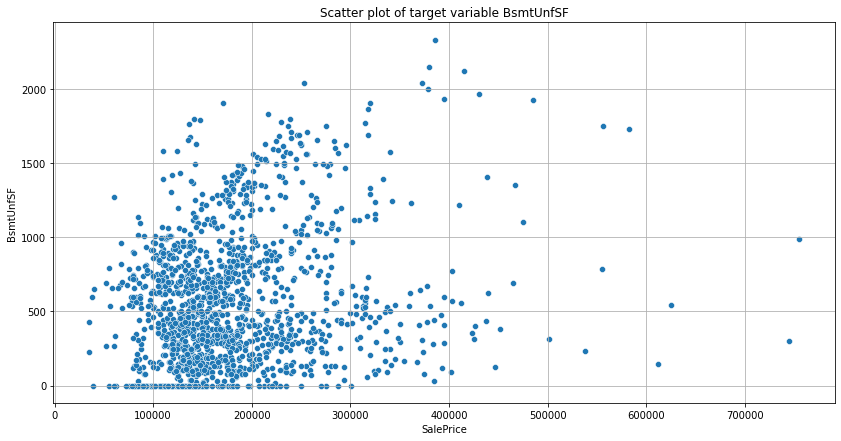

************************************************************


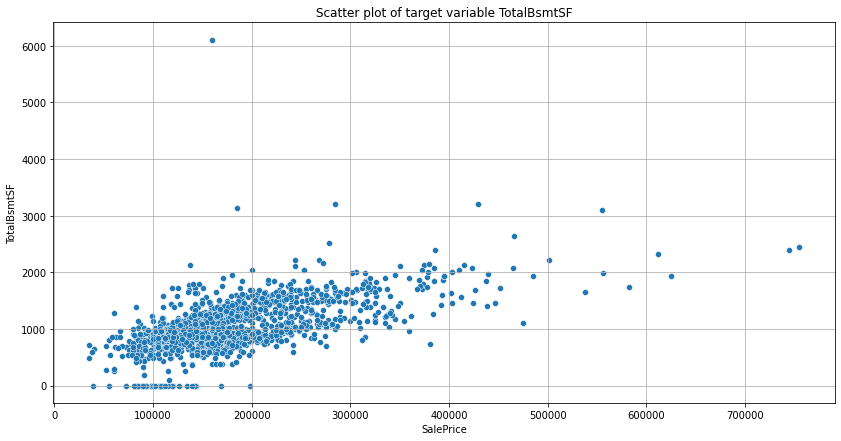

************************************************************


In [ ]:
for i in cont_variable3:
  fig = plt.figure(figsize=(14,7))
  sns.scatterplot(data=df_train, x= target_variable3, y=i).set_title("Scatter plot of target variable" " "+i)
  plt.grid()
  plt.show()
  print("**"*30)

# 3.2.e. Scatter plot in between two variables

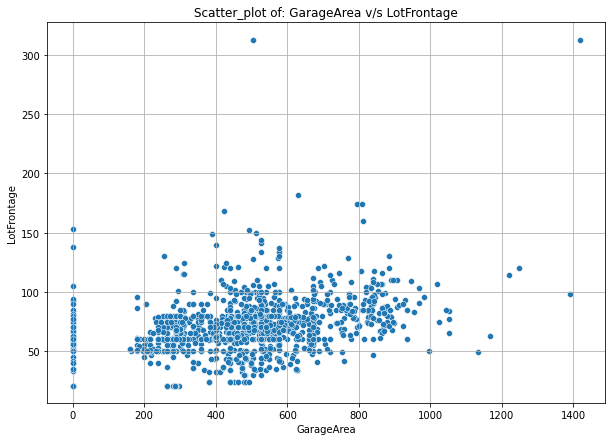

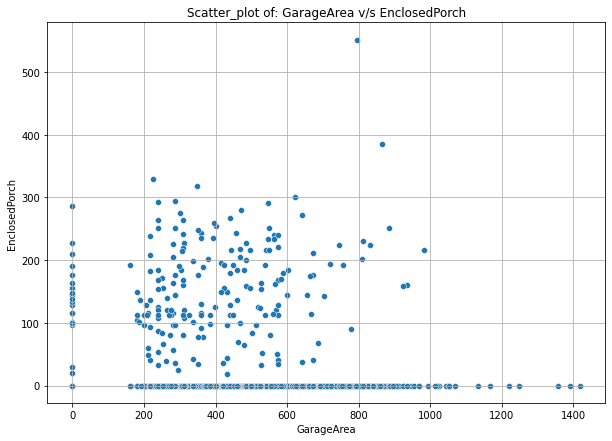

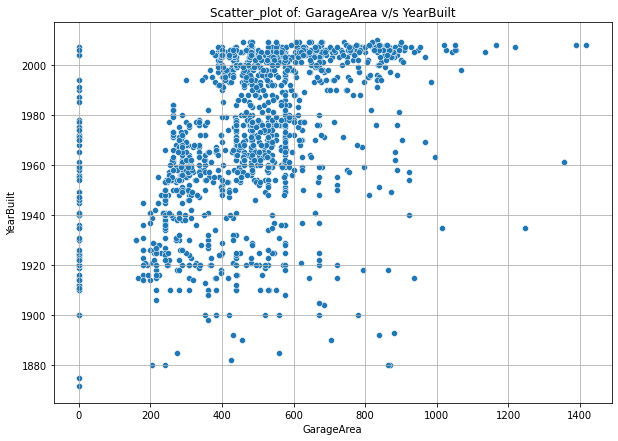

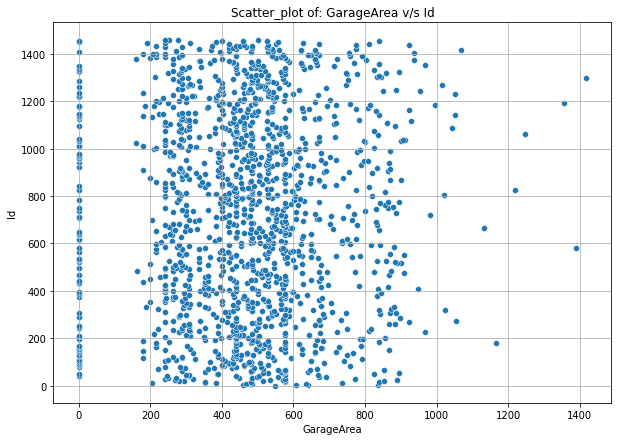

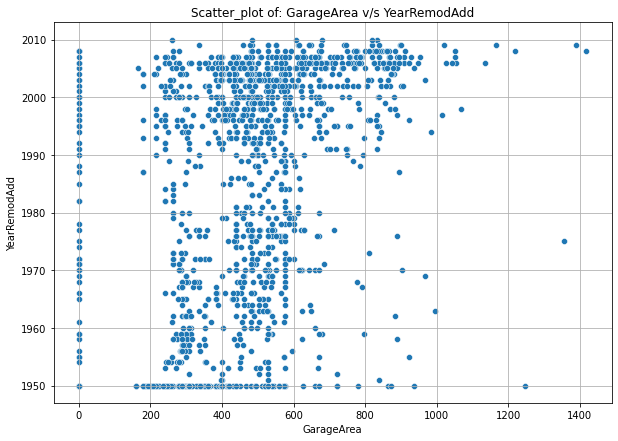

...

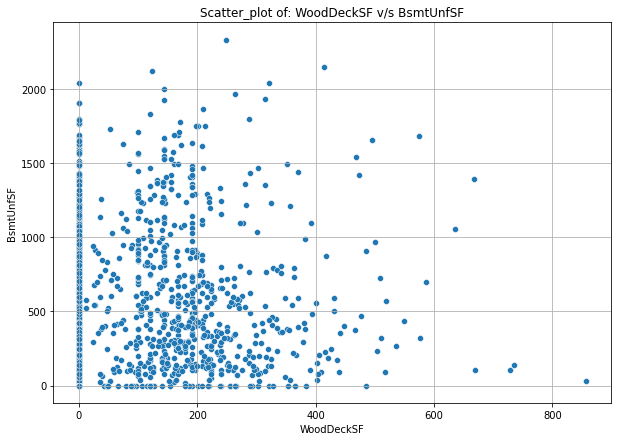

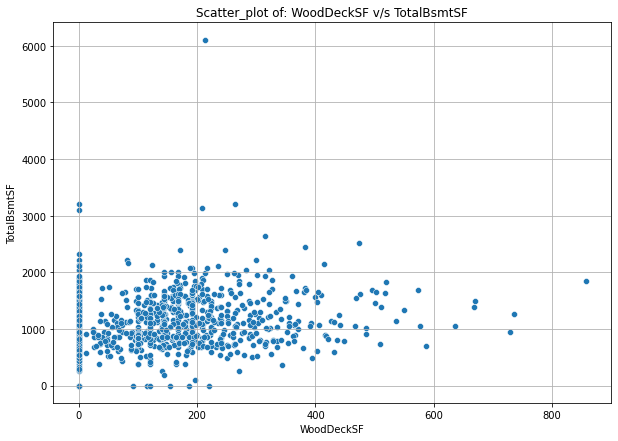

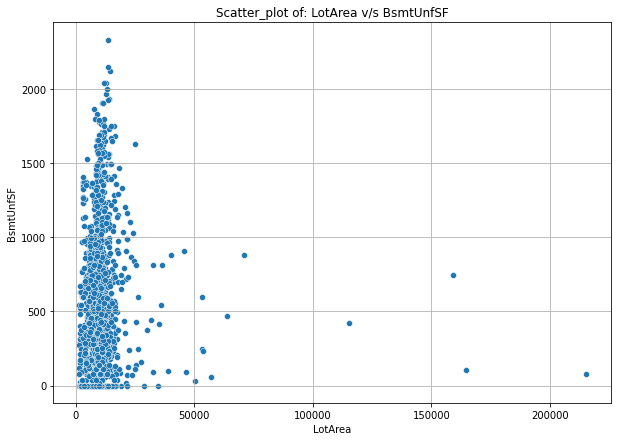

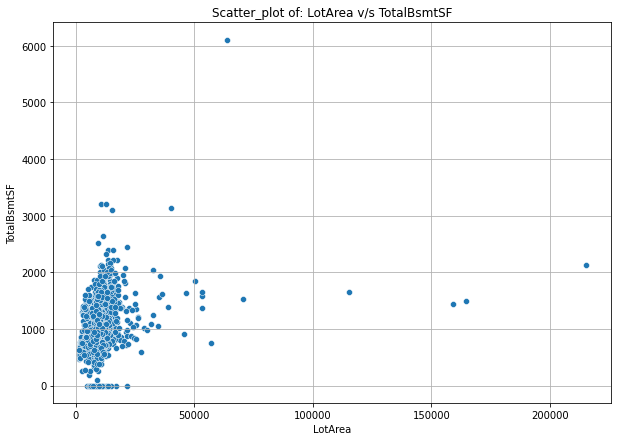

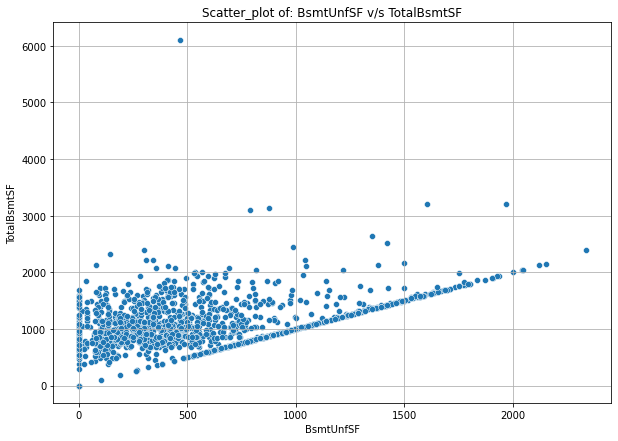

In [42]:
a = cont_variable3
while len(a)>1:
  lx = a
  c = lx.copy()
  c.pop(0)
  for b in c:
    fig=plt.figure(figsize=(10,7))
    sns.scatterplot(x=a[0],y=b,data=df_train).set_title("Scatter_plot of: "+str(a[0])+" v/s "+str(b))
    plt.grid(True)
    plt.show()
    print("=="*45)
  c.pop(0)
  a.pop(0)

## 3.2.f. Scatter plot in between continous & categorical variables

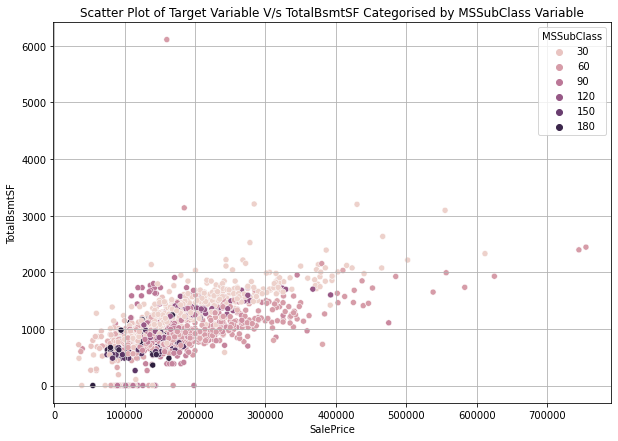

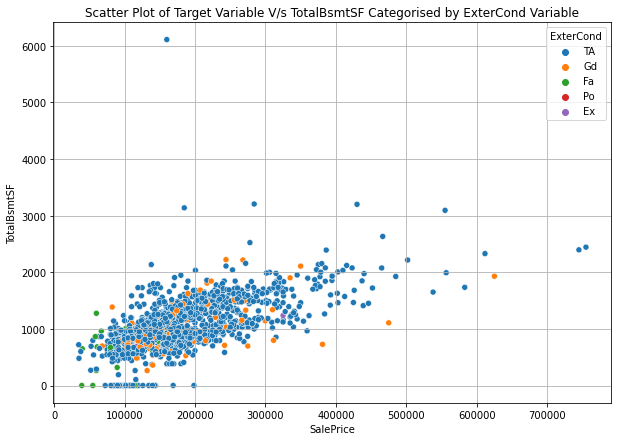

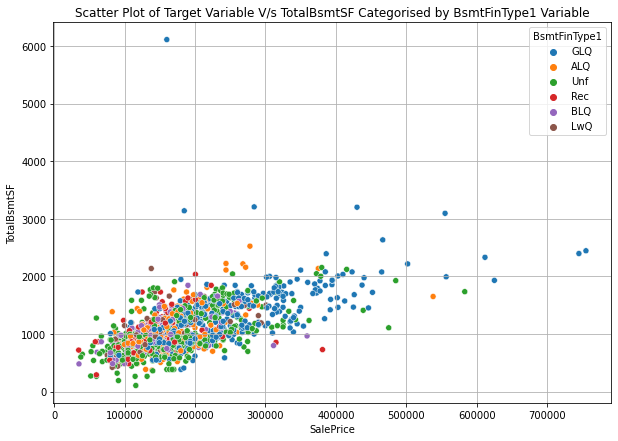

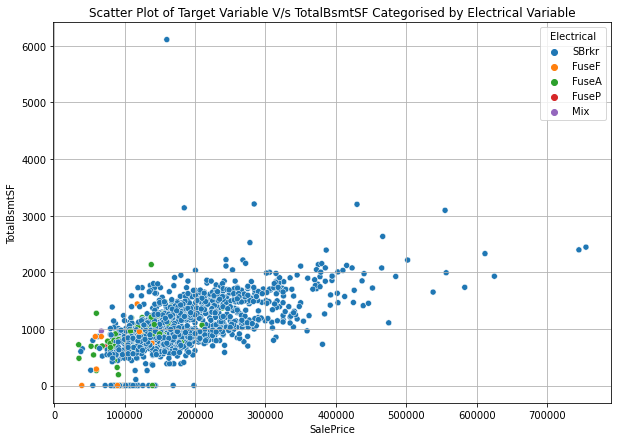

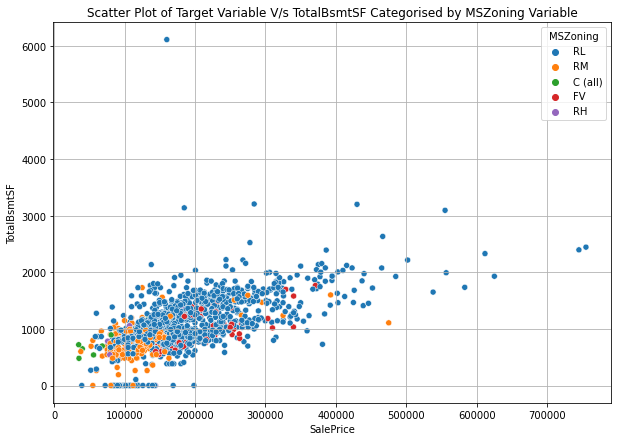

...

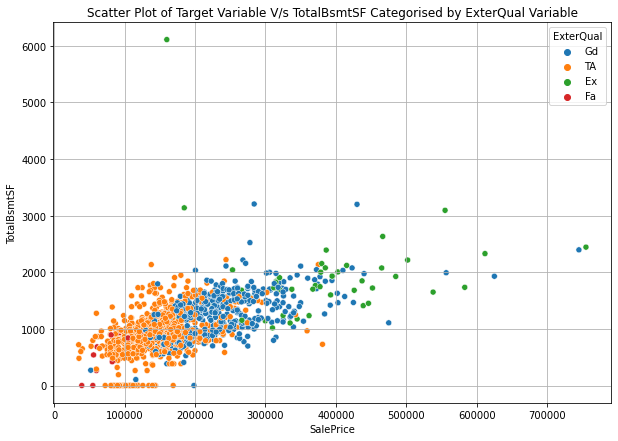

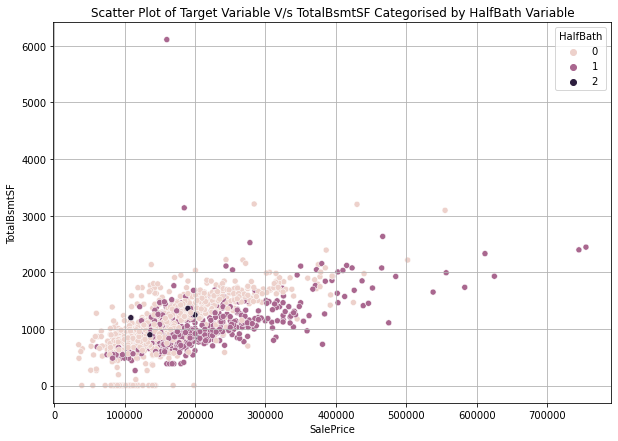

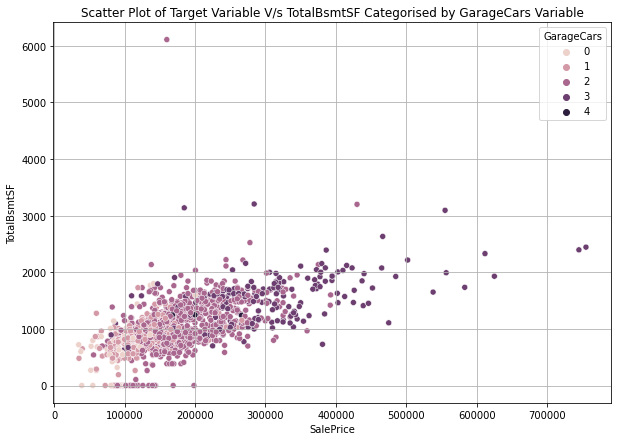

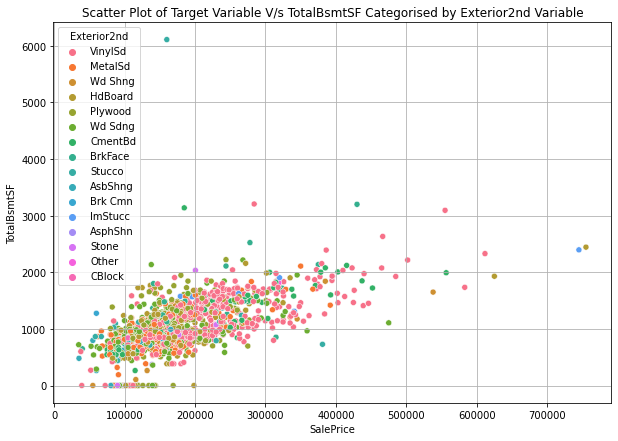

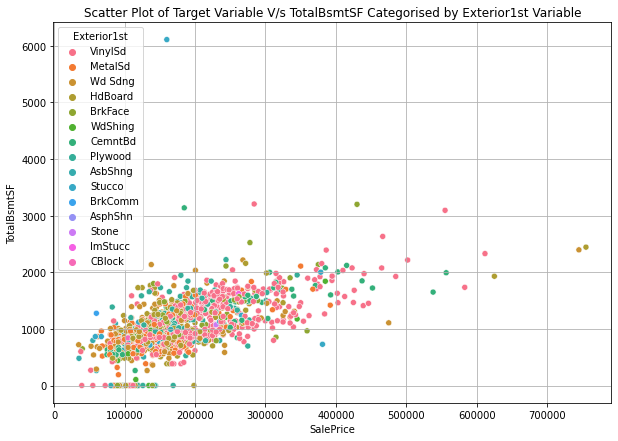

In [43]:
for i in cont_variable3:
  for j in dis_variable3:
    fig=plt.figure(figsize=(10,7))
    sns.scatterplot(x=target_variable3,y=i,data=df_train,hue=j).set_title("Scatter Plot of Target Variable V/s "+i+" Categorised by "+j+" Variable")
    plt.grid()
    plt.show()
    print("=="*50)

# 3.3 Multivariate Analysis

In [ ]:
# for i in cont_variable3:
#   fig = plt.figure(figsize=(10,7))
#   sns.pairplot(data=df_train, x=i )
#   plt.show()
#   print("**"*25)

# Correlation with heatmap in continous variable

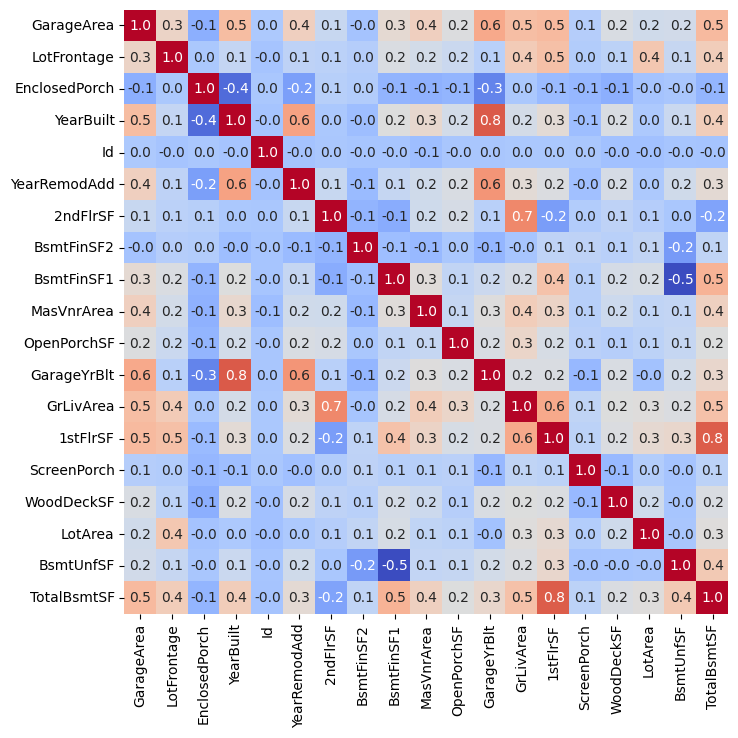

In [ ]:
#correlation
plt.figure(figsize=(8,8), dpi=100)
sns.heatmap(df_train[cont_variable3].corr(),annot=True, fmt='.1f', cmap='coolwarm',square=True, cbar=False )
plt.show()



In [ ]:
# #Multicollinearity
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# def calc_vif(X):

#     # Calculating VIF
#     vif = pd.DataFrame()
#     vif["variables"] = X.columns
#     vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

#     return(vif)


In [ ]:
import pandas as pd
import numpy as np
corr01_,corr01_08_,corr08_05_,corr05_00_,corr00,corr_00_05,corr_05_08,corr_08_01,corr_01=[],[],[],[],[],[],[],[],[]
l1,l2,l3,l4,l5,l6,l7,l8,l9=[],[],[],[],[],[],[],[],[]
for num,i in enumerate(df_train[cont_variable3].corr().index):
  for j in df_train[cont_variable3].corr().columns[0:num+1]:
    if float(df_train[cont_variable3].corr()[i][j])==-1.0:
      l1.append(j)      
    if -1<float(df_train[cont_variable3].corr()[i][j])<=-0.8:
      l2.append(j)        
    if -0.8<float(df_train[cont_variable3].corr()[i][j])<=-0.5:
      l3.append(j)        
    if -0.5<float(df_train[cont_variable3].corr()[i][j])<-0.0:
      l4.append(j)       
    if float(df_train[cont_variable3].corr()[i][j])==0.0:
      l5.append(j)        
    if 0.0<float(df_train[cont_variable3].corr()[i][j])<0.5:
      l6.append(j)        
    if 0.5<float(df_train[cont_variable3].corr()[i][j])<0.8:
      l7.append(j)        
    if 0.8<float(df_train[cont_variable3].corr()[i][j])<1.0:
      l8.append(j)        
    if float(df_train[cont_variable3].corr()[i][j])==1.0: 
      l9.append(j)
  l1x,l2x,l3x,l4x,l5x,l6x,l7x,l8x,l9x=l1.copy(),l2.copy(),l3.copy(),l4.copy(),l5.copy(),l6.copy(),l7.copy(),l8.copy(),l9.copy()
  if len(l1x)==0:
    corr01_.append(np.nan)
  else:
    corr01_.append(l1x)
  if len(l2x)==0:
    corr01_08_.append(np.nan)
  else:
    corr01_08_.append(l2x)    
  if len(l3x)==0:
    corr08_05_.append(np.nan)
  else:
    corr08_05_.append(l3x)
  if len(l4x)==0:
    corr05_00_.append(np.nan)
  else:
    corr05_00_.append(l4x) 
  if len(l5x)==0:
    corr00.append(np.nan)
  else:
    corr00.append(l5x)
  if len(l6x)==0:
    corr_00_05.append(np.nan)
  else:
    corr_00_05.append(l6x)
  if len(l7x)==0:
    corr_05_08.append(np.nan)
  else:
    corr_05_08.append(l7x)
  if len(l8x)==0:
    corr_08_01.append(np.nan)
  else:
    corr_08_01.append(l8x)
  if len(l9x)==0:
    corr_01.append(np.nan)
  else:
    corr_01.append(l9x)
        
  l9.clear()
  l8.clear()
  l7.clear()
  l6.clear()
  l5.clear()
  l4.clear()
  l3.clear()
  l2.clear()
  l1.clear()


corr_report = pd.DataFrame({"corr[SN]":corr01_,
                           "corr[GN]":corr01_08_,
                           "corr[MN]":corr08_05_,
                           "corr[WN]":corr05_00_,
                           "corr[ZERO]":corr00,
                           "corr[WP]":corr_00_05,
                           "corr[MP]":corr_05_08,
                           "corr[GP]":corr_08_01,
                           "corr[SP]":corr_01},index=df_train[cont_variable3].corr().index)
corr_report

,corr[SN],corr[GN],corr[MN],corr[WN],corr[ZERO],corr[WP],corr[MP],corr[GP],corr[SP]
GarageArea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[GarageArea]
LotFrontage,NaN,NaN,NaN,NaN,NaN,[GarageArea],NaN,NaN,[LotFrontage]
EnclosedPorch,NaN,NaN,NaN,[GarageArea],NaN,[LotFrontage],NaN,NaN,[EnclosedPorch]
YearBuilt,NaN,NaN,NaN,[EnclosedPorch],NaN,"[GarageArea, LotFrontage]",NaN,NaN,[YearBuilt]
Id,NaN,NaN,NaN,"[LotFrontage, YearBuilt]",NaN,"[GarageArea, EnclosedPorch]",NaN,NaN,[Id]
YearRemodAdd,NaN,NaN,NaN,"[EnclosedPorch, Id]",NaN,"[GarageArea, LotFrontage]",[YearBuilt],NaN,[YearRemodAdd]
2ndFlrSF,NaN,NaN,NaN,NaN,NaN,"[GarageArea, LotFrontage, EnclosedPorch, YearB...",NaN,NaN,[2ndFlrSF]
BsmtFinSF2,NaN,NaN,NaN,"[GarageArea, YearBuilt, Id, YearRemodAdd, 2ndF...",NaN,"[LotFrontage, EnclosedPorch]",NaN,NaN,[BsmtFinSF2]
BsmtFinSF1,NaN,NaN,NaN,"[EnclosedPorch, Id, 2ndFlrSF, BsmtFinSF2]",NaN,"[GarageArea, LotFrontage, YearBuilt, YearRemod...",NaN,NaN,[BsmtFinSF1]
MasVnrArea,NaN,NaN,NaN,"[EnclosedPorch, Id, BsmtFinSF2]",NaN,"[GarageArea, LotFrontage, YearBuilt, YearRemod...",NaN,NaN,[MasVnrArea]


#PART-4. FEATURE ENGINEERING

# 4.1. Encoding for Train data

In [ ]:
df_train['ExterCond']=df_train['ExterCond'].map({"Po":0,"Fa":1,"Gd":2,"Ex":3,"TA":4})
df_train['BsmtFinType1']=df_train['BsmtFinType1'].map({"NA":0,"LwQ":1,"BLQ":2,"Rec":3,"ALQ":4,"Unf":5,"GLQ":6})
df_train['Electrical']=df_train['Electrical'].map({"Mix":0,"FuseP":1,"FuseF":2,"FuseA":3,"SBrkr":4})
df_train['MSZoning']=df_train['MSZoning'].map({"C (all)":0,"RM":1,"RH":2,"RL":3,"FV":4})  #(A)- Agriculture- NA, (I)- Industrial- NA, (RP)- Residential Low Density Park- N             
df_train['LotShape']=df_train['LotShape'].map({"Reg":0,"IR1":1,"IR3":2,"IR2":3})
df_train['GarageCond']=df_train['GarageCond'].map({"NA":0,"Po":1,"Fa":2,"Ex":3,"Gd":4,"TA":5})
df_train['SaleCondition']=df_train['SaleCondition'].map({"AdjLand":0,"Abnorml":1,"Family":2,"Alloca":3,"Normal":4,"Partial":5})
df_train['GarageType']=df_train['GarageType'].map({"CarPort":0,"Detchd":1,"Basment":3,"2Types":2,"Attchd":4,"BuiltIn":5})   #(NA)- No Garage-?
df_train['GarageFinish']=df_train['GarageFinish'].map({"NA":0,"Unf":1,"RFn":2,"Fin":3})
df_train['GarageQual']=df_train['GarageQual'].map({"NA":0,"Po":1,"Fa":2,"Ex":3,"Gd":5,"TA":4})             
df_train['LandContour']=df_train['LandContour'].map({"Bnk":0,"Lvl":1,"Low":2,"HLS":3})                  
df_train['BsmtExposure']=df_train['BsmtExposure'].map({"No":1,"Mn":2,"Av":3,"Gd":4})
df_train['Functional']=df_train['Functional'].map({"Maj2":0,"Sev":1,"Mod":2,"Min2":3,"Min1":4,"Maj1":5,"Typ":6})                            # (Sal)- Salvage only-
df_train['RoofMatl']=df_train['RoofMatl'].map({"Roll":0,"ClyTile":1,"CompShg":2,"Metal":3,"Tar&Grv":4,"Membran":5,"WdShake":6, "WdShngl":7})
df_train['Condition1']=df_train['Condition1'].map({"Artery":0,"Feedr":1,"RRAe":2,"Norm":3,"RRAn":4,"RRNe":5,"PosN":6,"PosA":7,"RRNn":8})
df_train['BsmtCond']=df_train['BsmtCond'].map({"Po":0,"Fa":1,"TA":2,"Gd":3})                   # (NA)-  No Basement- NA, (Ex) Excellent- NA 
df_train['CentralAir']=df_train['CentralAir'].map({"N":0,"Y":1})
df_train['Foundation']=df_train['Foundation'].map({'Slab':0,"Stone":1,"BrkTil":2,"CBlock":3,"Wood":4,"PConc":5})
df_train['BsmtFinType2']=df_train['BsmtFinType2'].map({"NA":0,"BLQ":1,"Rec":2,"LwQ":3,"Unf":4,"ALQ":5,"GLQ":6})
df_train['HouseStyle']=df_train['HouseStyle'].map({"1.5Unf":0,"1.5Fin":1,"2.5Unf":2,"SFoyer":3,"1Story":4,"SLvl":5,"2Story":6,"2.5Fin":7})
df_train['Street']=df_train['Street'].map({"Grvl":0,"Pave":1})
df_train['KitchenQual']=df_train['KitchenQual'].map({"Po":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})
df_train['BsmtQual']=df_train['BsmtQual'].map({"NA":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})         #(Po)-  Poor (<70 inches-NA
df_train['HeatingQC']=df_train['HeatingQC'].map({"Po":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})
df_train['BldgType']=df_train['BldgType'].map({"2FmCon":0,"Duplx":1,"TwnhsI":2,"1Fam":3,"Twnhs":4})
df_train['Condition2']=df_train['Condition2'].map({"RRNn":0,"Artery":1,"Feedr":2,"RRAn":3,"Norm":4,"RRAe":5,"PosN":6,"PosA":7})  #(RRNe)- Within 200' of East-West Railroad-NA 
df_train['MasVnrType']=df_train['MasVnrType'].map({"BrkCmn":0,"None":1,"BrkFace":2,"Stone":3})       #(Cblock)- Cinder Block- NA                
df_train['RoofStyle']=df_train['RoofStyle'].map({"Gambrel":0,"Gable":1,"Mansard":2,"Flat":3,"Hip":4,"Shed":5})
df_train['SaleType']=df_train['SaleType'].map({"Oth":0,"ConLD":1,"COD":2,"ConLw":3,"WD":4,"ConLI":5,"CWD":6, "Con":7,"New":8})  # (VWD)- Warranty Deed - VA Loan- NA
df_train['Utilities']=df_train['Utilities'].map({"NoSewr":0,"AllPub":1})    #(NoSeWa) Electricity and Gas Only- NA, (ELO) Electric- NA
df_train['LandSlope']=df_train['LandSlope'].map({"Gtl":0,"Mod":1,"Sev":2})
df_train['LotConfig']=df_train['LotConfig'].map({"Inside":0,"FR2":1,"Corner":2,"FR3":3,"CulDSac":4})                   
df_train['PavedDrive']=df_train['PavedDrive'].map({"N":0,"P":1,"Y":2})
df_train['Neighborhood']=df_train['Neighborhood'].map({"MeadowV":0,"IDOTRR":1,"BrDale":2,"BrkSide":3,"Edwards":4,"OldTown":5,"Blueste":6,"Sawyer":7,"SWISU":8,"NPkVill":9,
                              "NAmes":10,"Mitchel":11,"SawyerW":12,"NWAmes":13,"Gilbert":14,"Blmngtn":15,"CollgCr":16,"Crawfor":17,"ClearCr":18,
                              "Somerst":19,"Veenker":20,"Timber":21,"StoneBr":22,"NoRidge":23,"NridgHt":24})                  
df_train['Heating']=df_train['Heating'].map({"Floor":0,"Grav":1,"Wall":2,"OthW":3,"GasW":4,"GasA":5})
df_train['ExterQual']=df_train['ExterQual'].map({"Fa":0,"TA":1,"Gd":2,"Ex":3})      #(Po)- Poor-NA                  
df_train['Exterior2nd']=df_train['Exterior2nd'].map({"CBlock":0,"AsbShng":1,"Brk Cmn":2,"AsphShn":3,"Wd Sdng":4,"MetalSd":5,"Stucco":6,"Stone":7,"WdShing":8,"HdBoard":9,
                              "Plywood":10,"BrkFace":11,"VinylSd":12,"CemntBd":13,"ImStucc":14,"Other":15})        
df_train['Exterior1st']=df_train['Exterior1st'].map({"BrkComm":0 ,"AsphShn":1,"CBlock":2,"AsbShng":3,"WdShing":4,"Wd Sdng":5,"MetalSd":6,"Stucco":7,"HdBoard":8,
                        "Plywood":9,"BrkFace":10,"VinylSd":11,"CemntBd":12,"Stone":13,"ImStucc":14})

#4.2. Encoding for test data

In [ ]:
df_test['ExterCond']=df_test['ExterCond'].map({"Po":0,"Fa":1,"Gd":2,"Ex":3,"TA":4})
df_test['BsmtFinType1']=df_test['BsmtFinType1'].map({"NA":0,"LwQ":1,"BLQ":2,"Rec":3,"ALQ":4,"Unf":5,"GLQ":6})
df_test['Electrical']=df_test['Electrical'].map({"Mix":0,"FuseP":1,"FuseF":2,"FuseA":3,"SBrkr":4})
df_test['MSZoning']=df_test['MSZoning'].map({"C (all)":0,"RM":1,"RH":2,"RL":3,"FV":4})  #(A)- Agriculture- NA, (I)- Industrial- NA, (RP)- Residential Low Density Park- N             
df_test['LotShape']=df_test['LotShape'].map({"Reg":0,"IR1":1,"IR3":2,"IR2":3})
df_test['GarageCond']=df_test['GarageCond'].map({"NA":0,"Po":1,"Fa":2,"Ex":3,"Gd":4,"TA":5})
df_test['SaleCondition']=df_test['SaleCondition'].map({"AdjLand":0,"Abnorml":1,"Family":2,"Alloca":3,"Normal":4,"Partial":5})
df_test['GarageType']=df_test['GarageType'].map({"CarPort":0,"Detchd":1,"Basment":3,"2Types":2,"Attchd":4,"BuiltIn":5})   #(NA)- No Garage-?
df_test['GarageFinish']=df_test['GarageFinish'].map({"NA":0,"Unf":1,"RFn":2,"Fin":3})
df_test['GarageQual']=df_test['GarageQual'].map({"NA":0,"Po":1,"Fa":2,"Ex":3,"Gd":5,"TA":4})             
df_test['LandContour']=df_test['LandContour'].map({"Bnk":0,"Lvl":1,"Low":2,"HLS":3})                  
df_test['BsmtExposure']=df_test['BsmtExposure'].map({"No":1,"Mn":2,"Av":3,"Gd":4})
df_test['Functional']=df_test['Functional'].map({"Maj2":0,"Sev":1,"Mod":2,"Min2":3,"Min1":4,"Maj1":5,"Typ":6})                            # (Sal)- Salvage only-
df_test['RoofMatl']=df_test['RoofMatl'].map({"Roll":0,"ClyTile":1,"CompShg":2,"Metal":3,"Tar&Grv":4,"Membran":5,"WdShake":6, "WdShngl":7})
df_test['Condition1']=df_test['Condition1'].map({"Artery":0,"Feedr":1,"RRAe":2,"Norm":3,"RRAn":4,"RRNe":5,"PosN":6,"PosA":7,"RRNn":8})
df_test['BsmtCond']=df_test['BsmtCond'].map({"Po":0,"Fa":1,"TA":2,"Gd":3})                   # (NA)-  No Basement- NA, (Ex) Excellent- NA 
df_test['CentralAir']=df_test['CentralAir'].map({"N":0,"Y":1})
df_test['Foundation']=df_test['Foundation'].map({'Slab':0,"Stone":1,"BrkTil":2,"CBlock":3,"Wood":4,"PConc":5})
df_test['BsmtFinType2']=df_test['BsmtFinType2'].map({"NA":0,"BLQ":1,"Rec":2,"LwQ":3,"Unf":4,"ALQ":5,"GLQ":6})
df_test['HouseStyle']=df_test['HouseStyle'].map({"1.5Unf":0,"1.5Fin":1,"2.5Unf":2,"SFoyer":3,"1Story":4,"SLvl":5,"2Story":6,"2.5Fin":7})
df_test['Street']=df_test['Street'].map({"Grvl":0,"Pave":1})
df_test['KitchenQual']=df_test['KitchenQual'].map({"Po":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})
df_test['BsmtQual']=df_test['BsmtQual'].map({"NA":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})         #(Po)-  Poor (<70 inches-NA
df_test['HeatingQC']=df_test['HeatingQC'].map({"Po":0,"Fa":1,"TA":2,"Gd":3,"Ex":4})
df_test['BldgType']=df_test['BldgType'].map({"2FmCon":0,"Duplx":1,"TwnhsI":2,"1Fam":3,"Twnhs":4})
df_test['Condition2']=df_test['Condition2'].map({"RRNn":0,"Artery":1,"Feedr":2,"RRAn":3,"Norm":4,"RRAe":5,"PosN":6,"PosA":7})  #(RRNe)- Within 200' of East-West Railroad-NA 
df_test['MasVnrType']=df_test['MasVnrType'].map({"BrkCmn":0,"None":1,"BrkFace":2,"Stone":3})       #(Cblock)- Cinder Block- NA                
df_test['RoofStyle']=df_test['RoofStyle'].map({"Gambrel":0,"Gable":1,"Mansard":2,"Flat":3,"Hip":4,"Shed":5})
df_test['SaleType']=df_test['SaleType'].map({"Oth":0,"ConLD":1,"COD":2,"ConLw":3,"WD":4,"ConLI":5,"CWD":6, "Con":7,"New":8})  # (VWD)- Warranty Deed - VA Loan- NA
df_test['Utilities']=df_test['Utilities'].map({"NoSewr":0,"AllPub":1})    #(NoSeWa) Electricity and Gas Only- NA, (ELO) Electric- NA
df_test['LandSlope']=df_test['LandSlope'].map({"Gtl":0,"Mod":1,"Sev":2})
df_test['LotConfig']=df_test['LotConfig'].map({"Inside":0,"FR2":1,"Corner":2,"FR3":3,"CulDSac":4})                   
df_test['PavedDrive']=df_test['PavedDrive'].map({"N":0,"P":1,"Y":2})
df_test['Neighborhood']=df_test['Neighborhood'].map({"MeadowV":0,"IDOTRR":1,"BrDale":2,"BrkSide":3,"Edwards":4,"OldTown":5,"Blueste":6,"Sawyer":7,"SWISU":8,"NPkVill":9,
                              "NAmes":10,"Mitchel":11,"SawyerW":12,"NWAmes":13,"Gilbert":14,"Blmngtn":15,"CollgCr":16,"Crawfor":17,"ClearCr":18,
                              "Somerst":19,"Veenker":20,"Timber":21,"StoneBr":22,"NoRidge":23,"NridgHt":24})                  
df_test['Heating']=df_test['Heating'].map({"Floor":0,"Grav":1,"Wall":2,"OthW":3,"GasW":4,"GasA":5})
df_test['ExterQual']=df_test['ExterQual'].map({"Fa":0,"TA":1,"Gd":2,"Ex":3})      #(Po)- Poor-NA                  
df_test['Exterior2nd']=df_test['Exterior2nd'].map({"CBlock":0,"AsbShng":1,"Brk Cmn":2,"AsphShn":3,"Wd Sdng":4,"MetalSd":5,"Stucco":6,"Stone":7,"WdShing":8,"HdBoard":9,
                              "Plywood":10,"BrkFace":11,"VinylSd":12,"CemntBd":13,"ImStucc":14,"Other":15})        
df_test['Exterior1st']=df_test['Exterior1st'].map({"BrkComm":0 ,"AsphShn":1,"CBlock":2,"AsbShng":3,"WdShing":4,"Wd Sdng":5,"MetalSd":6,"Stucco":7,"HdBoard":8,
                        "Plywood":9,"BrkFace":10,"VinylSd":11,"CemntBd":12,"Stone":13,"ImStucc":14})

#Now checking all categorical variable changed into numeric variable.

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Neighborhood   1460 non-null   int64  
 1   LotConfig      1460 non-null   int64  
 2   PoolArea       1460 non-null   int64  
 3   Utilities      1459 non-null   float64
 4   TotalBsmtSF    1460 non-null   int64  
 5   GarageQual     1379 non-null   float64
 6   KitchenQual    1460 non-null   int64  
 7   BsmtFinType2   1422 non-null   float64
 8   ExterQual      1460 non-null   int64  
 9   BsmtUnfSF      1460 non-null   int64  
 10  SaleType       1460 non-null   int64  
 11  GarageYrBlt    1379 non-null   float64
 12  SaleCondition  1460 non-null   int64  
 13  LotFrontage    1201 non-null   float64
 14  YearRemodAdd   1460 non-null   int64  
 15  ExterCond      1460 non-null   int64  
 16  RoofMatl       1460 non-null   int64  
 17  MiscVal        1460 non-null   int64  
 18  BsmtFinS

In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Neighborhood   1459 non-null   int64  
 1   LotConfig      1459 non-null   int64  
 2   PoolArea       1459 non-null   int64  
 3   Utilities      1457 non-null   float64
 4   TotalBsmtSF    1458 non-null   float64
 5   GarageQual     1381 non-null   float64
 6   KitchenQual    1458 non-null   float64
 7   BsmtFinType2   1417 non-null   float64
 8   ExterQual      1459 non-null   int64  
 9   BsmtUnfSF      1458 non-null   float64
 10  SaleType       1458 non-null   float64
 11  GarageYrBlt    1381 non-null   float64
 12  SaleCondition  1459 non-null   int64  
 13  LotFrontage    1232 non-null   float64
 14  YearRemodAdd   1459 non-null   int64  
 15  ExterCond      1459 non-null   int64  
 16  RoofMatl       1459 non-null   int64  
 17  MiscVal        1459 non-null   int64  
 18  BsmtFinS

#Now dealing with null values replacing with mean, median and mode.

In [ ]:
#Checking the all features having null value in percentage format for test data
print("Null percentage existance in features in train data")
print("***************************************************")
for i in df_train.columns:
  if round((df_train[i].isna().sum()/len(df_train[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_train[i].isna().sum()/len(df_train[i]))*100,3), "%")

Null percentage existance in features in train data
***************************************************
Utilities : 	 0.068 %
GarageQual : 	 5.548 %
BsmtFinType2 : 	 2.603 %
GarageYrBlt : 	 5.548 %
LotFrontage : 	 17.74 %
BsmtExposure : 	 2.603 %
MasVnrType : 	 0.548 %
Exterior2nd : 	 6.712 %
BldgType : 	 13.493 %
Electrical : 	 0.068 %
MasVnrArea : 	 0.548 %
GarageType : 	 5.548 %
GarageFinish : 	 5.548 %
BsmtFinType1 : 	 2.534 %
BsmtCond : 	 2.534 %
BsmtQual : 	 2.534 %
GarageCond : 	 5.548 %


In [ ]:
#Checking the all features having null value in percentage format for test data
print("Null percentage existance in features in train data")
print("***************************************************")
for i in df_test.columns:
  if round((df_test[i].isna().sum()/len(df_test[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_test[i].isna().sum()/len(df_test[i]))*100,3), "%")

Null percentage existance in features in train data
***************************************************
Utilities : 	 0.137 %
TotalBsmtSF : 	 0.069 %
GarageQual : 	 5.346 %
KitchenQual : 	 0.069 %
BsmtFinType2 : 	 2.879 %
BsmtUnfSF : 	 0.069 %
SaleType : 	 0.069 %
GarageYrBlt : 	 5.346 %
LotFrontage : 	 15.559 %
BsmtFinSF1 : 	 0.069 %
BsmtExposure : 	 3.016 %
MSZoning : 	 0.274 %
GarageCars : 	 0.069 %
BsmtFinSF2 : 	 0.069 %
MasVnrType : 	 1.097 %
Exterior2nd : 	 7.539 %
BldgType : 	 13.777 %
MasVnrArea : 	 1.028 %
GarageType : 	 5.209 %
BsmtFullBath : 	 0.137 %
BsmtHalfBath : 	 0.137 %
GarageFinish : 	 5.346 %
BsmtFinType1 : 	 2.879 %
BsmtCond : 	 3.084 %
Functional : 	 0.137 %
Exterior1st : 	 0.069 %
BsmtQual : 	 3.016 %
GarageArea : 	 0.069 %
GarageCond : 	 5.346 %


In [ ]:
#Checking the all features having null value in percentage format
print("Null percentage existance in Continous features")
print("*************************************")
for i in df_train[cont_variable3].columns:
  if round((df_train[i].isna().sum()/len(df_train[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_train[i].isna().sum()/len(df_train[i]))*100,3), "%")

Null percentage existance in Continous features
*************************************
LotFrontage : 	 17.74 %
MasVnrArea : 	 0.548 %
GarageYrBlt : 	 5.548 %


In [ ]:
#Checking the all features having null value in percentage format
print("Null percentage existance in Discrete features")
print("*************************************")
for i in df_train[dis_variable3].columns:
  if round((df_train[i].isna().sum()/len(df_train[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_train[i].isna().sum()/len(df_train[i]))*100,3), "%")

Null percentage existance in Discrete features
*************************************
BsmtFinType1 : 	 2.534 %
Electrical : 	 0.068 %
GarageCond : 	 5.548 %
GarageType : 	 5.548 %
GarageFinish : 	 5.548 %
GarageQual : 	 5.548 %
BsmtExposure : 	 2.603 %
BsmtCond : 	 2.534 %
BsmtFinType2 : 	 2.603 %
BsmtQual : 	 2.534 %
BldgType : 	 13.493 %
MasVnrType : 	 0.548 %
Utilities : 	 0.068 %
Exterior2nd : 	 6.712 %


In [ ]:
#Checking the all features having null value in percentage format
print("Null percentage existance in Continous features")
print("***********************************************")
for i in df_test[cont_variable2].columns:
  if round((df_test[i].isna().sum()/len(df_test[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_test[i].isna().sum()/len(df_test[i]))*100,3), "%")

Null percentage existance in Continous features
***********************************************
MasVnrArea : 	 1.028 %
LotFrontage : 	 15.559 %
GarageArea : 	 0.069 %
BsmtUnfSF : 	 0.069 %
TotalBsmtSF : 	 0.069 %
GarageYrBlt : 	 5.346 %
BsmtFinSF2 : 	 0.069 %
BsmtFinSF1 : 	 0.069 %


In [ ]:
#Checking the all features having null value in percentage format
print("Null percentage existance in Discrete features")
print("**********************************************")
for i in df_test[dis_variable2].columns:
  if round((df_test[i].isna().sum()/len(df_test[i]))*100,3)>0.00:
    print(i,":", "\t",round((df_test[i].isna().sum()/len(df_test[i]))*100,3), "%")

Null percentage existance in Discrete features
**********************************************
MasVnrType : 	 1.097 %
BldgType : 	 13.777 %
KitchenQual : 	 0.069 %
BsmtFullBath : 	 0.137 %
GarageType : 	 5.209 %
Functional : 	 0.137 %
SaleType : 	 0.069 %
GarageCars : 	 0.069 %
BsmtExposure : 	 3.016 %
BsmtQual : 	 3.016 %
Exterior2nd : 	 7.539 %
GarageFinish : 	 5.346 %
Utilities : 	 0.137 %
BsmtHalfBath : 	 0.137 %
Exterior1st : 	 0.069 %
GarageCond : 	 5.346 %
BsmtCond : 	 3.084 %
GarageQual : 	 5.346 %
BsmtFinType1 : 	 2.879 %
BsmtFinType2 : 	 2.879 %
MSZoning : 	 0.274 %


In [ ]:
#Null values filling with median on continous variables
df_train["LotFrontage"].fillna(df_train["LotFrontage"].median(), inplace = True)
df_train["MasVnrArea"].fillna(df_train["MasVnrArea"].median(), inplace = True)
df_train["GarageYrBlt"].fillna(df_train["GarageYrBlt"].median(), inplace = True)

In [ ]:
#Null values filling with mode on discrete variables
df_train["BsmtFinType1"].fillna(5, inplace = True)
df_train["Electrical"].fillna(4, inplace = True)
df_train["GarageCond"].fillna(5, inplace = True)
df_train["GarageType"].fillna(4, inplace = True)
df_train["GarageFinish"].fillna(1, inplace = True)
df_train["GarageQual"].fillna(4, inplace = True)
df_train["BsmtExposure"].fillna(1, inplace = True)
df_train["BsmtCond"].fillna(2, inplace = True)
df_train["BsmtFinType2"].fillna(4, inplace = True)
df_train["BsmtQual"].fillna(2, inplace = True)
df_train["BldgType"].fillna(3, inplace = True)
df_train["MasVnrType"].fillna(1, inplace = True)
df_train["Utilities"].fillna(1, inplace = True)
df_train["Exterior2nd"].fillna(12, inplace = True)

In [ ]:
#Null values filling with median on continous variables
df_test["MasVnrArea"].fillna(df_test["LotFrontage"].median(), inplace = True)
df_test["LotFrontage"].fillna(df_test["LotFrontage"].median(), inplace = True)
df_test["GarageArea"].fillna(df_test["GarageArea"].median(), inplace = True)
df_test["BsmtUnfSF"].fillna(df_test["BsmtUnfSF"].median(), inplace = True)
df_test["TotalBsmtSF"].fillna(df_test["TotalBsmtSF"].median(), inplace = True)
df_test["GarageYrBlt"].fillna(df_test["GarageYrBlt"].median(), inplace = True)
df_test["BsmtFinSF2"].fillna(df_test["BsmtFinSF2"].median(), inplace = True)
df_test["BsmtFinSF1"].fillna(df_test["BsmtFinSF1"].median(), inplace = True)

In [ ]:
#Null values filling with mode on discrete variables
df_test["MasVnrType"].fillna(1, inplace = True)
df_test["BldgType"].fillna(3, inplace = True)
df_test["KitchenQual"].fillna(2, inplace = True)
df_test["BsmtFullBath"].fillna(0, inplace = True)
df_test["GarageType"].fillna(4, inplace = True)
df_test["Functional"].fillna(6, inplace = True)
df_test["SaleType"].fillna(4, inplace = True)
df_test["GarageCars"].fillna(2, inplace = True)
df_test["BsmtExposure"].fillna(1, inplace = True)
df_test["BsmtQual"].fillna(2, inplace = True)
df_test["Exterior2nd"].fillna(12, inplace = True)
df_test["GarageFinish"].fillna(1, inplace = True)
df_test["Utilities"].fillna(1, inplace = True)
df_test["BsmtHalfBath"].fillna(0, inplace = True)
df_test["Exterior1st"].fillna(11, inplace = True)
df_test["GarageCond"].fillna(5, inplace = True)
df_test["BsmtCond"].fillna(2, inplace = True)
df_test["GarageQual"].fillna(4, inplace = True)
df_test["BsmtFinType1"].fillna(5, inplace = True)
df_test["BsmtFinType2"].fillna(4, inplace = True)
df_test["MSZoning"].fillna(3, inplace = True)


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Neighborhood   1460 non-null   int64  
 1   LotConfig      1460 non-null   int64  
 2   PoolArea       1460 non-null   int64  
 3   Utilities      1460 non-null   float64
 4   TotalBsmtSF    1460 non-null   int64  
 5   GarageQual     1460 non-null   float64
 6   KitchenQual    1460 non-null   int64  
 7   BsmtFinType2   1460 non-null   float64
 8   ExterQual      1460 non-null   int64  
 9   BsmtUnfSF      1460 non-null   int64  
 10  SaleType       1460 non-null   int64  
 11  GarageYrBlt    1460 non-null   float64
 12  SaleCondition  1460 non-null   int64  
 13  LotFrontage    1460 non-null   float64
 14  YearRemodAdd   1460 non-null   int64  
 15  ExterCond      1460 non-null   int64  
 16  RoofMatl       1460 non-null   int64  
 17  MiscVal        1460 non-null   int64  
 18  BsmtFinS

In [ ]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Neighborhood   1459 non-null   int64  
 1   LotConfig      1459 non-null   int64  
 2   PoolArea       1459 non-null   int64  
 3   Utilities      1459 non-null   float64
 4   TotalBsmtSF    1459 non-null   float64
 5   GarageQual     1459 non-null   float64
 6   KitchenQual    1459 non-null   float64
 7   BsmtFinType2   1459 non-null   float64
 8   ExterQual      1459 non-null   int64  
 9   BsmtUnfSF      1459 non-null   float64
 10  SaleType       1459 non-null   float64
 11  GarageYrBlt    1459 non-null   float64
 12  SaleCondition  1459 non-null   int64  
 13  LotFrontage    1459 non-null   float64
 14  YearRemodAdd   1459 non-null   int64  
 15  ExterCond      1459 non-null   int64  
 16  RoofMatl       1459 non-null   int64  
 17  MiscVal        1459 non-null   int64  
 18  BsmtFinS

# Now above having no null is existing in train & test data set.

In [ ]:
'''for i in cont_variable3:
  if df_train[i].isna().sum()>0:
    df_train[i].fillna(df[i].median(),inplace=True)'''


'for i in cont_variable3:\n  if df_train[i].isna().sum()>0:\n    df_train[i].fillna(df[i].median(),inplace=True)'

#4.3. Replace with upper and lower limit by using Winsorizer

In [ ]:
pip install feature_engine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Dealing with outliers:



In [ ]:
continious_data_lower=['YearBuilt']
continious_data_upper=['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF',
                       '1stFlrSF','2ndFlrSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch']
continious_data_upper_lower = ['TotalBsmtSF'] 

##Left side outlier

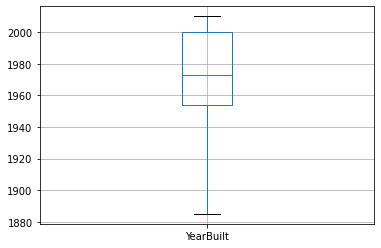

In [ ]:
from feature_engine.outliers import Winsorizer
lower = Winsorizer(capping_method = 'iqr', tail = "left", fold = 1.5, variables=['YearBuilt'])
df_train[["YearBuilt"]]=lower.fit_transform(df_train[["YearBuilt"]])
df_train[["YearBuilt"]].boxplot()

##Right side outlier

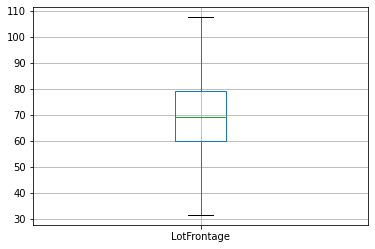

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['LotFrontage'])
df_train[['LotFrontage']]=upper.fit_transform(df_train[['LotFrontage']])
df_train[['LotFrontage']].boxplot()

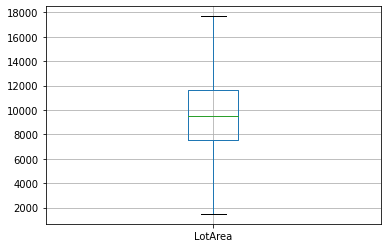

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['LotArea'])
df_train[['LotArea']]=upper.fit_transform(df_train[['LotArea']])
df_train[['LotArea']].boxplot()

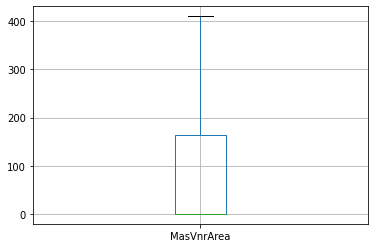

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['MasVnrArea'])
df_train[['MasVnrArea']]=upper.fit_transform(df_train[['MasVnrArea']])
df_train[['MasVnrArea']].boxplot()

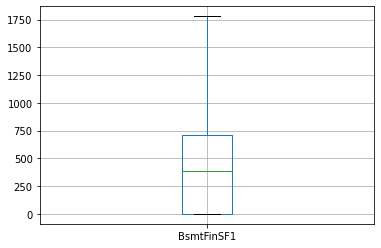

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['BsmtFinSF1'])
df_train[['BsmtFinSF1']]=upper.fit_transform(df_train[['BsmtFinSF1']])
df_train[['BsmtFinSF1']].boxplot()

In [ ]:
#from feature_engine.outliers import Winsorizer
#upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['BsmtFinSF2'])
#df_train[['BsmtFinSF2']]=upper.fit_transform(df_train[['BsmtFinSF2']])
#df_train[['BsmtFinSF2']].boxplot()

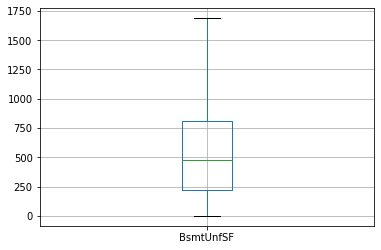

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['BsmtUnfSF'])
df_train[['BsmtUnfSF']]=upper.fit_transform(df_train[['BsmtUnfSF']])
df_train[['BsmtUnfSF']].boxplot()

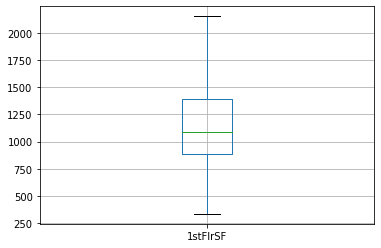

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['1stFlrSF'])
df_train[['1stFlrSF']]=upper.fit_transform(df_train[['1stFlrSF']])
df_train[['1stFlrSF']].boxplot()

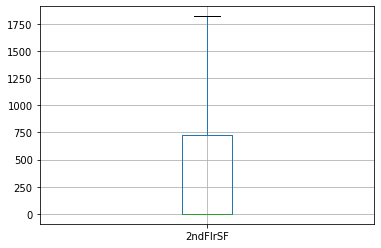

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['2ndFlrSF'])
df_train[['2ndFlrSF']]=upper.fit_transform(df_train[['2ndFlrSF']])
df_train[['2ndFlrSF']].boxplot()

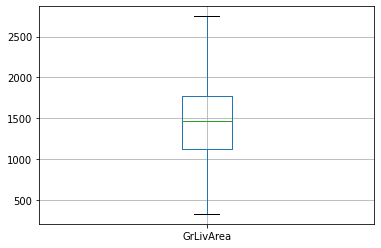

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['GrLivArea'])
df_train[['GrLivArea']]=upper.fit_transform(df_train[['GrLivArea']])
df_train[['GrLivArea']].boxplot()

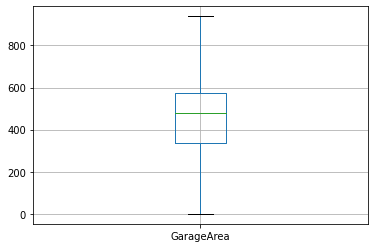

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['GarageArea'])
df_train[['GarageArea']]=upper.fit_transform(df_train[['GarageArea']])
df_train[['GarageArea']].boxplot()

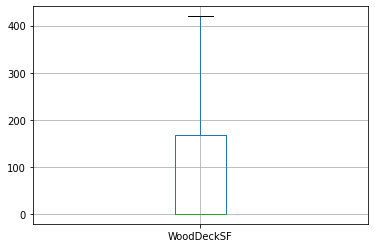

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "right", fold = 1.5, variables=['WoodDeckSF'])
df_train[['WoodDeckSF']]=upper.fit_transform(df_train[['WoodDeckSF']])
df_train[['WoodDeckSF']].boxplot()

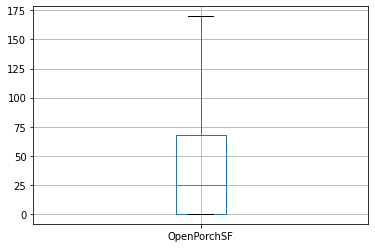

In [ ]:
from feature_engine.outliers import Winsorizer
upper = Winsorizer(capping_method = 'iqr', tail = "right", fold = 1.5, variables=['OpenPorchSF'])
df_train[['OpenPorchSF']]=upper.fit_transform(df_train[['OpenPorchSF']])
df_train[['OpenPorchSF']].boxplot()

In [ ]:
#from feature_engine.outliers import Winsorizer
#upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['EnclosedPorch'])
#df_train[['EnclosedPorch']]=upper.fit_transform(df_train[['EnclosedPorch']])
#df_train[['EnclosedPorch']].boxplot()

In [ ]:
# from feature_engine.outliers import Winsorizer
# upper = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['ScreenPorch'])
# df_train[['ScreenPorch']]=upper.fit_transform(df_train[['ScreenPorch']])
# df_train[['ScreenPorch']].boxplot()

##Both side outlier

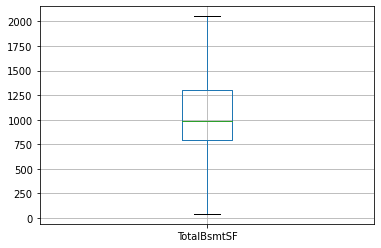

In [ ]:
from feature_engine.outliers import Winsorizer
lower = Winsorizer(capping_method = 'iqr', tail = "both", fold = 1.5, variables=['TotalBsmtSF'])
df_train[['TotalBsmtSF']]=lower.fit_transform(df_train[['TotalBsmtSF']])
df_train[['TotalBsmtSF']].boxplot()

#PART-5. DATA WRANGLING

#5.1. Dealing with Skewness

##If right skewed- nth root or log(x).

##if left skewed- nth power or exp.

In [ ]:
df_train['LotFrontage'] = (df_train['LotFrontage']+1).transform(np.log)

In [ ]:
df_train['LotArea'] = (df_train['LotArea']+1).transform(np.log)

In [ ]:
df_train['MasVnrArea'] = (df_train['MasVnrArea']+1).transform(np.log)

In [ ]:
df_train['BsmtFinSF1'] = (df_train['BsmtFinSF1']+1).transform(np.log)

In [ ]:
df_train['BsmtFinSF2'] = (df_train['BsmtFinSF2']+1).transform(np.log)

In [ ]:
df_train['TotalBsmtSF'] = (df_train['TotalBsmtSF']+1).transform(np.log)

In [ ]:
df_train['1stFlrSF'] = (df_train['1stFlrSF']+1).transform(np.log)

In [ ]:
df_train['GrLivArea'] = (df_train['GrLivArea']+1).transform(np.log)

In [ ]:
df_train['WoodDeckSF'] = (df_train['WoodDeckSF']+1).transform(np.log)

In [ ]:
df_train['OpenPorchSF'] = (df_train['OpenPorchSF']+1).transform(np.log)

In [ ]:
df_train['EnclosedPorch'] = (df_train['EnclosedPorch']+1).transform(np.log)

In [ ]:
df_train['ScreenPorch'] = (df_train['ScreenPorch']+1).transform(np.log)

In [ ]:
df_train.head()

,Neighborhood,LotConfig,PoolArea,Utilities,TotalBsmtSF,GarageQual,KitchenQual,BsmtFinType2,ExterQual,BsmtUnfSF,...,Foundation,Heating,KitchenAbvGr,GarageArea,GarageCond,BedroomAbvGr,EnclosedPorch,PavedDrive,LotArea,HeatingQC
0,16,0,0,1.0,6.753438,4.0,3,4.0,2,150.0,...,5,5,1,548.0,5.0,3,0.000000,2,2.306780,4
1,20,1,0,1.0,7.141245,4.0,2,4.0,1,284.0,...,3,5,1,460.0,5.0,3,0.000000,2,2.319405,4
2,16,0,0,1.0,6.825460,4.0,3,4.0,2,434.0,...,5,5,1,608.0,5.0,3,0.000000,2,2.334879,4
3,17,2,0,1.0,6.629363,4.0,3,4.0,1,540.0,...,2,5,1,642.0,5.0,3,5.609472,2,2.318892,3
4,23,1,0,1.0,7.044033,4.0,3,4.0,2,490.0,...,5,5,1,836.0,5.0,4,0.000000,2,2.357574,4


# Drop some features which is not important

In [ ]:
df_train.drop(columns=["BsmtFinSF2", "EnclosedPorch","ScreenPorch", "Id"], inplace =True)


In [ ]:
df_test.drop(columns=["BsmtFinSF2", "EnclosedPorch","ScreenPorch", "Id"], inplace =True)

In [ ]:
df_train.shape

(1460, 72)

In [ ]:
df_test.shape

(1459, 71)

In [ ]:
df_train.describe()

,Neighborhood,LotConfig,PoolArea,Utilities,TotalBsmtSF,GarageQual,KitchenQual,BsmtFinType2,ExterQual,BsmtUnfSF,...,Street,Foundation,Heating,KitchenAbvGr,GarageArea,GarageCond,BedroomAbvGr,PavedDrive,LotArea,HeatingQC
count,1460.000000,1460.000000,1460.000000,1460.0,1460.000000,1460.000000,1460.000000,1460.000000,1460.00000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,12.047945,0.658219,2.758904,1.0,6.842851,3.935616,2.511644,3.858904,1.39589,563.777740,...,0.995890,3.730822,4.954110,1.046575,470.670719,4.900000,2.866438,1.856164,2.310218,3.145205
std,6.427678,1.172699,40.177307,0.0,0.606889,0.396997,0.663760,0.643912,0.57428,431.710214,...,0.063996,1.227180,0.366452,0.220338,207.105729,0.542505,0.815778,0.496592,0.046942,0.959501
min,0.000000,0.000000,0.000000,1.0,3.761200,1.000000,1.000000,1.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.116434,0.000000
25%,7.000000,0.000000,0.000000,1.0,6.680541,4.000000,2.000000,4.000000,1.00000,223.000000,...,1.000000,3.000000,5.000000,1.000000,334.500000,5.000000,2.000000,2.000000,2.295550,2.000000
50%,12.000000,0.000000,0.000000,1.0,6.900227,4.000000,2.000000,4.000000,1.00000,477.500000,...,1.000000,3.000000,5.000000,1.000000,480.000000,5.000000,3.000000,2.000000,2.318152,4.000000
75%,16.000000,1.000000,0.000000,1.0,7.169542,4.000000,3.000000,4.000000,2.00000,808.000000,...,1.000000,5.000000,5.000000,1.000000,576.000000,5.000000,3.000000,2.000000,2.337853,4.000000
max,24.000000,4.000000,738.000000,1.0,7.627057,5.000000,4.000000,6.000000,3.00000,1685.500000,...,1.000000,5.000000,5.000000,3.000000,938.250000,5.000000,8.000000,2.000000,2.377681,4.000000


# Checking VIF

In [ ]:
"""#scaling the numeric data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(df_train.select_dtypes(
    include = ["int64", "float64"]).drop("SalePrice", axis = 1))

X = pd.DataFrame(X, columns = list(df_train.select_dtypes(
    include = ["int64", "float64"]).drop("SalePrice", axis = 1)))"""

'#scaling the numeric data\nfrom sklearn.preprocessing import StandardScaler\nscaler = StandardScaler()\nX = scaler.fit_transform(df_train.select_dtypes(\n    include = ["int64", "float64"]).drop("SalePrice", axis = 1))\n\nX = pd.DataFrame(X, columns = list(df_train.select_dtypes(\n    include = ["int64", "float64"]).drop("SalePrice", axis = 1)))'

In [ ]:
"""from statsmodels.stats.outliers_influence import variance_inflation_factor
  
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]
  
vif_data"""

'from statsmodels.stats.outliers_influence import variance_inflation_factor\n  \n# VIF dataframe\nvif_data = pd.DataFrame()\nvif_data["feature"] = X.columns\n  \n# calculating VIF for each feature\nvif_data["VIF"] = [variance_inflation_factor(X.values, i)\n                          for i in range(len(X.columns))]\n  \nvif_data'

In [ ]:
"""vif_data[vif_data["VIF"]>10]["feature"]"""

'vif_data[vif_data["VIF"]>10]["feature"]'

In [ ]:
df_train.drop(columns=['1stFlrSF','2ndFlrSF','GrLivArea',"YrSold","GarageYrBlt"], inplace =True)

In [ ]:
df_test.drop(columns=['1stFlrSF','2ndFlrSF','GrLivArea',"YrSold","GarageYrBlt"], inplace =True)

In [ ]:
df_train.shape

(1460, 67)

In [ ]:
df_test.shape

(1459, 66)

#PART-6 MACHINE LEARNING MODEL

# All Regression models

# Based Model without parametertunning

In [ ]:
X = df_train.drop(columns = "SalePrice")
y = df_train["SalePrice"]

In [ ]:
from sklearn.preprocessing import StandardScaler
sc  = StandardScaler()
X = sc.fit_transform(X)

In [ ]:
def Regression_Report(X,y):
    import pandas as pd
    from sklearn.linear_model import LinearRegression
    from sklearn.linear_model import Ridge
    from sklearn.linear_model import Lasso
    from sklearn.linear_model import ElasticNetCV
    from sklearn.neighbors import KNeighborsRegressor
    from sklearn.svm import SVR
    from sklearn.tree import DecisionTreeRegressor
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.ensemble import AdaBoostRegressor
    from sklearn.ensemble import GradientBoostingRegressor
    from xgboost import XGBRegressor
    from sklearn.model_selection import cross_val_score
    from sklearn.metrics import mean_absolute_error,mean_squared_error
    from sklearn.model_selection import train_test_split
    Algorithms=[LinearRegression(),
          Ridge(),
          Lasso(),
          ElasticNetCV(),
          KNeighborsRegressor(),
          SVR(),
          DecisionTreeRegressor(),
          RandomForestRegressor(),
          AdaBoostRegressor(),
          GradientBoostingRegressor(),
          XGBRegressor()] # Plugin Algorithm in a list
    MODEL1,TRAIN_ACC,VALID_ACC,TRAIN_MAE,VALID_MAE,TRAIN_RMSE,VALID_RMSE,CV=[],[],[],[],[],[],[],[]
    for i in Algorithms: #model_fit
      X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.2,random_state=7)
      model = i.fit(X_train,y_train)
      train_pred = model.predict(X_train) #from here it will predict the line
      valid_pred=model.predict(X_valid) #from here it will predict the line
      train_acc=model.score(X_train,y_train) #from here im getting the score
      valid_acc=model.score(X_valid,y_valid) #from here im getting the score

      #lets add all data for data frame
      MODEL1.append(str(i))
      TRAIN_ACC.append(round(train_acc,3)) #model train score
      VALID_ACC.append(round(valid_acc,3)) #model valid score

      #Mean absolute error
      TRAIN_MAE.append(round(mean_absolute_error(y_train,train_pred),3))
      VALID_MAE.append(round(mean_absolute_error(y_valid,valid_pred),3))

      #root mean square error of both test and train data and prediction data
      TRAIN_RMSE.append(round(np.sqrt(mean_squared_error(y_train,train_pred)),3))
      VALID_RMSE.append(round(np.sqrt(mean_squared_error(y_valid,valid_pred)),3))

      #cv value find
      CV.append(round((cross_val_score(model,X,y,cv=5)).mean(),3))
    #converting all data into a dataFrame
    data={"MODEL":MODEL1,"TRAIN_ACC":TRAIN_ACC,"VALID_ACC":VALID_ACC,"CV":CV,
        "TRAIN_RMSE":TRAIN_RMSE,"VALID_RMSE":VALID_RMSE,
        "TRAIN_MAE":TRAIN_MAE,"VALID_MAE":VALID_MAE}
    data=pd.DataFrame(data)
    train_score_data=['TRAIN_ACC','CV']
    test_score_data=['VALID_ACC','VALID_ACC']   
    for j in range(len(train_score_data)):
        temp=[]
        for i in range(len(data['TRAIN_ACC'])):
            if (data[train_score_data[j]][i])*0.975 <= data[test_score_data[j]][i] <= (data[train_score_data[j]][i])*1.025:
                if train_score_data[j]=='CV':
                    temp.append("Good_Model")
                else:
                    temp.append("Good_Model")
            elif (data[train_score_data[j]][i])*0.975 > data[test_score_data[j]][i]:
                if train_score_data[j]=='CV':
                    temp.append("Bad_model")
                else:
                    temp.append("UF_Model")
            else:
                if train_score_data[j]=='CV':
                    temp.append("Bad_model")
                else:
                    temp.append("OF_Model")
        data[train_score_data[j]+"_perform"]=temp
    temp1=[]
    # For Train RMSE & Validation RMSE
    for i in range(len(data["TRAIN_RMSE"])):
        if data["TRAIN_RMSE"][i]*0.975<=data["VALID_RMSE"][i]<=data["TRAIN_RMSE"][i]*1.025:
            temp1.append("Good_Model")
        elif data["TRAIN_RMSE"][i]*0.975>data["VALID_RMSE"][i]:
            temp1.append("UF_Model")
        elif data["TRAIN_RMSE"][i]*1.025<data["VALID_ACC"][i]:
            temp1.append("OF_Model")
        else:
            temp1.append('Good_model')
    data["T/V_RMSE_COMP"]=temp1
    final_perform=[]
    for i in range(len(data['TRAIN_RMSE'])):
        if data['TRAIN_ACC_perform'][i]=='Good_Model' and data['T/V_RMSE_COMP'][i]=='Good_Model' and data['CV_perform'][i]=='Good_Model':
            final_perform.append('Good_Model')
        else:
            final_perform.append('Bad_Model')
    data['OVER_ALL']=final_perform
    data.rename(columns = {'TRAIN_ACC_perform':'T/V_ACC_COMP','CV_perform':'CV/V_COMP'}, inplace = True)
    return data

In [ ]:
k = Regression_Report(X,y)
k

[21:02:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


,MODEL,TRAIN_ACC,VALID_ACC,CV,TRAIN_RMSE,VALID_RMSE,TRAIN_MAE,VALID_MAE,T/V_ACC_COMP,CV/V_COMP,T/V_RMSE_COMP,OVER_ALL
0,LinearRegression(),0.832,0.816,0.810,31895.681,36495.865,21161.980,22818.840,Good_Model,Good_Model,Good_model,Bad_Model
1,Ridge(),0.832,0.816,0.810,31895.684,36483.042,21155.353,22808.567,Good_Model,Good_Model,Good_model,Bad_Model
2,Lasso(),0.832,0.816,0.810,31895.651,36487.075,21159.911,22812.073,Good_Model,Good_Model,Good_model,Bad_Model
3,ElasticNetCV(),0.208,0.190,0.201,69339.727,76545.831,48739.512,53763.919,UF_Model,Bad_model,Good_model,Bad_Model
4,KNeighborsRegressor(),0.820,0.655,0.742,33030.311,49958.665,19325.619,26090.454,UF_Model,Bad_model,Good_model,Bad_Model
5,SVR(),-0.046,-0.066,-0.051,79666.126,87815.070,54442.692,59662.267,UF_Model,Bad_model,Good_model,Bad_Model
6,DecisionTreeRegressor(),1.000,0.704,0.661,0.000,46229.453,0.000,29956.298,UF_Model,Bad_model,OF_Model,Bad_Model
7,RandomForestRegressor(),0.978,0.887,0.845,11639.942,28615.085,6995.340,18593.560,UF_Model,Bad_model,Good_model,Bad_Model
8,AdaBoostRegressor(),0.857,0.824,0.810,29476.771,35649.779,23234.910,25117.319,UF_Model,Good_Model,Good_model,Bad_Model
9,GradientBoostingRegressor(),0.965,0.894,0.877,14626.634,27653.018,10868.393,17886.391,UF_Model,Good_Model,Good_model,Bad_Model


In [ ]:
def Grid(X_train,y_train):
  import warnings
  warnings.filterwarnings("ignore")
  import pandas as pd
  from sklearn.linear_model import LinearRegression
  from sklearn.linear_model import Ridge
  from sklearn.linear_model import Lasso
  from sklearn.linear_model import ElasticNetCV
  from sklearn.neighbors import KNeighborsRegressor
  from sklearn.svm import SVR
  from sklearn.tree import DecisionTreeRegressor
  from sklearn.ensemble import RandomForestRegressor
  from sklearn.ensemble import AdaBoostRegressor
  from sklearn.ensemble import GradientBoostingRegressor
  from xgboost import XGBRegressor
  from sklearn.model_selection import GridSearchCV
  model = []
  best_param = []
  estimator = [LinearRegression(),Ridge(),Lasso(),ElasticNetCV(),
               KNeighborsRegressor(),SVR(),DecisionTreeRegressor(),RandomForestRegressor(),
               AdaBoostRegressor(),GradientBoostingRegressor(),XGBRegressor()]
  param_grid = [{"fit_intercept":[True,False],
                 "normalize":[False,True],
                 "copy_X":[True,False],
                 "n_jobs":[-1],
                 "positive":[False,True]},
                {"alpha":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                 "fit_intercept":[True,False],
                 "normalize":[False,True],
                 "copy_X":[True,False],
                 "max_iter":[20000],
                 "tol":[1e-3],
                 "solver":['auto'],
                 "positive":[False,True],
                 "random_state":[None]},
                {"alpha":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                 "fit_intercept":[True,False],
                 "normalize":[False,True],
                 "max_iter":[20000],
                 "tol":[1e-3],
                 "warm_start":[False,True],
                 "positive":[False,True],
                 "selection":['random']},
                {"l1_ratio":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                 "eps":[1e-3],
                 "n_alphas":[100],
                 "fit_intercept":[True,False],
                 "normalize":[False,True],
                 "max_iter":[20000],
                 "tol":[1e-4],
                 "cv":[5],
                 "n_jobs":[-1],
                 "copy_X":[True,False],
                 "positive":[False,True],
                 "selection":['random'],
                 "random_state":[0]},
                {"n_neighbors":[5,6,7,8,9,10],
                 "weights":['uniform', 'distance'],
                 "algorithm":['auto'],
                 "n_jobs":[-1]},
                {"kernel":['linear', 'poly', 'rbf', 'sigmoid'],
                 "degree":[3,4,5],
                 "gamma":['scale', 'auto'],
                 "C":[0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
                 "shrinking":[True,False]},
                {"criterion":["squared_error", "friedman_mse","poisson"],
                 "max_depth":[2,3,4,5,6,7,8,9,10],
                 "max_features":["auto"]},
                {"n_estimators":[200],
                 "criterion":["squared_error", "friedman_mse","poisson"],
                 "max_depth":[2,3,4,5,6,7,8,9,10],
                 "max_features":["auto"],
                 "bootstrap":[True,False],
                 "oob_score":[False,True],
                 "n_jobs":[-1]},
                {"n_estimators":[200],
                 "learning_rate":[0.2,0.4,0.6,0.8,1]},
                {"learning_rate":[0.2,0.4,0.6,0.8,1],
                 "n_estimators":[200],
                 "criterion":['friedman_mse', 'squared_error', 'mse'],
                 "max_depth":[2,3,4,5,6,7,8,9,10]},
                {"max_depth":[2,3,4,5,6,7,8,9,10],
                 "n_estimators":[200],
                 "n_jobs":[-1]}]
  for i in range(len(estimator)):
    grid = GridSearchCV(estimator[i],param_grid[i],cv=5,scoring="accuracy").fit(X_train,y_train)
    model.append(estimator[i])
    best_param.append(grid.best_params_)
  Grid_Report = pd.DataFrame({"Model":model,
                             "best_param":best_param})
  return Grid_Report

In [ ]:
# s = Regression_Report(X,y)
# s

In [ ]:
'''from sklearn.model_selection import train_test_split
X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.25,random_state=7)
Grid_Report = Grid(X_train,y_train)
Grid_Report'''

'from sklearn.model_selection import train_test_split\nX_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.25,random_state=7)\nGrid_Report = Grid(X_train,y_train)\nGrid_Report'

In [ ]:
# from sklearn.ensemble import GradientBoostingRegressor
# from sklearn.model_selection import train_test_split
# X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.2,random_state=7)
# model = GradientBoostingRegressor().fit(X_train,y_train)
# predict = model.predict(df_test)

In [ ]:
# load = pd.DataFrame({"Id": pd.read_csv("/content/drive/MyDrive/F House prediction SHEET/Copy of test (1).csv")["Id"],
#                      "Saleprice":predict})
# load.to_csv("/content/drive/MyDrive/F House prediction SHEET/load_result5.csv",index=False)

In [ ]:
# from sklearn.linear_model import LinearRegression
# from sklearn.model_selection import train_test_split
# X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=0.2,random_state=7)
# model = LinearRegression().fit(X_train,y_train)
# predict = model.predict(df_test)

In [ ]:
# load = pd.DataFrame({"Id": pd.read_csv("/content/drive/MyDrive/F House prediction SHEET/Copy of test (1).csv")["Id"],
#                      "Saleprice":predict})
# load.to_csv("/content/drive/MyDrive/F House prediction SHEET/load_result7.csv",index=False)

#PART-6 APPLY ARTIFICIAL NEURAL NETWORK(ANN)

In [ ]:
df_train.shape

(1460, 67)

In [ ]:
X = df_train.drop(columns = "SalePrice")
y = df_train["SalePrice"]

# Train test Split

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1168, 66), (292, 66), (1168,), (292,))

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Modeling

## Intiallizing the artificial neural network

In [ ]:
from keras.models import Sequential
ann = Sequential()

# Adding the input layer and the first hidden layer

In [ ]:
from keras.layers import Dense
ann.add(Dense(input_dim = 66,units=66, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the second layer

In [ ]:
ann.add(Dense(units =16, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the Third layer

In [ ]:
ann.add(Dense(units = 8, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the fourth layer

In [ ]:
ann.add(Dense(units = 4, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the Output layer

In [ ]:
ann.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'relu'))

# Compling the ANN

In [ ]:
ann.compile(loss="mse",optimizer='adam')

# Training the ANN on the training set

In [ ]:
ann.fit(X_train, y_train,epochs = 200000, batch_size = 100)

Streaming output truncated to the last 5000 lines.
12/12 [==============================] - 0s 4ms/step - loss: 24288.5137
Epoch 197502/200000
12/12 [==============================] - 0s 3ms/step - loss: 19336.3477
Epoch 197503/200000
12/12 [==============================] - 0s 3ms/step - loss: 15814.3906
Epoch 197504/200000
12/12 [==============================] - 0s 3ms/step - loss: 15812.5107
Epoch 197505/200000
12/12 [==============================] - 0s 3ms/step - loss: 14107.8018
Epoch 197506/200000
12/12 [==============================] - 0s 3ms/step - loss: 12750.3789
Epoch 197507/200000
12/12 [==============================] - 0s 3ms/step - loss: 14248.2441
Epoch 197508/200000
12/12 [==============================] - 0s 4ms/step - loss: 13867.1768
Epoch 197509/200000
12/12 [==============================] - 0s 4ms/step - loss: 13043.1006
Epoch 197510/200000
12/12 [==============================] - 0s 3ms/step - loss: 12944.4580
Epoch 197511/200000
12/12 [======================

# Prediction & predicting the model

In [ ]:
y_pred_test = ann.predict(X_test)
y_pred_train = ann.predict(X_train)

37/37 [==============================] - 0s 2ms/step


# Evaluation

In [5]:
# from sklearn.metrics import mean_squared_error
# test_rmse = np.sqrt(mean_squared_error(y_test,y_pred_test))
# train_rmse = np.sqrt(mean_squared_error(y_train,y_pred_train))
# print("Test_rmse:", test_rmse,"Train_rmse:",train_rmse)

In [3]:
# print("train_accuracy:", ann.score(y_train, y_pred_train))
# print("test_accuracy:", ann.score(y_test, y_pred_test))

In [2]:
# from sklearn.metrics import r2_score
# r2_train = r2_score(y_train, y_pred_train)
# r2_test = r2_score(y_test, y_pred_test)

In [1]:
# print(r2_train)
# print(r2_test)